# train

In [1]:
import yaml
import os

with open("./config.yaml", 'rb') as f:
    config = yaml.load(f)

<ipython-input-1-1499ab5789c7>:5: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  config = yaml.load(f)


In [2]:
OUTPUT_ROOT = config['IO_OPTION']['OUTPUT_ROOT']
os.makedirs(OUTPUT_ROOT, exist_ok=True)

## load library

In [3]:
# python default library
import os
import shutil
import datetime
import sys
import pickle

# general analysis tool-kit
import numpy as np
import pandas as pd
#from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns

# pytorch
import torch
from torch import optim, nn
from torch.utils.tensorboard import SummaryWriter

#from torchsummary import summary

# etc
import yaml
yaml.warnings({'YAMLLoadWarning': False})

# original library
sys.path.append('/home/hiroki/research/dcase2021_task2/src/functions')
import common as com
import pytorch_modeler as modeler
from pytorch_model import Conditional_VAE as Model
#from pytorch_utils import filtered_load_model
#import models

import librosa
import IPython
import librosa.display

## load config and set logger

In [4]:
log_file = config['IO_OPTION']['OUTPUT_ROOT']+'/train_{0}.log'.format(datetime.date.today())
logger = com.setup_logger(log_file, '00_train.py')

## Setting

In [5]:
# Setting seed
modeler.set_seed(777)

In [6]:
############################################################################
# Setting I/O path
############################################################################
# input dirs
INPUT_ROOT = config['IO_OPTION']['INPUT_ROOT']
#dev_dir = INPUT_ROOT + "/dev_data"
#add_dev_dir = INPUT_ROOT + "/add_dev_data"
# machine type
machine_types = ['ToyCar', 'gearbox', 'valve', 'ToyTrain', 'pump', 'fan', 'slider']
# output dirs
OUTPUT_ROOT = config['IO_OPTION']['OUTPUT_ROOT']
MODEL_DIR = config['IO_OPTION']['OUTPUT_ROOT'] + '/models'
TB_DIR = config['IO_OPTION']['OUTPUT_ROOT'] + '/tb'
OUT_FEATURE_DIR = OUTPUT_ROOT + '/extraction_features'
OUT_SCORE_DIR = OUTPUT_ROOT + '/score'
OUT_PRED_DIR = OUTPUT_ROOT + '/pred'
#os.makedirs(OUTPUT_ROOT, exist_ok=True)
os.makedirs(MODEL_DIR, exist_ok=True)
os.makedirs(TB_DIR, exist_ok=True)
os.makedirs(OUT_FEATURE_DIR, exist_ok=True)
os.makedirs(OUT_SCORE_DIR, exist_ok=True)
os.makedirs(OUT_PRED_DIR, exist_ok=True)
# copy config
shutil.copy('./config.yaml', OUTPUT_ROOT)

'/media/hiroki/HDD1TB/research/dcase2021_task2/output/ID_Conditional_VAE/CVAE_ex3/config.yaml'

In [7]:
torch.cuda.is_available()

True

In [10]:
ext_data = pd.read_pickle(f'{INPUT_ROOT}/valve_features.pkl')

In [16]:
pd.DataFrame(ext_data['train']['features'])

,0,1,2,3,4,5,6,7,8,9,...,3062,3063,3064,3065,3066,3067,3068,3069,3070,3071
0,0.141376,0.126192,0.160170,0.039393,0.116594,0.244344,0.364260,0.179045,0.304383,0.316418,...,0.000000,0.000000,0.000000,0.0,0.011685,0.0,0.0,0.0,0.001349,0.024873
1,0.139377,0.119569,0.153211,0.039412,0.117448,0.268657,0.362977,0.172853,0.304429,0.321536,...,0.000558,0.000000,0.000185,0.0,0.019411,0.0,0.0,0.0,0.010698,0.031158
2,0.163800,0.184355,0.172159,0.027273,0.110422,0.169510,0.386510,0.206604,0.313434,0.314130,...,0.011560,0.000000,0.000000,0.0,0.038945,0.0,0.0,0.0,0.000000,0.005341
3,0.143226,0.131679,0.156749,0.038878,0.115537,0.241695,0.368068,0.185738,0.308175,0.316420,...,0.000000,0.000457,0.000000,0.0,0.005694,0.0,0.0,0.0,0.008102,0.020985
4,0.137737,0.123774,0.149359,0.042918,0.111843,0.259588,0.368717,0.180469,0.305680,0.309504,...,0.000000,0.000000,0.000000,0.0,0.018220,0.0,0.0,0.0,0.003810,0.032367
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6013,0.116490,0.110039,0.161647,0.043416,0.096190,0.239978,0.371168,0.168759,0.329152,0.293912,...,0.000000,0.000000,0.000000,0.0,0.002287,0.0,0.0,0.0,0.000226,0.023715
6014,0.125852,0.120752,0.164564,0.039160,0.104617,0.234347,0.369856,0.180599,0.320280,0.302117,...,0.001283,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0,0.001988,0.014878
6015,0.107534,0.116570,0.173803,0.039604,0.088328,0.213753,0.390930,0.170922,0.355653,0.284926,...,0.000713,0.026625,0.000000,0.0,0.009445,0.0,0.0,0.0,0.005314,0.000665
6016,0.123527,0.140547,0.164611,0.038327,0.096956,0.192954,0.382039,0.200973,0.332633,0.290760,...,0.002548,0.011003,0.000000,0.0,0.011084,0.0,0.0,0.0,0.004229,0.010059


## training

In [8]:
#############################################################################
# run
#############################################################################
def run(machine_type):
    com.tic()
    
    logger.info('TARGET MACHINE_TYPE: {0}'.format(machine_type))
    logger.info('MAKE DATA_LOADER')
    # dataloader
    ext_data = pd.read_pickle(f'{INPUT_ROOT}/{machine_type}_features.pkl')
    dataloaders_dict = modeler.make_dataloader(ext_data)
    # define writer for tensorbord
    os.makedirs(TB_DIR+'/'+machine_type, exist_ok=True)
    tb_log_dir = TB_DIR + '/' + machine_type
    writer = SummaryWriter(log_dir = tb_log_dir)
    # out path
    model_out_path = MODEL_DIR+'/{}_model.pth'.format(machine_type)
    score_out_path = OUT_SCORE_DIR + '/{}_score.csv'.format(machine_type)
    pred_out_path = OUT_PRED_DIR + '/{}_pred.csv'.format(machine_type)
    logger.info('TRAINING')
    # parameter setting
    in_features = ext_data['train']['features'].shape[1]
    mid_size = config['param']['mid_size']
    latent_size = config['param']['latent_size']
    num_classes = 6
    net = Model(in_features, mid_size, latent_size, num_classes)
    optimizer = optim.Adam(net.parameters(), lr=1e-3)
    num_epochs = config['param']['num_epochs']
    #scheduler = optim.lr_scheduler.OneCycleLR(optimizer=optimizer, pct_start=0.1, div_factor=1e-2, 
    #                                          max_lr=1e-3, epochs=num_epochs, steps_per_epoch=len(dataloaders_dict['train']))
    # training
    output_dicts = modeler.train_net(net, dataloaders_dict, optimizer, num_epochs, writer, model_out_path, score_out_path, pred_out_path)
    
    com.toc()

In [9]:
machine_types

['ToyCar', 'gearbox', 'valve', 'ToyTrain', 'pump', 'fan', 'slider']

2021-04-26 16:22:37,227 - 00_train.py - INFO - TARGET MACHINE_TYPE: ToyCar
2021-04-26 16:22:37,228 - 00_train.py - INFO - MAKE DATA_LOADER
2021-04-26 16:22:37,264 - 00_train.py - INFO - TRAINING


use: cuda:0


2021-04-26 16:22:39,006 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:01<00:00,  2.00it/s]
2021-04-26 16:22:40,010 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.85it/s]
2021-04-26 16:22:40,182 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.93it/s]


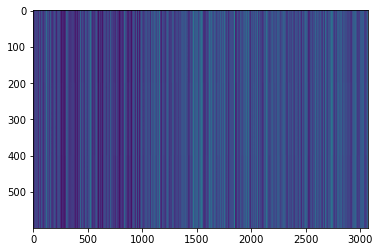

,AUC,pAUC
Source_0,0.558000,0.523158
Source_1,0.552800,0.492632
Source_2,0.576700,0.561579
Target_0,0.548900,0.533158
Target_1,0.553800,0.538947
Target_2,0.509000,0.514211
mean,0.549867,0.527281
h_mean,0.549086,0.526413


2021-04-26 16:22:41,221 - pytorch_modeler.py - INFO - epoch:1/300, train_losses:52.342188, val_AUC_hmean:0.549086, val_pAUC_hmean:0.526413, best_flag:True
2021-04-26 16:22:41,222 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.13it/s]
2021-04-26 16:22:41,708 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.86it/s]
2021-04-26 16:22:41,876 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.53it/s]
2021-04-26 16:22:42,055 - pytorch_modeler.py - INFO - epoch:2/300, train_losses:14.521951, val_AUC_hmean:0.530575, val_pAUC_hmean:0.513777, best_flag:False
2021-04-26 16:22:42,056 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.50it/s]
2021-04-26 16:22:42,503 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.58it/s]
2021-04-26 16:22:42,676 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.54it/s]
2021-04-26 16:22:42,853 -

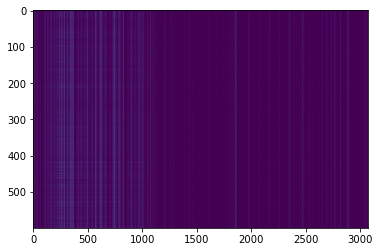

,AUC,pAUC
Source_0,0.541200,0.520000
Source_1,0.576800,0.528421
Source_2,0.577500,0.543684
Target_0,0.530200,0.538421
Target_1,0.551900,0.553158
Target_2,0.442100,0.488421
mean,0.536617,0.528684
h_mean,0.532246,0.527829


2021-04-26 16:22:45,361 - pytorch_modeler.py - INFO - epoch:5/300, train_losses:3.119782, val_AUC_hmean:0.532246, val_pAUC_hmean:0.527829, best_flag:True
2021-04-26 16:22:45,362 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.54it/s]
2021-04-26 16:22:45,805 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.59it/s]
2021-04-26 16:22:45,979 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.60it/s]


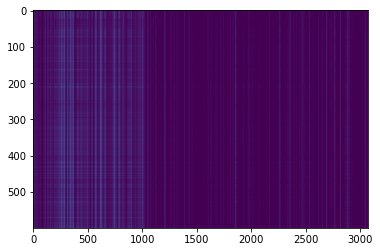

,AUC,pAUC
Source_0,0.595600,0.529474
Source_1,0.600800,0.556316
Source_2,0.614500,0.569474
Target_0,0.574000,0.589474
Target_1,0.626300,0.626316
Target_2,0.447600,0.491053
mean,0.576467,0.560351
h_mean,0.569058,0.557014


2021-04-26 16:22:47,106 - pytorch_modeler.py - INFO - epoch:6/300, train_losses:2.195991, val_AUC_hmean:0.569058, val_pAUC_hmean:0.557014, best_flag:True
2021-04-26 16:22:47,107 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.80it/s]
2021-04-26 16:22:47,527 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.43it/s]
2021-04-26 16:22:47,707 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


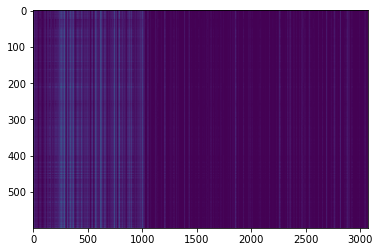

,AUC,pAUC
Source_0,0.662700,0.555789
Source_1,0.629000,0.560526
Source_2,0.669400,0.618421
Target_0,0.620900,0.647368
Target_1,0.695600,0.686316
Target_2,0.470000,0.518947
mean,0.624600,0.597895
h_mean,0.614218,0.592356


2021-04-26 16:22:48,886 - pytorch_modeler.py - INFO - epoch:7/300, train_losses:1.685201, val_AUC_hmean:0.614218, val_pAUC_hmean:0.592356, best_flag:True
2021-04-26 16:22:48,888 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.83it/s]
2021-04-26 16:22:49,304 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  7.36it/s]
2021-04-26 16:22:49,461 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  7.04it/s]


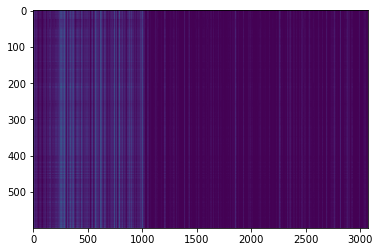

,AUC,pAUC
Source_0,0.698700,0.567368
Source_1,0.668300,0.549474
Source_2,0.705000,0.658947
Target_0,0.652800,0.670000
Target_1,0.754000,0.712105
Target_2,0.505400,0.525789
mean,0.664033,0.613947
h_mean,0.653399,0.606137


2021-04-26 16:22:50,553 - pytorch_modeler.py - INFO - epoch:8/300, train_losses:1.321574, val_AUC_hmean:0.653399, val_pAUC_hmean:0.606137, best_flag:True
2021-04-26 16:22:50,554 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.58it/s]
2021-04-26 16:22:50,993 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.96it/s]
2021-04-26 16:22:51,158 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  7.14it/s]


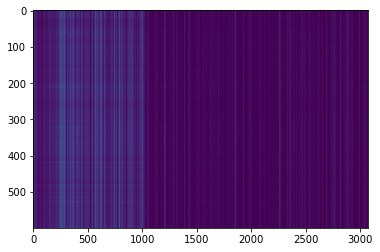

,AUC,pAUC
Source_0,0.707000,0.566316
Source_1,0.682800,0.547368
Source_2,0.726300,0.668421
Target_0,0.669100,0.674211
Target_1,0.800800,0.734211
Target_2,0.528600,0.548947
mean,0.685767,0.623246
h_mean,0.674846,0.615027


2021-04-26 16:22:52,272 - pytorch_modeler.py - INFO - epoch:9/300, train_losses:1.172444, val_AUC_hmean:0.674846, val_pAUC_hmean:0.615027, best_flag:True
2021-04-26 16:22:52,273 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.69it/s]
2021-04-26 16:22:52,817 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.49it/s]
2021-04-26 16:22:52,995 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.50it/s]
2021-04-26 16:22:53,175 - pytorch_modeler.py - INFO - epoch:10/300, train_losses:0.976410, val_AUC_hmean:0.680098, val_pAUC_hmean:0.612976, best_flag:False
2021-04-26 16:22:53,176 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.61it/s]
2021-04-26 16:22:53,733 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  7.24it/s]
2021-04-26 16:22:53,892 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.50it/s]
2021-04-26 16:22:54,069 - 

100%|██████████| 1/1 [00:00<00:00,  6.83it/s]
2021-04-26 16:23:06,263 - pytorch_modeler.py - INFO - epoch:26/300, train_losses:0.332527, val_AUC_hmean:0.580104, val_pAUC_hmean:0.520944, best_flag:False
2021-04-26 16:23:06,264 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.88it/s]
2021-04-26 16:23:06,676 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  7.20it/s]
2021-04-26 16:23:06,836 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  7.19it/s]
2021-04-26 16:23:06,999 - pytorch_modeler.py - INFO - epoch:27/300, train_losses:0.325028, val_AUC_hmean:0.560362, val_pAUC_hmean:0.514506, best_flag:False
2021-04-26 16:23:07,001 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.96it/s]
2021-04-26 16:23:07,406 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  7.13it/s]
2021-04-26 16:23:07,567 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00

100%|██████████| 2/2 [00:00<00:00,  3.49it/s]
2021-04-26 16:23:34,150 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.85it/s]
2021-04-26 16:23:34,315 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  7.13it/s]
2021-04-26 16:23:34,480 - pytorch_modeler.py - INFO - epoch:60/300, train_losses:0.257716, val_AUC_hmean:0.543272, val_pAUC_hmean:0.500882, best_flag:False
2021-04-26 16:23:34,481 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.59it/s]
2021-04-26 16:23:35,040 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.78it/s]
2021-04-26 16:23:35,208 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  7.17it/s]
2021-04-26 16:23:35,371 - pytorch_modeler.py - INFO - epoch:61/300, train_losses:0.255357, val_AUC_hmean:0.545278, val_pAUC_hmean:0.501420, best_flag:False
2021-04-26 16:23:35,372 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00

2021-04-26 16:23:48,910 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.61it/s]
2021-04-26 16:23:49,465 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.51it/s]
2021-04-26 16:23:49,639 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.96it/s]
2021-04-26 16:23:49,832 - pytorch_modeler.py - INFO - epoch:77/300, train_losses:0.240994, val_AUC_hmean:0.561249, val_pAUC_hmean:0.502215, best_flag:False
2021-04-26 16:23:49,834 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.41it/s]
2021-04-26 16:23:50,422 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.43it/s]
2021-04-26 16:23:50,601 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.43it/s]
2021-04-26 16:23:50,783 - pytorch_modeler.py - INFO - epoch:78/300, train_losses:0.235059, val_AUC_hmean:0.562205, val_pAUC_hmean:0.501523, best_flag:False
2021-04-26 16:23:50,784 

2021-04-26 16:24:02,953 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.83it/s]
2021-04-26 16:24:03,369 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.61it/s]
2021-04-26 16:24:03,540 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.74it/s]
2021-04-26 16:24:03,712 - pytorch_modeler.py - INFO - epoch:94/300, train_losses:0.217235, val_AUC_hmean:0.561898, val_pAUC_hmean:0.500595, best_flag:False
2021-04-26 16:24:03,713 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.90it/s]
2021-04-26 16:24:04,123 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  7.34it/s]
2021-04-26 16:24:04,280 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.76it/s]
2021-04-26 16:24:04,452 - pytorch_modeler.py - INFO - epoch:95/300, train_losses:0.212822, val_AUC_hmean:0.567868, val_pAUC_hmean:0.502488, best_flag:False
2021-04-26 16:24:04,453 

2021-04-26 16:24:16,095 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.79it/s]
2021-04-26 16:24:16,515 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  7.21it/s]
2021-04-26 16:24:16,676 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  7.00it/s]
2021-04-26 16:24:16,843 - pytorch_modeler.py - INFO - epoch:111/300, train_losses:0.198633, val_AUC_hmean:0.571863, val_pAUC_hmean:0.507657, best_flag:False
2021-04-26 16:24:16,844 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.64it/s]
2021-04-26 16:24:17,277 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.88it/s]
2021-04-26 16:24:17,443 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.18it/s]
2021-04-26 16:24:17,628 - pytorch_modeler.py - INFO - epoch:112/300, train_losses:0.196864, val_AUC_hmean:0.570655, val_pAUC_hmean:0.504911, best_flag:False
2021-04-26 16:24:17,62

2021-04-26 16:24:30,775 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.62it/s]
2021-04-26 16:24:31,331 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.29it/s]
2021-04-26 16:24:31,511 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  7.12it/s]
2021-04-26 16:24:31,676 - pytorch_modeler.py - INFO - epoch:128/300, train_losses:0.182952, val_AUC_hmean:0.575087, val_pAUC_hmean:0.504622, best_flag:False
2021-04-26 16:24:31,677 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.59it/s]
2021-04-26 16:24:32,237 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.61it/s]
2021-04-26 16:24:32,409 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.62it/s]
2021-04-26 16:24:32,583 - pytorch_modeler.py - INFO - epoch:129/300, train_losses:0.184341, val_AUC_hmean:0.570290, val_pAUC_hmean:0.506243, best_flag:False
2021-04-26 16:24:32,58

2021-04-26 16:24:46,186 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.69it/s]
2021-04-26 16:24:46,730 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.64it/s]
2021-04-26 16:24:46,902 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.98it/s]
2021-04-26 16:24:47,097 - pytorch_modeler.py - INFO - epoch:145/300, train_losses:0.175532, val_AUC_hmean:0.568450, val_pAUC_hmean:0.504431, best_flag:False
2021-04-26 16:24:47,098 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.43it/s]
2021-04-26 16:24:47,685 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.46it/s]
2021-04-26 16:24:47,861 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.25it/s]
2021-04-26 16:24:48,047 - pytorch_modeler.py - INFO - epoch:146/300, train_losses:0.170750, val_AUC_hmean:0.568485, val_pAUC_hmean:0.506262, best_flag:False
2021-04-26 16:24:48,04

2021-04-26 16:25:01,436 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.39it/s]
2021-04-26 16:25:01,895 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.90it/s]
2021-04-26 16:25:02,060 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.69it/s]
2021-04-26 16:25:02,236 - pytorch_modeler.py - INFO - epoch:162/300, train_losses:0.159055, val_AUC_hmean:0.581503, val_pAUC_hmean:0.508649, best_flag:False
2021-04-26 16:25:02,237 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.51it/s]
2021-04-26 16:25:02,683 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  7.10it/s]
2021-04-26 16:25:02,845 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.68it/s]
2021-04-26 16:25:03,047 - pytorch_modeler.py - INFO - epoch:163/300, train_losses:0.155460, val_AUC_hmean:0.580186, val_pAUC_hmean:0.507763, best_flag:False
2021-04-26 16:25:03,04

2021-04-26 16:25:15,475 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.67it/s]
2021-04-26 16:25:15,905 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.65it/s]
2021-04-26 16:25:16,076 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  7.08it/s]
2021-04-26 16:25:16,250 - pytorch_modeler.py - INFO - epoch:179/300, train_losses:0.146616, val_AUC_hmean:0.581049, val_pAUC_hmean:0.510592, best_flag:False
2021-04-26 16:25:16,251 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.58it/s]
2021-04-26 16:25:16,690 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.52it/s]
2021-04-26 16:25:16,866 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.44it/s]
2021-04-26 16:25:17,049 - pytorch_modeler.py - INFO - epoch:180/300, train_losses:0.146188, val_AUC_hmean:0.583988, val_pAUC_hmean:0.510225, best_flag:False
2021-04-26 16:25:17,05

2021-04-26 16:25:29,869 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.78it/s]
2021-04-26 16:25:30,401 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.60it/s]
2021-04-26 16:25:30,574 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.86it/s]
2021-04-26 16:25:30,771 - pytorch_modeler.py - INFO - epoch:196/300, train_losses:0.135124, val_AUC_hmean:0.582952, val_pAUC_hmean:0.508504, best_flag:False
2021-04-26 16:25:30,772 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.75it/s]
2021-04-26 16:25:31,307 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.39it/s]
2021-04-26 16:25:31,485 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.82it/s]
2021-04-26 16:25:31,656 - pytorch_modeler.py - INFO - epoch:197/300, train_losses:0.135249, val_AUC_hmean:0.578208, val_pAUC_hmean:0.510412, best_flag:False
2021-04-26 16:25:31,65

2021-04-26 16:25:45,365 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.57it/s]
2021-04-26 16:25:45,927 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.63it/s]
2021-04-26 16:25:46,098 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.87it/s]
2021-04-26 16:25:46,296 - pytorch_modeler.py - INFO - epoch:213/300, train_losses:0.129576, val_AUC_hmean:0.581777, val_pAUC_hmean:0.503352, best_flag:False
2021-04-26 16:25:46,297 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.48it/s]
2021-04-26 16:25:46,874 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.05it/s]
2021-04-26 16:25:47,069 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.58it/s]
2021-04-26 16:25:47,244 - pytorch_modeler.py - INFO - epoch:214/300, train_losses:0.126736, val_AUC_hmean:0.598904, val_pAUC_hmean:0.511930, best_flag:False
2021-04-26 16:25:47,24

2021-04-26 16:26:01,290 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.31it/s]
2021-04-26 16:26:01,897 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.43it/s]
2021-04-26 16:26:02,079 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.35it/s]
2021-04-26 16:26:02,260 - pytorch_modeler.py - INFO - epoch:230/300, train_losses:0.124376, val_AUC_hmean:0.578652, val_pAUC_hmean:0.505883, best_flag:False
2021-04-26 16:26:02,261 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.37it/s]
2021-04-26 16:26:02,857 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.90it/s]
2021-04-26 16:26:03,023 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.57it/s]
2021-04-26 16:26:03,202 - pytorch_modeler.py - INFO - epoch:231/300, train_losses:0.124898, val_AUC_hmean:0.572033, val_pAUC_hmean:0.505861, best_flag:False
2021-04-26 16:26:03,20

2021-04-26 16:26:16,751 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.69it/s]
2021-04-26 16:26:17,180 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.76it/s]
2021-04-26 16:26:17,348 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.27it/s]
2021-04-26 16:26:17,533 - pytorch_modeler.py - INFO - epoch:247/300, train_losses:0.113816, val_AUC_hmean:0.592817, val_pAUC_hmean:0.508548, best_flag:False
2021-04-26 16:26:17,535 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.51it/s]
2021-04-26 16:26:17,982 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.40it/s]
2021-04-26 16:26:18,160 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.22it/s]
2021-04-26 16:26:18,351 - pytorch_modeler.py - INFO - epoch:248/300, train_losses:0.112643, val_AUC_hmean:0.594408, val_pAUC_hmean:0.508877, best_flag:False
2021-04-26 16:26:18,35

2021-04-26 16:26:30,159 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.50it/s]
2021-04-26 16:26:30,605 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.29it/s]
2021-04-26 16:26:30,785 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.64it/s]
2021-04-26 16:26:30,959 - pytorch_modeler.py - INFO - epoch:264/300, train_losses:0.110438, val_AUC_hmean:0.567514, val_pAUC_hmean:0.515183, best_flag:False
2021-04-26 16:26:30,960 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.37it/s]
2021-04-26 16:26:31,419 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.55it/s]
2021-04-26 16:26:31,593 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.78it/s]
2021-04-26 16:26:31,772 - pytorch_modeler.py - INFO - epoch:265/300, train_losses:0.110825, val_AUC_hmean:0.569937, val_pAUC_hmean:0.515352, best_flag:False
2021-04-26 16:26:31,77

2021-04-26 16:26:44,730 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.51it/s]
2021-04-26 16:26:45,302 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.92it/s]
2021-04-26 16:26:45,465 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  7.09it/s]
2021-04-26 16:26:45,630 - pytorch_modeler.py - INFO - epoch:281/300, train_losses:0.115154, val_AUC_hmean:0.569762, val_pAUC_hmean:0.511799, best_flag:False
2021-04-26 16:26:45,631 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.70it/s]
2021-04-26 16:26:46,173 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  7.18it/s]
2021-04-26 16:26:46,331 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  7.10it/s]
2021-04-26 16:26:46,495 - pytorch_modeler.py - INFO - epoch:282/300, train_losses:0.114682, val_AUC_hmean:0.592850, val_pAUC_hmean:0.509261, best_flag:False
2021-04-26 16:26:46,49

2021-04-26 16:27:00,388 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.78it/s]
2021-04-26 16:27:00,919 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.85it/s]
2021-04-26 16:27:01,085 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  7.32it/s]
2021-04-26 16:27:01,244 - pytorch_modeler.py - INFO - epoch:298/300, train_losses:0.096988, val_AUC_hmean:0.592464, val_pAUC_hmean:0.512140, best_flag:False
2021-04-26 16:27:01,245 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.66it/s]
2021-04-26 16:27:01,795 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.80it/s]
2021-04-26 16:27:01,961 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.72it/s]
2021-04-26 16:27:02,132 - pytorch_modeler.py - INFO - epoch:299/300, train_losses:0.095399, val_AUC_hmean:0.589766, val_pAUC_hmean:0.508966, best_flag:False
2021-04-26 16:27:02,13

,AUC,pAUC
Source_0,0.707000,0.566316
Source_1,0.682800,0.547368
Source_2,0.726300,0.668421
Target_0,0.669100,0.674211
Target_1,0.800800,0.734211
Target_2,0.528600,0.548947
mean,0.685767,0.623246
h_mean,0.674846,0.615027


2021-04-26 16:27:03,023 - 00_train.py - INFO - TARGET MACHINE_TYPE: gearbox
2021-04-26 16:27:03,023 - 00_train.py - INFO - MAKE DATA_LOADER
2021-04-26 16:27:03,065 - 00_train.py - INFO - TRAINING


elapsed time: 265.795613289 [sec]


2021-04-26 16:27:03,285 - pytorch_modeler.py - INFO - train
  0%|          | 0/2 [00:00<?, ?it/s]

use: cuda:0


100%|██████████| 2/2 [00:00<00:00,  3.39it/s]
2021-04-26 16:27:03,876 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.12it/s]
2021-04-26 16:27:04,063 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.74it/s]


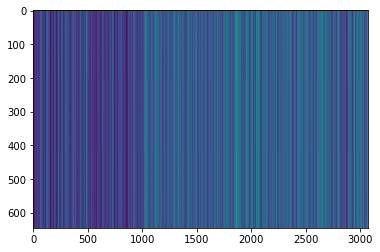

,AUC,pAUC
Source_0,0.364884,0.484866
Source_1,0.217678,0.477655
Source_2,0.392512,0.482654
Target_0,0.232928,0.479370
Target_1,0.199503,0.476753
Target_2,0.355079,0.473684
mean,0.293764,0.479164
h_mean,0.272676,0.479135


2021-04-26 16:27:05,239 - pytorch_modeler.py - INFO - epoch:1/300, train_losses:51.989895, val_AUC_hmean:0.272676, val_pAUC_hmean:0.479135, best_flag:True
2021-04-26 16:27:05,240 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.37it/s]
2021-04-26 16:27:05,836 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.30it/s]
2021-04-26 16:27:06,050 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.99it/s]
2021-04-26 16:27:06,244 - pytorch_modeler.py - INFO - epoch:2/300, train_losses:12.942142, val_AUC_hmean:0.189496, val_pAUC_hmean:0.476685, best_flag:False
2021-04-26 16:27:06,245 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.48it/s]
2021-04-26 16:27:06,821 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.78it/s]
2021-04-26 16:27:07,017 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.41it/s]
2021-04-26 16:27:07,228 -

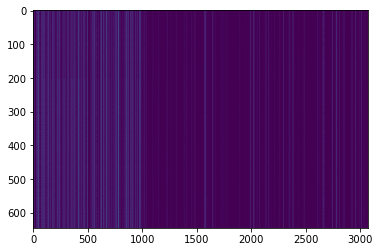

,AUC,pAUC
Source_0,0.490842,0.493092
Source_1,0.366255,0.476301
Source_2,0.448269,0.478769
Target_0,0.538484,0.480080
Target_1,0.366169,0.487853
Target_2,0.466587,0.492690
mean,0.446101,0.484798
h_mean,0.437008,0.484704


2021-04-26 16:27:10,043 - pytorch_modeler.py - INFO - epoch:5/300, train_losses:3.191675, val_AUC_hmean:0.437008, val_pAUC_hmean:0.484704, best_flag:True
2021-04-26 16:27:10,044 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.82it/s]
2021-04-26 16:27:10,569 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.31it/s]
2021-04-26 16:27:10,757 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.63it/s]
2021-04-26 16:27:10,930 - pytorch_modeler.py - INFO - epoch:6/300, train_losses:2.348803, val_AUC_hmean:0.582772, val_pAUC_hmean:0.483765, best_flag:False
2021-04-26 16:27:10,931 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.82it/s]
2021-04-26 16:27:11,457 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.24it/s]
2021-04-26 16:27:11,640 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.47it/s]


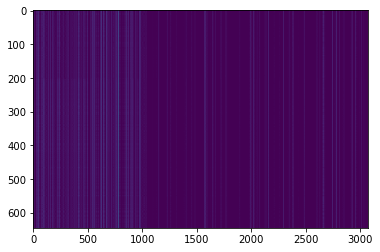

,AUC,pAUC
Source_0,0.577241,0.505816
Source_1,0.639660,0.481806
Source_2,0.548041,0.479829
Target_0,0.691744,0.493076
Target_1,0.664523,0.480272
Target_2,0.592738,0.483709
mean,0.618991,0.487418
h_mean,0.614884,0.487242


2021-04-26 16:27:12,711 - pytorch_modeler.py - INFO - epoch:7/300, train_losses:1.760754, val_AUC_hmean:0.614884, val_pAUC_hmean:0.487242, best_flag:True
2021-04-26 16:27:12,712 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.42it/s]
2021-04-26 16:27:13,298 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.02it/s]
2021-04-26 16:27:13,489 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.23it/s]
2021-04-26 16:27:13,674 - pytorch_modeler.py - INFO - epoch:8/300, train_losses:1.477399, val_AUC_hmean:0.620782, val_pAUC_hmean:0.485348, best_flag:False
2021-04-26 16:27:13,675 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.69it/s]
2021-04-26 16:27:14,219 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.38it/s]
2021-04-26 16:27:14,398 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.50it/s]


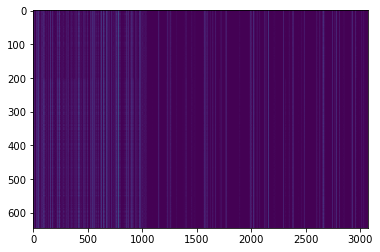

,AUC,pAUC
Source_0,0.584713,0.501574
Source_1,0.659294,0.492546
Source_2,0.553140,0.479970
Target_0,0.697820,0.491248
Target_1,0.675497,0.485958
Target_2,0.587857,0.483918
mean,0.626387,0.489202
h_mean,0.621801,0.489104


2021-04-26 16:27:15,562 - pytorch_modeler.py - INFO - epoch:9/300, train_losses:1.225254, val_AUC_hmean:0.621801, val_pAUC_hmean:0.489104, best_flag:True
2021-04-26 16:27:15,563 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.66it/s]
2021-04-26 16:27:16,112 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.08it/s]
2021-04-26 16:27:16,299 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.51it/s]


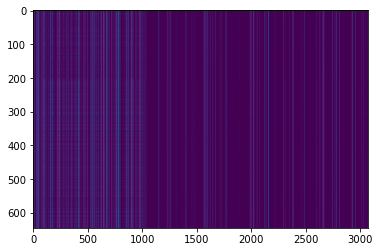

,AUC,pAUC
Source_0,0.588327,0.504659
Source_1,0.665466,0.485236
Source_2,0.551396,0.476651
Target_0,0.702257,0.503127
Target_1,0.678155,0.483250
Target_2,0.585317,0.483083
mean,0.628486,0.489334
h_mean,0.623502,0.489105


2021-04-26 16:27:17,428 - pytorch_modeler.py - INFO - epoch:10/300, train_losses:1.011594, val_AUC_hmean:0.623502, val_pAUC_hmean:0.489105, best_flag:True
2021-04-26 16:27:17,430 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.43it/s]
2021-04-26 16:27:18,015 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  3.11it/s]
2021-04-26 16:27:18,359 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  3.32it/s]


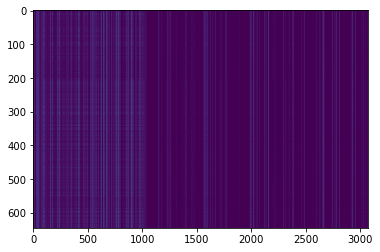

,AUC,pAUC
Source_0,0.602589,0.516484
Source_1,0.671896,0.492816
Source_2,0.558843,0.474673
Target_0,0.718075,0.529626
Target_1,0.686214,0.481626
Target_2,0.592302,0.481203
mean,0.638320,0.496071
h_mean,0.633215,0.495271


2021-04-26 16:27:19,681 - pytorch_modeler.py - INFO - epoch:11/300, train_losses:0.909584, val_AUC_hmean:0.633215, val_pAUC_hmean:0.495271, best_flag:True
2021-04-26 16:27:19,682 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.82it/s]
2021-04-26 16:27:20,100 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.28it/s]
2021-04-26 16:27:20,279 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.92it/s]
2021-04-26 16:27:20,447 - pytorch_modeler.py - INFO - epoch:12/300, train_losses:0.833940, val_AUC_hmean:0.628614, val_pAUC_hmean:0.490706, best_flag:False
2021-04-26 16:27:20,448 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.69it/s]
2021-04-26 16:27:20,877 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.72it/s]
2021-04-26 16:27:21,046 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  7.06it/s]
2021-04-26 16:27:21,210 -

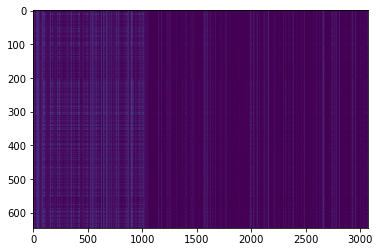

,AUC,pAUC
Source_0,0.606984,0.514042
Source_1,0.639060,0.486319
Source_2,0.535695,0.481877
Target_0,0.721836,0.541910
Target_1,0.656807,0.475309
Target_2,0.593571,0.486216
mean,0.625659,0.497612
h_mean,0.620372,0.496575


2021-04-26 16:27:22,833 - pytorch_modeler.py - INFO - epoch:14/300, train_losses:0.692830, val_AUC_hmean:0.620372, val_pAUC_hmean:0.496575, best_flag:True
2021-04-26 16:27:22,834 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.74it/s]
2021-04-26 16:27:23,258 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.79it/s]
2021-04-26 16:27:23,453 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.43it/s]
2021-04-26 16:27:23,633 - pytorch_modeler.py - INFO - epoch:15/300, train_losses:0.623565, val_AUC_hmean:0.618870, val_pAUC_hmean:0.494142, best_flag:False
2021-04-26 16:27:23,635 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.57it/s]
2021-04-26 16:27:24,075 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.28it/s]
2021-04-26 16:27:24,256 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.21it/s]
2021-04-26 16:27:24,439 -

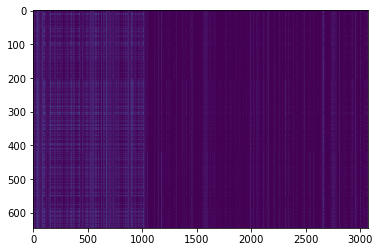

,AUC,pAUC
Source_0,0.619780,0.536277
Source_1,0.653978,0.495434
Source_2,0.550725,0.483855
Target_0,0.739390,0.567394
Target_1,0.680298,0.489387
Target_2,0.601905,0.487260
mean,0.641013,0.509934
h_mean,0.635447,0.508130


2021-04-26 16:27:26,184 - pytorch_modeler.py - INFO - epoch:17/300, train_losses:0.530076, val_AUC_hmean:0.635447, val_pAUC_hmean:0.508130, best_flag:True
2021-04-26 16:27:26,185 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.64it/s]
2021-04-26 16:27:26,618 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.54it/s]
2021-04-26 16:27:26,794 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.84it/s]


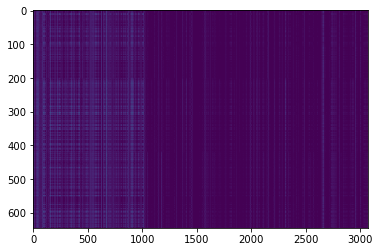

,AUC,pAUC
Source_0,0.623590,0.533963
Source_1,0.661951,0.505812
Source_2,0.551463,0.487457
Target_0,0.736304,0.558764
Target_1,0.687500,0.504729
Target_2,0.601984,0.484336
mean,0.643799,0.512510
h_mean,0.638195,0.511209


2021-04-26 16:27:27,881 - pytorch_modeler.py - INFO - epoch:18/300, train_losses:0.509638, val_AUC_hmean:0.638195, val_pAUC_hmean:0.511209, best_flag:True
2021-04-26 16:27:27,882 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.81it/s]
2021-04-26 16:27:28,300 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.32it/s]
2021-04-26 16:27:28,482 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.79it/s]


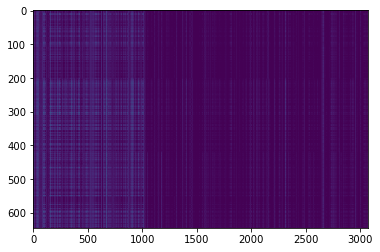

,AUC,pAUC
Source_0,0.624127,0.538719
Source_1,0.662980,0.507978
Source_2,0.544887,0.487457
Target_0,0.738329,0.554601
Target_1,0.685785,0.512400
Target_2,0.596032,0.483292
mean,0.642023,0.514074
h_mean,0.635851,0.512814


2021-04-26 16:27:29,636 - pytorch_modeler.py - INFO - epoch:19/300, train_losses:0.489357, val_AUC_hmean:0.635851, val_pAUC_hmean:0.512814, best_flag:True
2021-04-26 16:27:29,637 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.46it/s]
2021-04-26 16:27:30,088 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.54it/s]
2021-04-26 16:27:30,263 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.23it/s]


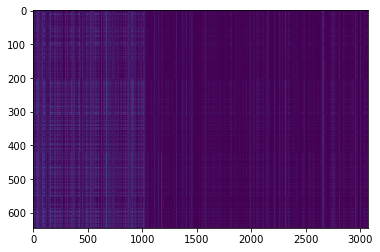

,AUC,pAUC
Source_0,0.637802,0.553371
Source_1,0.707219,0.555086
Source_2,0.558306,0.493107
Target_0,0.769290,0.614705
Target_1,0.757973,0.598946
Target_2,0.615000,0.492063
mean,0.674265,0.551213
h_mean,0.665319,0.547184


2021-04-26 16:27:31,349 - pytorch_modeler.py - INFO - epoch:20/300, train_losses:0.464823, val_AUC_hmean:0.665319, val_pAUC_hmean:0.547184, best_flag:True
2021-04-26 16:27:31,351 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.41it/s]
2021-04-26 16:27:31,806 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.86it/s]
2021-04-26 16:27:32,000 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


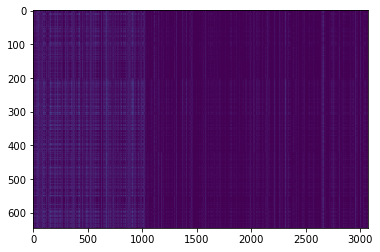

,AUC,pAUC
Source_0,0.646300,0.549515
Source_1,0.722136,0.579904
Source_2,0.565150,0.497415
Target_0,0.786265,0.622624
Target_1,0.768004,0.625569
Target_2,0.628571,0.503133
mean,0.686071,0.563027
h_mean,0.676719,0.558306


2021-04-26 16:27:33,113 - pytorch_modeler.py - INFO - epoch:21/300, train_losses:0.447990, val_AUC_hmean:0.676719, val_pAUC_hmean:0.558306, best_flag:True
2021-04-26 16:27:33,114 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.50it/s]
2021-04-26 16:27:33,560 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.85it/s]
2021-04-26 16:27:33,756 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.48it/s]
2021-04-26 16:27:33,964 - pytorch_modeler.py - INFO - epoch:22/300, train_losses:0.425642, val_AUC_hmean:0.662563, val_pAUC_hmean:0.542748, best_flag:False
2021-04-26 16:27:33,965 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.78it/s]
2021-04-26 16:27:34,385 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.48it/s]
2021-04-26 16:27:34,561 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.50it/s]
2021-04-26 16:27:34,739 -

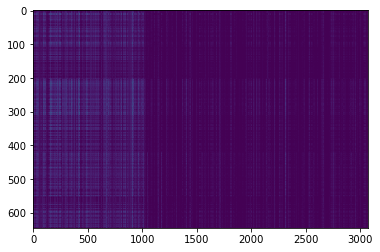

,AUC,pAUC
Source_0,0.658168,0.555299
Source_1,0.796296,0.645874
Source_2,0.583266,0.502783
Target_0,0.786651,0.620695
Target_1,0.800583,0.662389
Target_2,0.646746,0.497494
mean,0.711952,0.580756
h_mean,0.701249,0.573125


2021-04-26 16:27:38,925 - pytorch_modeler.py - INFO - epoch:27/300, train_losses:0.377873, val_AUC_hmean:0.701249, val_pAUC_hmean:0.573125, best_flag:True
2021-04-26 16:27:38,926 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.61it/s]
2021-04-26 16:27:39,363 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.36it/s]
2021-04-26 16:27:39,542 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.37it/s]


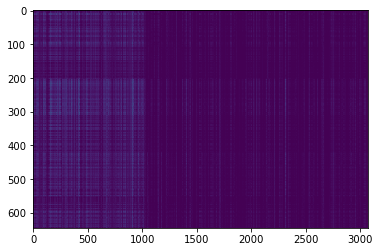

,AUC,pAUC
Source_0,0.668816,0.568023
Source_1,0.821759,0.705436
Source_2,0.596685,0.506667
Target_0,0.799093,0.628513
Target_1,0.819359,0.693163
Target_2,0.661190,0.508145
mean,0.727817,0.601658
h_mean,0.716648,0.590935


2021-04-26 16:27:40,635 - pytorch_modeler.py - INFO - epoch:28/300, train_losses:0.373563, val_AUC_hmean:0.716648, val_pAUC_hmean:0.590935, best_flag:True
2021-04-26 16:27:40,635 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.81it/s]
2021-04-26 16:27:41,054 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.47it/s]
2021-04-26 16:27:41,262 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.87it/s]


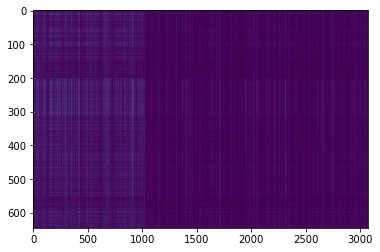

,AUC,pAUC
Source_0,0.672039,0.578305
Source_1,0.813100,0.716807
Source_2,0.603261,0.519098
Target_0,0.809124,0.639173
Target_1,0.815586,0.703271
Target_2,0.666587,0.520050
mean,0.729950,0.612784
h_mean,0.719621,0.602408


2021-04-26 16:27:42,378 - pytorch_modeler.py - INFO - epoch:29/300, train_losses:0.362272, val_AUC_hmean:0.719621, val_pAUC_hmean:0.602408, best_flag:True
2021-04-26 16:27:42,378 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.64it/s]
2021-04-26 16:27:42,812 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.44it/s]
2021-04-26 16:27:42,993 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.91it/s]
2021-04-26 16:27:43,187 - pytorch_modeler.py - INFO - epoch:30/300, train_losses:0.359478, val_AUC_hmean:0.710931, val_pAUC_hmean:0.584065, best_flag:False
2021-04-26 16:27:43,188 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.54it/s]
2021-04-26 16:27:43,631 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.06it/s]
2021-04-26 16:27:43,818 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.75it/s]


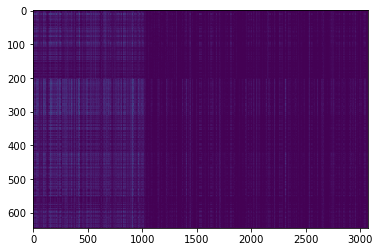

,AUC,pAUC
Source_0,0.668864,0.577662
Source_1,0.844393,0.726374
Source_2,0.625067,0.516202
Target_0,0.816647,0.648615
Target_1,0.853138,0.733683
Target_2,0.686905,0.542189
mean,0.749169,0.624121
h_mean,0.737858,0.612610


2021-04-26 16:27:44,944 - pytorch_modeler.py - INFO - epoch:31/300, train_losses:0.358114, val_AUC_hmean:0.737858, val_pAUC_hmean:0.612610, best_flag:True
2021-04-26 16:27:44,945 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.38it/s]
2021-04-26 16:27:45,403 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.34it/s]
2021-04-26 16:27:45,586 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.25it/s]


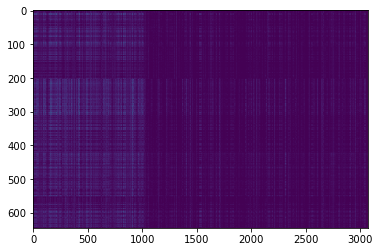

,AUC,pAUC
Source_0,0.688498,0.587944
Source_1,0.854681,0.745686
Source_2,0.649155,0.545230
Target_0,0.833623,0.673286
Target_1,0.867027,0.761118
Target_2,0.726905,0.602757
mean,0.769981,0.652670
h_mean,0.760304,0.642802


2021-04-26 16:27:46,726 - pytorch_modeler.py - INFO - epoch:32/300, train_losses:0.346889, val_AUC_hmean:0.760304, val_pAUC_hmean:0.642802, best_flag:True
2021-04-26 16:27:46,728 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.44it/s]
2021-04-26 16:27:47,181 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.39it/s]
2021-04-26 16:27:47,361 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.98it/s]
2021-04-26 16:27:47,551 - pytorch_modeler.py - INFO - epoch:33/300, train_losses:0.345883, val_AUC_hmean:0.754839, val_pAUC_hmean:0.640867, best_flag:False
2021-04-26 16:27:47,552 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.53it/s]
2021-04-26 16:27:47,996 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.79it/s]
2021-04-26 16:27:48,193 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


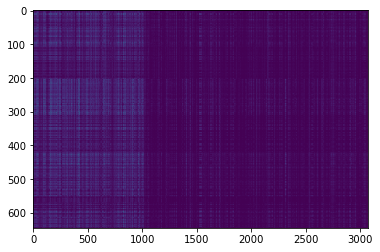

,AUC,pAUC
Source_0,0.704225,0.599512
Source_1,0.872085,0.768970
Source_2,0.655327,0.542193
Target_0,0.843268,0.693287
Target_1,0.885717,0.776550
Target_2,0.722143,0.594820
mean,0.780461,0.662555
h_mean,0.769992,0.650466


2021-04-26 16:27:49,387 - pytorch_modeler.py - INFO - epoch:34/300, train_losses:0.341417, val_AUC_hmean:0.769992, val_pAUC_hmean:0.650466, best_flag:True
2021-04-26 16:27:49,388 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.62it/s]
2021-04-26 16:27:49,823 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.40it/s]
2021-04-26 16:27:50,036 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.02it/s]
2021-04-26 16:27:50,231 - pytorch_modeler.py - INFO - epoch:35/300, train_losses:0.338452, val_AUC_hmean:0.750596, val_pAUC_hmean:0.627147, best_flag:False
2021-04-26 16:27:50,232 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.28it/s]
2021-04-26 16:27:50,702 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.36it/s]
2021-04-26 16:27:50,879 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.43it/s]
2021-04-26 16:27:51,058 -

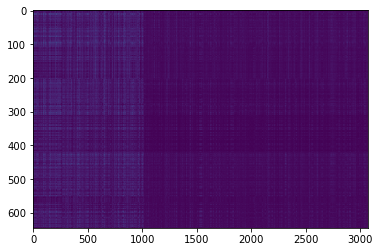

,AUC,pAUC
Source_0,0.708962,0.593856
Source_1,0.865055,0.756155
Source_2,0.654589,0.554270
Target_0,0.855517,0.693186
Target_1,0.897119,0.806602
Target_2,0.733810,0.615915
mean,0.785842,0.669997
h_mean,0.775144,0.658144


2021-04-26 16:27:53,616 - pytorch_modeler.py - INFO - epoch:38/300, train_losses:0.332520, val_AUC_hmean:0.775144, val_pAUC_hmean:0.658144, best_flag:True
2021-04-26 16:27:53,618 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.65it/s]
2021-04-26 16:27:54,050 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.38it/s]
2021-04-26 16:27:54,228 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.59it/s]


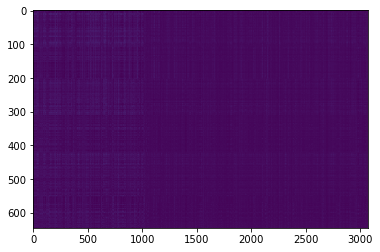

,AUC,pAUC
Source_0,0.709988,0.598355
Source_1,0.885031,0.778536
Source_2,0.662641,0.559355
Target_0,0.858410,0.689327
Target_1,0.900634,0.803354
Target_2,0.737540,0.619883
mean,0.792374,0.674802
h_mean,0.781390,0.662825


2021-04-26 16:27:55,311 - pytorch_modeler.py - INFO - epoch:39/300, train_losses:0.327249, val_AUC_hmean:0.781390, val_pAUC_hmean:0.662825, best_flag:True
2021-04-26 16:27:55,311 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.36it/s]
2021-04-26 16:27:55,772 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.86it/s]
2021-04-26 16:27:55,966 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.26it/s]


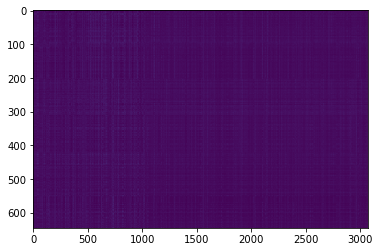

,AUC,pAUC
Source_0,0.710623,0.609023
Source_1,0.898062,0.783499
Source_2,0.679415,0.562463
Target_0,0.874035,0.710547
Target_1,0.913152,0.815898
Target_2,0.737143,0.592941
mean,0.802072,0.679062
h_mean,0.790681,0.665505


2021-04-26 16:27:57,196 - pytorch_modeler.py - INFO - epoch:40/300, train_losses:0.325379, val_AUC_hmean:0.790681, val_pAUC_hmean:0.665505, best_flag:True
2021-04-26 16:27:57,198 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.17it/s]
2021-04-26 16:27:57,832 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.13it/s]
2021-04-26 16:27:58,019 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.33it/s]
2021-04-26 16:27:58,234 - pytorch_modeler.py - INFO - epoch:41/300, train_losses:0.322597, val_AUC_hmean:0.794507, val_pAUC_hmean:0.664737, best_flag:False
2021-04-26 16:27:58,236 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.28it/s]
2021-04-26 16:27:58,847 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.54it/s]
2021-04-26 16:27:59,021 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.28it/s]


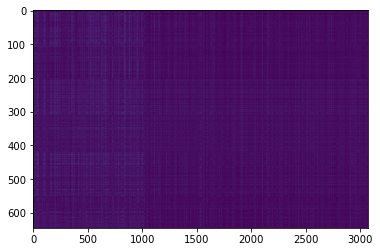

,AUC,pAUC
Source_0,0.727619,0.603367
Source_1,0.912294,0.812920
Source_2,0.681159,0.578001
Target_0,0.878279,0.689632
Target_1,0.905607,0.804707
Target_2,0.734762,0.599624
mean,0.806620,0.681375
h_mean,0.795505,0.668297


2021-04-26 16:28:00,139 - pytorch_modeler.py - INFO - epoch:42/300, train_losses:0.317909, val_AUC_hmean:0.795505, val_pAUC_hmean:0.668297, best_flag:True
2021-04-26 16:28:00,140 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.48it/s]
2021-04-26 16:28:00,717 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.57it/s]
2021-04-26 16:28:00,890 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.18it/s]


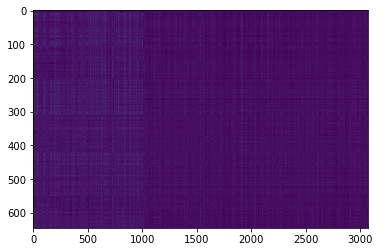

,AUC,pAUC
Source_0,0.731087,0.609280
Source_1,0.892490,0.813461
Source_2,0.695988,0.593256
Target_0,0.881366,0.697856
Target_1,0.907150,0.808137
Target_2,0.737460,0.613617
mean,0.807590,0.689268
h_mean,0.798079,0.677487


2021-04-26 16:28:02,055 - pytorch_modeler.py - INFO - epoch:43/300, train_losses:0.312866, val_AUC_hmean:0.798079, val_pAUC_hmean:0.677487, best_flag:True
2021-04-26 16:28:02,056 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.51it/s]
2021-04-26 16:28:02,627 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.12it/s]
2021-04-26 16:28:02,817 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.12it/s]
2021-04-26 16:28:03,007 - pytorch_modeler.py - INFO - epoch:44/300, train_losses:0.307169, val_AUC_hmean:0.777764, val_pAUC_hmean:0.659062, best_flag:False
2021-04-26 16:28:03,009 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.30it/s]
2021-04-26 16:28:03,616 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.75it/s]
2021-04-26 16:28:03,812 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.42it/s]


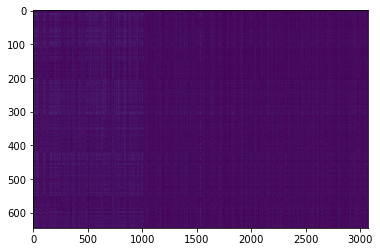

,AUC,pAUC
Source_0,0.722100,0.602468
Source_1,0.895405,0.808678
Source_2,0.704308,0.587394
Target_0,0.867863,0.705166
Target_1,0.911265,0.813371
Target_2,0.739048,0.624269
mean,0.806665,0.690224
h_mean,0.797425,0.678097


2021-04-26 16:28:04,940 - pytorch_modeler.py - INFO - epoch:45/300, train_losses:0.309157, val_AUC_hmean:0.797425, val_pAUC_hmean:0.678097, best_flag:True
2021-04-26 16:28:04,941 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.55it/s]
2021-04-26 16:28:05,506 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.25it/s]
2021-04-26 16:28:05,690 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.48it/s]
2021-04-26 16:28:05,868 - pytorch_modeler.py - INFO - epoch:46/300, train_losses:0.302110, val_AUC_hmean:0.785126, val_pAUC_hmean:0.662043, best_flag:False
2021-04-26 16:28:05,869 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.56it/s]
2021-04-26 16:28:06,433 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.20it/s]
2021-04-26 16:28:06,616 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.39it/s]
2021-04-26 16:28:06,798 -

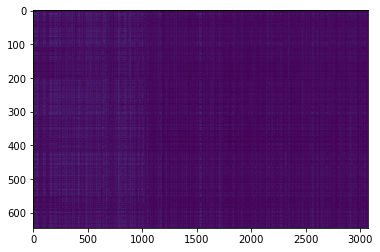

,AUC,pAUC
Source_0,0.702857,0.599512
Source_1,0.928241,0.840354
Source_2,0.700819,0.576447
Target_0,0.856192,0.706993
Target_1,0.916324,0.819056
Target_2,0.748730,0.619883
mean,0.808860,0.693708
h_mean,0.797676,0.678631


2021-04-26 16:28:08,714 - pytorch_modeler.py - INFO - epoch:48/300, train_losses:0.293682, val_AUC_hmean:0.797676, val_pAUC_hmean:0.678631, best_flag:True
2021-04-26 16:28:08,715 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.45it/s]
2021-04-26 16:28:09,297 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.22it/s]
2021-04-26 16:28:09,482 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.98it/s]
2021-04-26 16:28:09,675 - pytorch_modeler.py - INFO - epoch:49/300, train_losses:0.295398, val_AUC_hmean:0.790046, val_pAUC_hmean:0.670119, best_flag:False
2021-04-26 16:28:09,676 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.60it/s]
2021-04-26 16:28:10,234 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.20it/s]
2021-04-26 16:28:10,416 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.15it/s]
2021-04-26 16:28:10,608 -

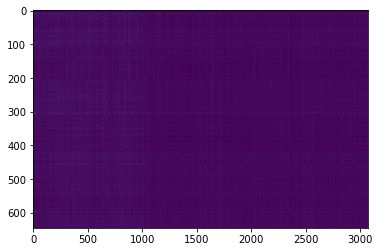

,AUC,pAUC
Source_0,0.686252,0.605552
Source_1,0.923868,0.809490
Source_2,0.720478,0.593610
Target_0,0.864776,0.703338
Target_1,0.916752,0.824381
Target_2,0.755635,0.641395
mean,0.811294,0.696294
h_mean,0.800199,0.684520


2021-04-26 16:28:12,520 - pytorch_modeler.py - INFO - epoch:51/300, train_losses:0.289004, val_AUC_hmean:0.800199, val_pAUC_hmean:0.684520, best_flag:True
2021-04-26 16:28:12,521 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.49it/s]
2021-04-26 16:28:13,097 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.50it/s]
2021-04-26 16:28:13,275 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.62it/s]


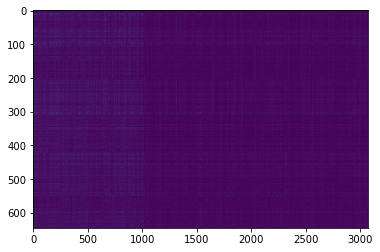

,AUC,pAUC
Source_0,0.688010,0.603624
Source_1,0.921811,0.810754
Source_2,0.727925,0.596364
Target_0,0.868152,0.703541
Target_1,0.921039,0.826457
Target_2,0.765397,0.651003
mean,0.815389,0.698624
h_mean,0.804703,0.686942


2021-04-26 16:28:14,353 - pytorch_modeler.py - INFO - epoch:52/300, train_losses:0.286096, val_AUC_hmean:0.804703, val_pAUC_hmean:0.686942, best_flag:True
2021-04-26 16:28:14,354 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.51it/s]
2021-04-26 16:28:14,927 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  3.17it/s]
2021-04-26 16:28:15,270 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  3.37it/s]
2021-04-26 16:28:15,591 - pytorch_modeler.py - INFO - epoch:53/300, train_losses:0.284477, val_AUC_hmean:0.808761, val_pAUC_hmean:0.686729, best_flag:False
2021-04-26 16:28:15,592 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.45it/s]
2021-04-26 16:28:16,174 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  3.11it/s]
2021-04-26 16:28:16,517 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  3.42it/s]
2021-04-26 16:28:16,835 -

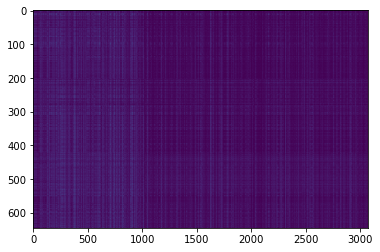

,AUC,pAUC
Source_0,0.610403,0.614806
Source_1,0.847394,0.798300
Source_2,0.686728,0.617764
Target_0,0.840374,0.700699
Target_1,0.891289,0.810212
Target_2,0.744127,0.655180
mean,0.770053,0.699493
h_mean,0.756591,0.690797


2021-04-26 16:28:24,690 - pytorch_modeler.py - INFO - epoch:62/300, train_losses:0.282279, val_AUC_hmean:0.756591, val_pAUC_hmean:0.690797, best_flag:True
2021-04-26 16:28:24,691 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.50it/s]
2021-04-26 16:28:25,139 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.21it/s]
2021-04-26 16:28:25,326 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.63it/s]
2021-04-26 16:28:25,501 - pytorch_modeler.py - INFO - epoch:63/300, train_losses:0.278990, val_AUC_hmean:0.756581, val_pAUC_hmean:0.680946, best_flag:False
2021-04-26 16:28:25,502 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.37it/s]
2021-04-26 16:28:25,962 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.27it/s]
2021-04-26 16:28:26,143 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.74it/s]
2021-04-26 16:28:26,318 -

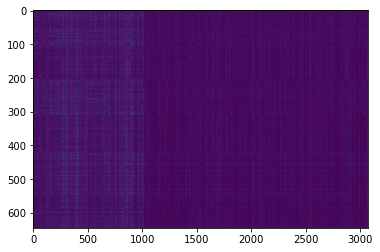

,AUC,pAUC
Source_0,0.659341,0.617248
Source_1,0.890261,0.800917
Source_2,0.724034,0.612467
Target_0,0.842496,0.717146
Target_1,0.919839,0.817342
Target_2,0.770794,0.658521
mean,0.801127,0.703940
h_mean,0.790249,0.694617


2021-04-26 16:28:37,356 - pytorch_modeler.py - INFO - epoch:77/300, train_losses:0.249099, val_AUC_hmean:0.790249, val_pAUC_hmean:0.694617, best_flag:True
2021-04-26 16:28:37,357 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.65it/s]
2021-04-26 16:28:37,789 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.92it/s]
2021-04-26 16:28:37,981 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.62it/s]
2021-04-26 16:28:38,155 - pytorch_modeler.py - INFO - epoch:78/300, train_losses:0.248192, val_AUC_hmean:0.803000, val_pAUC_hmean:0.685682, best_flag:False
2021-04-26 16:28:38,156 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.73it/s]
2021-04-26 16:28:38,581 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.58it/s]
2021-04-26 16:28:38,755 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.85it/s]


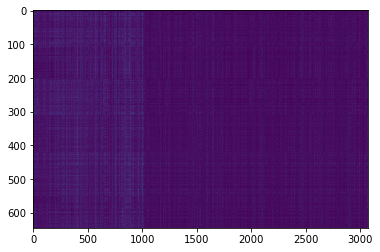

,AUC,pAUC
Source_0,0.686740,0.616606
Source_1,0.902778,0.807234
Source_2,0.727657,0.611690
Target_0,0.882427,0.728923
Target_1,0.915809,0.814544
Target_2,0.761746,0.654762
mean,0.812859,0.705626
h_mean,0.802561,0.695875


2021-04-26 16:28:39,856 - pytorch_modeler.py - INFO - epoch:79/300, train_losses:0.245104, val_AUC_hmean:0.802561, val_pAUC_hmean:0.695875, best_flag:True
2021-04-26 16:28:39,857 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.76it/s]
2021-04-26 16:28:40,279 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.57it/s]
2021-04-26 16:28:40,454 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.69it/s]
2021-04-26 16:28:40,628 - pytorch_modeler.py - INFO - epoch:80/300, train_losses:0.243271, val_AUC_hmean:0.805973, val_pAUC_hmean:0.683614, best_flag:False
2021-04-26 16:28:40,629 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.84it/s]
2021-04-26 16:28:41,045 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.61it/s]
2021-04-26 16:28:41,216 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.63it/s]
2021-04-26 16:28:41,392 -

100%|██████████| 1/1 [00:00<00:00,  6.51it/s]
2021-04-26 16:28:53,334 - pytorch_modeler.py - INFO - epoch:96/300, train_losses:0.230393, val_AUC_hmean:0.786209, val_pAUC_hmean:0.673323, best_flag:False
2021-04-26 16:28:53,335 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.69it/s]
2021-04-26 16:28:53,763 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.54it/s]
2021-04-26 16:28:53,937 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.71it/s]
2021-04-26 16:28:54,111 - pytorch_modeler.py - INFO - epoch:97/300, train_losses:0.240857, val_AUC_hmean:0.804831, val_pAUC_hmean:0.684191, best_flag:False
2021-04-26 16:28:54,112 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.76it/s]
2021-04-26 16:28:54,534 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.63it/s]
2021-04-26 16:28:54,705 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00

100%|██████████| 1/1 [00:00<00:00,  6.21it/s]
2021-04-26 16:29:06,793 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.81it/s]
2021-04-26 16:29:06,963 - pytorch_modeler.py - INFO - epoch:113/300, train_losses:0.195889, val_AUC_hmean:0.804865, val_pAUC_hmean:0.690711, best_flag:False
2021-04-26 16:29:06,965 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.82it/s]
2021-04-26 16:29:07,381 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.03it/s]
2021-04-26 16:29:07,567 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.80it/s]
2021-04-26 16:29:07,737 - pytorch_modeler.py - INFO - epoch:114/300, train_losses:0.195196, val_AUC_hmean:0.803405, val_pAUC_hmean:0.691031, best_flag:False
2021-04-26 16:29:07,738 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.76it/s]
2021-04-26 16:29:08,161 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [

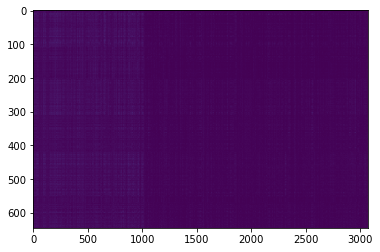

,AUC,pAUC
Source_0,0.725470,0.630229
Source_1,0.932270,0.801188
Source_2,0.701087,0.588595
Target_0,0.892843,0.754000
Target_1,0.930641,0.832503
Target_2,0.801349,0.657268
mean,0.830610,0.710631
h_mean,0.819687,0.699078


2021-04-26 16:29:18,277 - pytorch_modeler.py - INFO - epoch:126/300, train_losses:0.180576, val_AUC_hmean:0.819687, val_pAUC_hmean:0.699078, best_flag:True
2021-04-26 16:29:18,278 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.74it/s]
2021-04-26 16:29:18,702 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.64it/s]
2021-04-26 16:29:18,874 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.82it/s]
2021-04-26 16:29:19,045 - pytorch_modeler.py - INFO - epoch:127/300, train_losses:0.181246, val_AUC_hmean:0.811878, val_pAUC_hmean:0.698428, best_flag:False
2021-04-26 16:29:19,046 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.79it/s]
2021-04-26 16:29:19,466 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.40it/s]
2021-04-26 16:29:19,642 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.62it/s]
2021-04-26 16:29:19,818

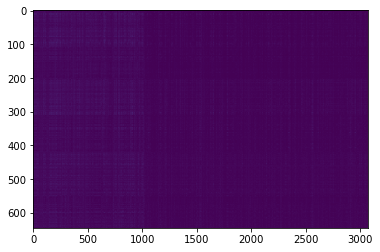

,AUC,pAUC
Source_0,0.661783,0.624960
Source_1,0.921639,0.825193
Source_2,0.729402,0.604345
Target_0,0.883198,0.737350
Target_1,0.935185,0.848386
Target_2,0.773095,0.653509
mean,0.817384,0.715624
h_mean,0.804059,0.703256


2021-04-26 16:29:23,131 - pytorch_modeler.py - INFO - epoch:131/300, train_losses:0.173878, val_AUC_hmean:0.804059, val_pAUC_hmean:0.703256, best_flag:True
2021-04-26 16:29:23,132 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.45it/s]
2021-04-26 16:29:23,584 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.08it/s]
2021-04-26 16:29:23,772 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.64it/s]
2021-04-26 16:29:23,947 - pytorch_modeler.py - INFO - epoch:132/300, train_losses:0.173191, val_AUC_hmean:0.809690, val_pAUC_hmean:0.697151, best_flag:False
2021-04-26 16:29:23,948 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.50it/s]
2021-04-26 16:29:24,395 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.60it/s]
2021-04-26 16:29:24,568 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.74it/s]
2021-04-26 16:29:24,740

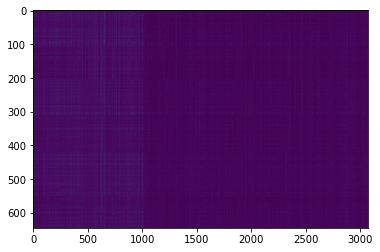

,AUC,pAUC
Source_0,0.698510,0.635499
Source_1,0.932356,0.821132
Source_2,0.731616,0.605687
Target_0,0.893422,0.774712
Target_1,0.949331,0.871850
Target_2,0.800635,0.659774
mean,0.834312,0.728109
h_mean,0.822743,0.714637


2021-04-26 16:29:27,295 - pytorch_modeler.py - INFO - epoch:135/300, train_losses:0.170775, val_AUC_hmean:0.822743, val_pAUC_hmean:0.714637, best_flag:True
2021-04-26 16:29:27,296 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.95it/s]
2021-04-26 16:29:27,805 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.62it/s]
2021-04-26 16:29:27,977 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.79it/s]
2021-04-26 16:29:28,150 - pytorch_modeler.py - INFO - epoch:136/300, train_losses:0.173767, val_AUC_hmean:0.797643, val_pAUC_hmean:0.688727, best_flag:False
2021-04-26 16:29:28,151 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.15it/s]
2021-04-26 16:29:28,636 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.64it/s]
2021-04-26 16:29:28,835 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.53it/s]
2021-04-26 16:29:29,012

100%|██████████| 2/2 [00:00<00:00,  4.93it/s]
2021-04-26 16:29:54,129 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.42it/s]
2021-04-26 16:29:54,305 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.92it/s]
2021-04-26 16:29:54,472 - pytorch_modeler.py - INFO - epoch:169/300, train_losses:0.162051, val_AUC_hmean:0.764483, val_pAUC_hmean:0.669327, best_flag:False
2021-04-26 16:29:54,473 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.93it/s]
2021-04-26 16:29:54,881 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.63it/s]
2021-04-26 16:29:55,054 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.64it/s]
2021-04-26 16:29:55,227 - pytorch_modeler.py - INFO - epoch:170/300, train_losses:0.158206, val_AUC_hmean:0.750509, val_pAUC_hmean:0.652422, best_flag:False
2021-04-26 16:29:55,228 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [

2021-04-26 16:30:06,697 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.84it/s]
2021-04-26 16:30:07,113 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.75it/s]
2021-04-26 16:30:07,282 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.74it/s]
2021-04-26 16:30:07,453 - pytorch_modeler.py - INFO - epoch:186/300, train_losses:0.146709, val_AUC_hmean:0.817198, val_pAUC_hmean:0.701443, best_flag:False
2021-04-26 16:30:07,454 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.83it/s]
2021-04-26 16:30:07,871 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.60it/s]
2021-04-26 16:30:08,042 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.76it/s]
2021-04-26 16:30:08,215 - pytorch_modeler.py - INFO - epoch:187/300, train_losses:0.143823, val_AUC_hmean:0.816841, val_pAUC_hmean:0.704178, best_flag:False
2021-04-26 16:30:08,21

2021-04-26 16:30:19,653 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.78it/s]
2021-04-26 16:30:20,074 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.68it/s]
2021-04-26 16:30:20,243 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.77it/s]
2021-04-26 16:30:20,414 - pytorch_modeler.py - INFO - epoch:203/300, train_losses:0.124877, val_AUC_hmean:0.813322, val_pAUC_hmean:0.686249, best_flag:False
2021-04-26 16:30:20,415 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.82it/s]
2021-04-26 16:30:20,832 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.52it/s]
2021-04-26 16:30:21,007 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.73it/s]
2021-04-26 16:30:21,179 - pytorch_modeler.py - INFO - epoch:204/300, train_losses:0.124669, val_AUC_hmean:0.813373, val_pAUC_hmean:0.691100, best_flag:False
2021-04-26 16:30:21,18

2021-04-26 16:30:32,590 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.79it/s]
2021-04-26 16:30:33,009 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.34it/s]
2021-04-26 16:30:33,189 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.88it/s]
2021-04-26 16:30:33,358 - pytorch_modeler.py - INFO - epoch:220/300, train_losses:0.112833, val_AUC_hmean:0.823083, val_pAUC_hmean:0.694824, best_flag:False
2021-04-26 16:30:33,359 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.80it/s]
2021-04-26 16:30:33,778 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.34it/s]
2021-04-26 16:30:33,956 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.89it/s]
2021-04-26 16:30:34,126 - pytorch_modeler.py - INFO - epoch:221/300, train_losses:0.112545, val_AUC_hmean:0.810554, val_pAUC_hmean:0.688658, best_flag:False
2021-04-26 16:30:34,12

2021-04-26 16:30:45,605 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.93it/s]
2021-04-26 16:30:46,012 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.68it/s]
2021-04-26 16:30:46,182 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.75it/s]
2021-04-26 16:30:46,353 - pytorch_modeler.py - INFO - epoch:237/300, train_losses:0.105959, val_AUC_hmean:0.793377, val_pAUC_hmean:0.690772, best_flag:False
2021-04-26 16:30:46,354 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.94it/s]
2021-04-26 16:30:46,761 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.16it/s]
2021-04-26 16:30:46,945 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.66it/s]
2021-04-26 16:30:47,120 - pytorch_modeler.py - INFO - epoch:238/300, train_losses:0.106661, val_AUC_hmean:0.802135, val_pAUC_hmean:0.689457, best_flag:False
2021-04-26 16:30:47,12

2021-04-26 16:30:58,578 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.77it/s]
2021-04-26 16:30:59,000 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.44it/s]
2021-04-26 16:30:59,176 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.26it/s]
2021-04-26 16:30:59,360 - pytorch_modeler.py - INFO - epoch:254/300, train_losses:0.096519, val_AUC_hmean:0.809633, val_pAUC_hmean:0.686178, best_flag:False
2021-04-26 16:30:59,360 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.92it/s]
2021-04-26 16:30:59,770 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.19it/s]
2021-04-26 16:30:59,951 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.28it/s]
2021-04-26 16:31:00,133 - pytorch_modeler.py - INFO - epoch:255/300, train_losses:0.095492, val_AUC_hmean:0.807820, val_pAUC_hmean:0.680647, best_flag:False
2021-04-26 16:31:00,13

2021-04-26 16:31:11,585 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.87it/s]
2021-04-26 16:31:11,998 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.63it/s]
2021-04-26 16:31:12,169 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.85it/s]
2021-04-26 16:31:12,337 - pytorch_modeler.py - INFO - epoch:271/300, train_losses:0.091266, val_AUC_hmean:0.810539, val_pAUC_hmean:0.682214, best_flag:False
2021-04-26 16:31:12,338 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.86it/s]
2021-04-26 16:31:12,752 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.21it/s]
2021-04-26 16:31:12,933 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.92it/s]
2021-04-26 16:31:13,102 - pytorch_modeler.py - INFO - epoch:272/300, train_losses:0.090327, val_AUC_hmean:0.808542, val_pAUC_hmean:0.688836, best_flag:False
2021-04-26 16:31:13,10

2021-04-26 16:31:24,809 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.71it/s]
2021-04-26 16:31:25,236 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.48it/s]
2021-04-26 16:31:25,412 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.47it/s]
2021-04-26 16:31:25,592 - pytorch_modeler.py - INFO - epoch:288/300, train_losses:0.082549, val_AUC_hmean:0.815518, val_pAUC_hmean:0.690942, best_flag:False
2021-04-26 16:31:25,592 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.40it/s]
2021-04-26 16:31:26,049 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.70it/s]
2021-04-26 16:31:26,219 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.33it/s]
2021-04-26 16:31:26,403 - pytorch_modeler.py - INFO - epoch:289/300, train_losses:0.081873, val_AUC_hmean:0.803199, val_pAUC_hmean:0.682919, best_flag:False
2021-04-26 16:31:26,40

,AUC,pAUC
Source_0,0.698510,0.635499
Source_1,0.932356,0.821132
Source_2,0.731616,0.605687
Target_0,0.893422,0.774712
Target_1,0.949331,0.871850
Target_2,0.800635,0.659774
mean,0.834312,0.728109
h_mean,0.822743,0.714637


2021-04-26 16:31:35,228 - 00_train.py - INFO - TARGET MACHINE_TYPE: valve
2021-04-26 16:31:35,229 - 00_train.py - INFO - MAKE DATA_LOADER
2021-04-26 16:31:35,262 - 00_train.py - INFO - TRAINING


elapsed time: 272.204476595 [sec]


2021-04-26 16:31:35,471 - pytorch_modeler.py - INFO - train
  0%|          | 0/2 [00:00<?, ?it/s]

use: cuda:0


100%|██████████| 2/2 [00:00<00:00,  4.45it/s]
2021-04-26 16:31:35,923 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.46it/s]
2021-04-26 16:31:36,099 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.71it/s]


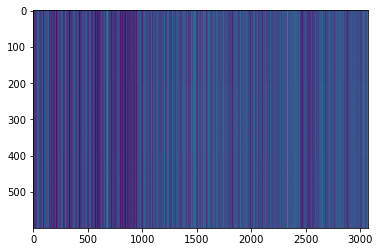

,AUC,pAUC
Source_0,0.415700,0.504737
Source_1,0.461400,0.492105
Source_2,0.509900,0.495789
Target_0,0.453000,0.506842
Target_1,0.596150,0.548947
Target_2,0.463600,0.493158
mean,0.483292,0.506930
h_mean,0.477098,0.506213


2021-04-26 16:31:37,204 - pytorch_modeler.py - INFO - epoch:1/300, train_losses:59.129175, val_AUC_hmean:0.477098, val_pAUC_hmean:0.506213, best_flag:True
2021-04-26 16:31:37,205 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.67it/s]
2021-04-26 16:31:37,637 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.58it/s]
2021-04-26 16:31:37,810 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.62it/s]
2021-04-26 16:31:37,983 - pytorch_modeler.py - INFO - epoch:2/300, train_losses:26.373984, val_AUC_hmean:0.501267, val_pAUC_hmean:0.494643, best_flag:False
2021-04-26 16:31:37,984 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.28it/s]
2021-04-26 16:31:38,454 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.28it/s]
2021-04-26 16:31:38,634 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.96it/s]
2021-04-26 16:31:38,827 -

100%|██████████| 1/1 [00:00<00:00,  6.43it/s]
2021-04-26 16:31:50,657 - pytorch_modeler.py - INFO - epoch:18/300, train_losses:0.924903, val_AUC_hmean:0.506585, val_pAUC_hmean:0.491927, best_flag:False
2021-04-26 16:31:50,658 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.68it/s]
2021-04-26 16:31:51,088 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.98it/s]
2021-04-26 16:31:51,251 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.01it/s]
2021-04-26 16:31:51,442 - pytorch_modeler.py - INFO - epoch:19/300, train_losses:0.874894, val_AUC_hmean:0.504633, val_pAUC_hmean:0.495344, best_flag:False
2021-04-26 16:31:51,444 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.57it/s]
2021-04-26 16:31:51,884 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.78it/s]
2021-04-26 16:31:52,051 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00

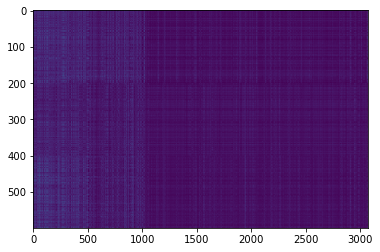

,AUC,pAUC
Source_0,0.498600,0.489474
Source_1,0.461500,0.504211
Source_2,0.532300,0.497895
Target_0,0.462100,0.498947
Target_1,0.617500,0.571053
Target_2,0.494700,0.506842
mean,0.511117,0.511404
h_mean,0.506073,0.510068


2021-04-26 16:31:55,831 - pytorch_modeler.py - INFO - epoch:23/300, train_losses:0.640390, val_AUC_hmean:0.506073, val_pAUC_hmean:0.510068, best_flag:True
2021-04-26 16:31:55,832 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.63it/s]
2021-04-26 16:31:56,266 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.54it/s]
2021-04-26 16:31:56,442 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.61it/s]


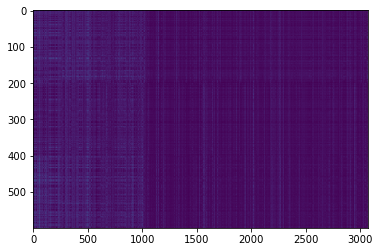

,AUC,pAUC
Source_0,0.486700,0.478421
Source_1,0.465100,0.507368
Source_2,0.530200,0.494211
Target_0,0.461000,0.498421
Target_1,0.613800,0.584737
Target_2,0.506000,0.511579
mean,0.510467,0.512456
h_mean,0.505668,0.510385


2021-04-26 16:31:57,586 - pytorch_modeler.py - INFO - epoch:24/300, train_losses:0.601656, val_AUC_hmean:0.505668, val_pAUC_hmean:0.510385, best_flag:True
2021-04-26 16:31:57,587 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.65it/s]
2021-04-26 16:31:58,019 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.40it/s]
2021-04-26 16:31:58,227 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.36it/s]


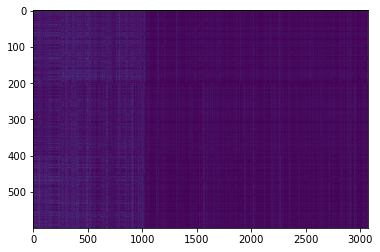

,AUC,pAUC
Source_0,0.487900,0.479474
Source_1,0.464800,0.508421
Source_2,0.545100,0.494211
Target_0,0.469400,0.500000
Target_1,0.627600,0.601053
Target_2,0.506400,0.514737
mean,0.516867,0.516316
h_mean,0.511332,0.513593


2021-04-26 16:31:59,340 - pytorch_modeler.py - INFO - epoch:25/300, train_losses:0.564697, val_AUC_hmean:0.511332, val_pAUC_hmean:0.513593, best_flag:True
2021-04-26 16:31:59,341 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.62it/s]
2021-04-26 16:31:59,776 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.14it/s]
2021-04-26 16:31:59,959 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.32it/s]


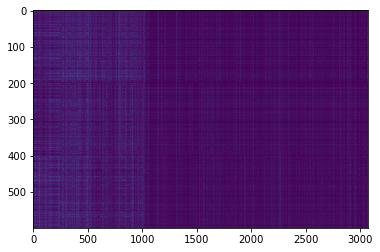

,AUC,pAUC
Source_0,0.485500,0.479474
Source_1,0.465500,0.504211
Source_2,0.547800,0.489474
Target_0,0.472400,0.506842
Target_1,0.636900,0.605789
Target_2,0.499100,0.516316
mean,0.517867,0.517018
h_mean,0.511770,0.514030


2021-04-26 16:32:01,009 - pytorch_modeler.py - INFO - epoch:26/300, train_losses:0.534758, val_AUC_hmean:0.511770, val_pAUC_hmean:0.514030, best_flag:True
2021-04-26 16:32:01,010 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.60it/s]
2021-04-26 16:32:01,447 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.14it/s]
2021-04-26 16:32:01,631 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.14it/s]
2021-04-26 16:32:01,818 - pytorch_modeler.py - INFO - epoch:27/300, train_losses:0.525091, val_AUC_hmean:0.516051, val_pAUC_hmean:0.512909, best_flag:False
2021-04-26 16:32:01,819 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.50it/s]
2021-04-26 16:32:02,266 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.39it/s]
2021-04-26 16:32:02,445 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.22it/s]
2021-04-26 16:32:02,629 -

100%|██████████| 1/1 [00:00<00:00,  6.33it/s]
2021-04-26 16:32:14,667 - pytorch_modeler.py - INFO - epoch:43/300, train_losses:0.371725, val_AUC_hmean:0.540404, val_pAUC_hmean:0.511850, best_flag:False
2021-04-26 16:32:14,668 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.49it/s]
2021-04-26 16:32:15,116 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.59it/s]
2021-04-26 16:32:15,287 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.49it/s]
2021-04-26 16:32:15,465 - pytorch_modeler.py - INFO - epoch:44/300, train_losses:0.362234, val_AUC_hmean:0.543971, val_pAUC_hmean:0.512381, best_flag:False
2021-04-26 16:32:15,466 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.42it/s]
2021-04-26 16:32:15,920 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.61it/s]
2021-04-26 16:32:16,094 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00

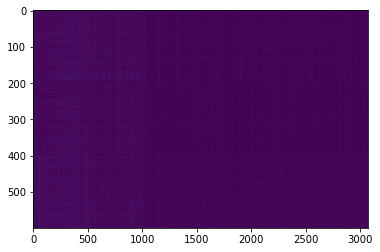

,AUC,pAUC
Source_0,0.556600,0.512632
Source_1,0.471700,0.486842
Source_2,0.613500,0.497368
Target_0,0.485600,0.488947
Target_1,0.705000,0.612632
Target_2,0.516400,0.508421
mean,0.558133,0.517807
h_mean,0.547403,0.514591


2021-04-26 16:32:21,318 - pytorch_modeler.py - INFO - epoch:50/300, train_losses:0.330636, val_AUC_hmean:0.547403, val_pAUC_hmean:0.514591, best_flag:True
2021-04-26 16:32:21,319 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.30it/s]
2021-04-26 16:32:21,787 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.23it/s]
2021-04-26 16:32:21,970 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  4.68it/s]
2021-04-26 16:32:22,216 - pytorch_modeler.py - INFO - epoch:51/300, train_losses:0.323749, val_AUC_hmean:0.555133, val_pAUC_hmean:0.512525, best_flag:False
2021-04-26 16:32:22,218 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.07it/s]
2021-04-26 16:32:22,712 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.27it/s]
2021-04-26 16:32:22,927 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.11it/s]
2021-04-26 16:32:23,148 -

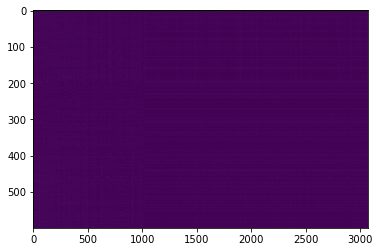

,AUC,pAUC
Source_0,0.591900,0.511053
Source_1,0.481900,0.484211
Source_2,0.555300,0.507895
Target_0,0.501900,0.486842
Target_1,0.781000,0.620526
Target_2,0.560200,0.502105
mean,0.578700,0.518772
h_mean,0.564794,0.515106


2021-04-26 16:32:29,594 - pytorch_modeler.py - INFO - epoch:59/300, train_losses:0.317645, val_AUC_hmean:0.564794, val_pAUC_hmean:0.515106, best_flag:True
2021-04-26 16:32:29,595 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.31it/s]
2021-04-26 16:32:30,062 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.77it/s]
2021-04-26 16:32:30,229 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.62it/s]
2021-04-26 16:32:30,407 - pytorch_modeler.py - INFO - epoch:60/300, train_losses:0.306026, val_AUC_hmean:0.540790, val_pAUC_hmean:0.511165, best_flag:False
2021-04-26 16:32:30,408 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.69it/s]
2021-04-26 16:32:30,837 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.51it/s]
2021-04-26 16:32:31,009 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.34it/s]
2021-04-26 16:32:31,195 -

100%|██████████| 1/1 [00:00<00:00,  6.59it/s]
2021-04-26 16:32:43,420 - pytorch_modeler.py - INFO - epoch:76/300, train_losses:0.268937, val_AUC_hmean:0.543874, val_pAUC_hmean:0.513014, best_flag:False
2021-04-26 16:32:43,421 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.70it/s]
2021-04-26 16:32:43,849 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.59it/s]
2021-04-26 16:32:44,020 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.14it/s]
2021-04-26 16:32:44,206 - pytorch_modeler.py - INFO - epoch:77/300, train_losses:0.276804, val_AUC_hmean:0.564530, val_pAUC_hmean:0.509564, best_flag:False
2021-04-26 16:32:44,207 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.89it/s]
2021-04-26 16:32:44,619 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.80it/s]
2021-04-26 16:32:44,786 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00

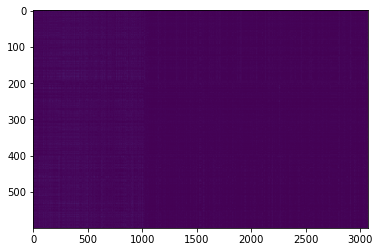

,AUC,pAUC
Source_0,0.536000,0.511579
Source_1,0.485200,0.487895
Source_2,0.633300,0.499474
Target_0,0.467200,0.491579
Target_1,0.738800,0.611579
Target_2,0.520400,0.507368
mean,0.563483,0.518246
h_mean,0.549387,0.515163


2021-04-26 16:32:53,106 - pytorch_modeler.py - INFO - epoch:87/300, train_losses:0.251896, val_AUC_hmean:0.549387, val_pAUC_hmean:0.515163, best_flag:True
2021-04-26 16:32:53,107 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.03it/s]
2021-04-26 16:32:53,606 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.46it/s]
2021-04-26 16:32:53,781 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.61it/s]
2021-04-26 16:32:53,957 - pytorch_modeler.py - INFO - epoch:88/300, train_losses:0.251293, val_AUC_hmean:0.542617, val_pAUC_hmean:0.513535, best_flag:False
2021-04-26 16:32:53,958 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.64it/s]
2021-04-26 16:32:54,391 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.47it/s]
2021-04-26 16:32:54,567 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.30it/s]
2021-04-26 16:32:54,752 -

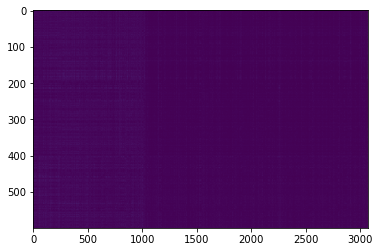

,AUC,pAUC
Source_0,0.530300,0.512632
Source_1,0.503600,0.488421
Source_2,0.604300,0.508421
Target_0,0.497700,0.491053
Target_1,0.719400,0.615263
Target_2,0.504200,0.503158
mean,0.559917,0.519825
h_mean,0.550011,0.516608


2021-04-26 16:33:01,956 - pytorch_modeler.py - INFO - epoch:97/300, train_losses:0.240561, val_AUC_hmean:0.550011, val_pAUC_hmean:0.516608, best_flag:True
2021-04-26 16:33:01,957 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.29it/s]
2021-04-26 16:33:02,568 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.13it/s]
2021-04-26 16:33:02,753 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.02it/s]
2021-04-26 16:33:02,947 - pytorch_modeler.py - INFO - epoch:98/300, train_losses:0.241184, val_AUC_hmean:0.550170, val_pAUC_hmean:0.512128, best_flag:False
2021-04-26 16:33:02,948 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.58it/s]
2021-04-26 16:33:03,509 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.60it/s]
2021-04-26 16:33:03,681 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.51it/s]
2021-04-26 16:33:03,862 -

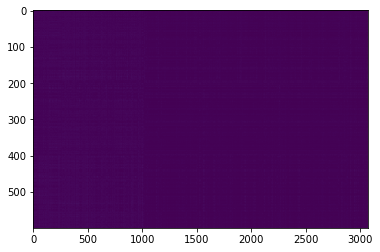

,AUC,pAUC
Source_0,0.556300,0.510526
Source_1,0.469000,0.490000
Source_2,0.647100,0.507895
Target_0,0.456700,0.493684
Target_1,0.748800,0.618421
Target_2,0.545700,0.504737
mean,0.570600,0.520877
h_mean,0.553876,0.517584


2021-04-26 16:33:09,600 - pytorch_modeler.py - INFO - epoch:104/300, train_losses:0.241534, val_AUC_hmean:0.553876, val_pAUC_hmean:0.517584, best_flag:True
2021-04-26 16:33:09,601 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.14it/s]
2021-04-26 16:33:10,242 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.11it/s]
2021-04-26 16:33:10,463 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.71it/s]
2021-04-26 16:33:10,669 - pytorch_modeler.py - INFO - epoch:105/300, train_losses:0.252839, val_AUC_hmean:0.558799, val_pAUC_hmean:0.515080, best_flag:False
2021-04-26 16:33:10,671 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.01it/s]
2021-04-26 16:33:11,338 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.17it/s]
2021-04-26 16:33:11,522 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.16it/s]
2021-04-26 16:33:11,711

100%|██████████| 2/2 [00:00<00:00,  3.02it/s]
2021-04-26 16:33:41,543 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.06it/s]
2021-04-26 16:33:41,768 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.65it/s]
2021-04-26 16:33:41,971 - pytorch_modeler.py - INFO - epoch:138/300, train_losses:0.216605, val_AUC_hmean:0.567866, val_pAUC_hmean:0.516252, best_flag:False
2021-04-26 16:33:41,973 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.39it/s]
2021-04-26 16:33:42,565 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.45it/s]
2021-04-26 16:33:42,741 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.32it/s]


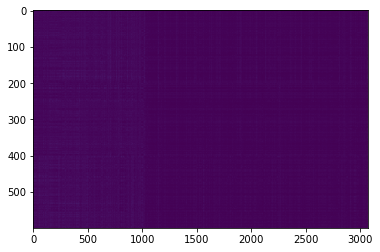

,AUC,pAUC
Source_0,0.596400,0.508947
Source_1,0.518700,0.492105
Source_2,0.610700,0.509474
Target_0,0.537100,0.490526
Target_1,0.773000,0.619474
Target_2,0.566200,0.508947
mean,0.600350,0.521579
h_mean,0.590333,0.518248


2021-04-26 16:33:43,902 - pytorch_modeler.py - INFO - epoch:139/300, train_losses:0.208452, val_AUC_hmean:0.590333, val_pAUC_hmean:0.518248, best_flag:True
2021-04-26 16:33:43,903 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.14it/s]
2021-04-26 16:33:44,541 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.46it/s]
2021-04-26 16:33:44,749 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.06it/s]
2021-04-26 16:33:44,943 - pytorch_modeler.py - INFO - epoch:140/300, train_losses:0.206536, val_AUC_hmean:0.569686, val_pAUC_hmean:0.514462, best_flag:False
2021-04-26 16:33:44,944 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.17it/s]
2021-04-26 16:33:45,576 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.39it/s]
2021-04-26 16:33:45,787 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.54it/s]
2021-04-26 16:33:45,964

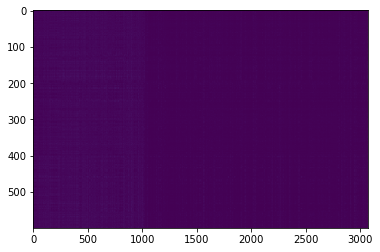

,AUC,pAUC
Source_0,0.540800,0.505789
Source_1,0.515900,0.484737
Source_2,0.651200,0.521053
Target_0,0.456600,0.493158
Target_1,0.740300,0.623158
Target_2,0.528600,0.505263
mean,0.572233,0.522193
h_mean,0.557839,0.518541


2021-04-26 16:33:47,862 - pytorch_modeler.py - INFO - epoch:142/300, train_losses:0.213735, val_AUC_hmean:0.557839, val_pAUC_hmean:0.518541, best_flag:True
2021-04-26 16:33:47,863 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.58it/s]
2021-04-26 16:33:48,424 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.04it/s]
2021-04-26 16:33:48,612 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.53it/s]
2021-04-26 16:33:48,788 - pytorch_modeler.py - INFO - epoch:143/300, train_losses:0.208637, val_AUC_hmean:0.581268, val_pAUC_hmean:0.517279, best_flag:False
2021-04-26 16:33:48,789 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.34it/s]
2021-04-26 16:33:49,390 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.57it/s]
2021-04-26 16:33:49,564 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.74it/s]
2021-04-26 16:33:49,735

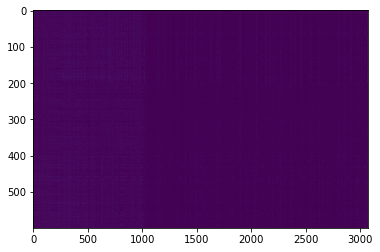

,AUC,pAUC
Source_0,0.598600,0.512105
Source_1,0.538700,0.491579
Source_2,0.581500,0.514737
Target_0,0.525100,0.488947
Target_1,0.786100,0.621053
Target_2,0.506000,0.506842
mean,0.589333,0.522544
h_mean,0.576958,0.519116


2021-04-26 16:33:51,616 - pytorch_modeler.py - INFO - epoch:145/300, train_losses:0.218070, val_AUC_hmean:0.576958, val_pAUC_hmean:0.519116, best_flag:True
2021-04-26 16:33:51,617 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.30it/s]
2021-04-26 16:33:52,226 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.42it/s]
2021-04-26 16:33:52,411 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.48it/s]
2021-04-26 16:33:52,589 - pytorch_modeler.py - INFO - epoch:146/300, train_losses:0.213027, val_AUC_hmean:0.561276, val_pAUC_hmean:0.516052, best_flag:False
2021-04-26 16:33:52,590 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.26it/s]
2021-04-26 16:33:53,206 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.54it/s]
2021-04-26 16:33:53,406 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.08it/s]
2021-04-26 16:33:53,594

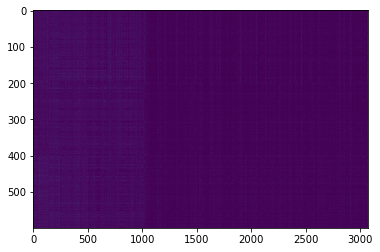

,AUC,pAUC
Source_0,0.600800,0.510526
Source_1,0.506700,0.506842
Source_2,0.616100,0.515263
Target_0,0.557900,0.487895
Target_1,0.774500,0.618947
Target_2,0.520900,0.501579
mean,0.596150,0.523509
h_mean,0.584541,0.520314


2021-04-26 16:34:05,470 - pytorch_modeler.py - INFO - epoch:158/300, train_losses:0.199374, val_AUC_hmean:0.584541, val_pAUC_hmean:0.520314, best_flag:True
2021-04-26 16:34:05,471 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.13it/s]
2021-04-26 16:34:06,113 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.11it/s]
2021-04-26 16:34:06,301 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.11it/s]
2021-04-26 16:34:06,489 - pytorch_modeler.py - INFO - epoch:159/300, train_losses:0.195872, val_AUC_hmean:0.563436, val_pAUC_hmean:0.516625, best_flag:False
2021-04-26 16:34:06,490 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.60it/s]
2021-04-26 16:34:07,049 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.45it/s]
2021-04-26 16:34:07,226 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.95it/s]
2021-04-26 16:34:07,423

100%|██████████| 2/2 [00:00<00:00,  3.43it/s]
2021-04-26 16:34:38,204 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.94it/s]
2021-04-26 16:34:38,395 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.97it/s]
2021-04-26 16:34:38,590 - pytorch_modeler.py - INFO - epoch:192/300, train_losses:0.173135, val_AUC_hmean:0.560768, val_pAUC_hmean:0.516608, best_flag:False
2021-04-26 16:34:38,591 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.39it/s]
2021-04-26 16:34:39,184 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.49it/s]
2021-04-26 16:34:39,389 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.43it/s]
2021-04-26 16:34:39,599 - pytorch_modeler.py - INFO - epoch:193/300, train_losses:0.173599, val_AUC_hmean:0.564460, val_pAUC_hmean:0.514610, best_flag:False
2021-04-26 16:34:39,600 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [

2021-04-26 16:34:53,926 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.39it/s]
2021-04-26 16:34:54,519 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.55it/s]
2021-04-26 16:34:54,692 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.53it/s]
2021-04-26 16:34:54,869 - pytorch_modeler.py - INFO - epoch:209/300, train_losses:0.189037, val_AUC_hmean:0.578524, val_pAUC_hmean:0.519384, best_flag:False
2021-04-26 16:34:54,870 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.29it/s]
2021-04-26 16:34:55,480 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.21it/s]
2021-04-26 16:34:55,666 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.93it/s]
2021-04-26 16:34:55,865 - pytorch_modeler.py - INFO - epoch:210/300, train_losses:0.184861, val_AUC_hmean:0.566588, val_pAUC_hmean:0.516835, best_flag:False
2021-04-26 16:34:55,86

2021-04-26 16:35:12,428 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.28it/s]
2021-04-26 16:35:13,041 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  3.01it/s]
2021-04-26 16:35:13,395 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  3.08it/s]
2021-04-26 16:35:13,752 - pytorch_modeler.py - INFO - epoch:226/300, train_losses:0.162868, val_AUC_hmean:0.566960, val_pAUC_hmean:0.515231, best_flag:False
2021-04-26 16:35:13,753 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.11it/s]
2021-04-26 16:35:14,399 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  2.88it/s]
2021-04-26 16:35:14,770 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  2.87it/s]
2021-04-26 16:35:15,154 - pytorch_modeler.py - INFO - epoch:227/300, train_losses:0.165061, val_AUC_hmean:0.575415, val_pAUC_hmean:0.515017, best_flag:False
2021-04-26 16:35:15,15

2021-04-26 16:35:30,434 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.50it/s]
2021-04-26 16:35:31,008 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.34it/s]
2021-04-26 16:35:31,187 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.36it/s]
2021-04-26 16:35:31,368 - pytorch_modeler.py - INFO - epoch:243/300, train_losses:0.151220, val_AUC_hmean:0.563170, val_pAUC_hmean:0.517752, best_flag:False
2021-04-26 16:35:31,369 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.44it/s]
2021-04-26 16:35:31,953 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.14it/s]
2021-04-26 16:35:32,138 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.34it/s]
2021-04-26 16:35:32,319 - pytorch_modeler.py - INFO - epoch:244/300, train_losses:0.151182, val_AUC_hmean:0.568843, val_pAUC_hmean:0.518030, best_flag:False
2021-04-26 16:35:32,32

2021-04-26 16:35:46,688 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.28it/s]
2021-04-26 16:35:47,300 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.34it/s]
2021-04-26 16:35:47,479 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.14it/s]
2021-04-26 16:35:47,700 - pytorch_modeler.py - INFO - epoch:260/300, train_losses:0.144166, val_AUC_hmean:0.550807, val_pAUC_hmean:0.515752, best_flag:False
2021-04-26 16:35:47,701 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.46it/s]
2021-04-26 16:35:48,281 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.40it/s]
2021-04-26 16:35:48,489 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.20it/s]
2021-04-26 16:35:48,676 - pytorch_modeler.py - INFO - epoch:261/300, train_losses:0.142368, val_AUC_hmean:0.573106, val_pAUC_hmean:0.514573, best_flag:False
2021-04-26 16:35:48,67

2021-04-26 16:36:03,658 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.32it/s]
2021-04-26 16:36:04,262 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.93it/s]
2021-04-26 16:36:04,454 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.68it/s]
2021-04-26 16:36:04,659 - pytorch_modeler.py - INFO - epoch:277/300, train_losses:0.140912, val_AUC_hmean:0.563025, val_pAUC_hmean:0.515965, best_flag:False
2021-04-26 16:36:04,660 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.10it/s]
2021-04-26 16:36:05,307 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.13it/s]
2021-04-26 16:36:05,533 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.94it/s]
2021-04-26 16:36:05,731 - pytorch_modeler.py - INFO - epoch:278/300, train_losses:0.144346, val_AUC_hmean:0.563558, val_pAUC_hmean:0.519100, best_flag:False
2021-04-26 16:36:05,73

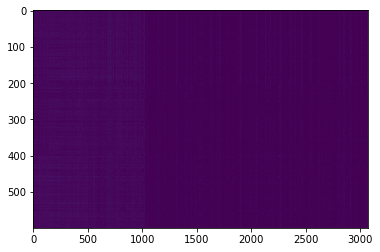

,AUC,pAUC
Source_0,0.565500,0.515789
Source_1,0.539300,0.519474
Source_2,0.596200,0.505263
Target_0,0.530900,0.495789
Target_1,0.769600,0.616316
Target_2,0.482900,0.500000
mean,0.580733,0.525439
h_mean,0.568522,0.522534


2021-04-26 16:36:08,656 - pytorch_modeler.py - INFO - epoch:280/300, train_losses:0.142971, val_AUC_hmean:0.568522, val_pAUC_hmean:0.522534, best_flag:True
2021-04-26 16:36:08,657 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  2.84it/s]
2021-04-26 16:36:09,364 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  3.40it/s]
2021-04-26 16:36:09,679 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  3.14it/s]
2021-04-26 16:36:10,023 - pytorch_modeler.py - INFO - epoch:281/300, train_losses:0.139399, val_AUC_hmean:0.567022, val_pAUC_hmean:0.519870, best_flag:False
2021-04-26 16:36:10,024 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.33it/s]
2021-04-26 16:36:10,626 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  3.19it/s]
2021-04-26 16:36:10,961 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  3.26it/s]
2021-04-26 16:36:11,290

,AUC,pAUC
Source_0,0.565500,0.515789
Source_1,0.539300,0.519474
Source_2,0.596200,0.505263
Target_0,0.530900,0.495789
Target_1,0.769600,0.616316
Target_2,0.482900,0.500000
mean,0.580733,0.525439
h_mean,0.568522,0.522534


2021-04-26 16:36:26,229 - 00_train.py - INFO - TARGET MACHINE_TYPE: ToyTrain
2021-04-26 16:36:26,231 - 00_train.py - INFO - MAKE DATA_LOADER
2021-04-26 16:36:26,260 - 00_train.py - INFO - TRAINING


elapsed time: 290.997414112 [sec]


2021-04-26 16:36:26,460 - pytorch_modeler.py - INFO - train
  0%|          | 0/2 [00:00<?, ?it/s]

use: cuda:0


100%|██████████| 2/2 [00:00<00:00,  4.89it/s]
2021-04-26 16:36:26,871 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.65it/s]
2021-04-26 16:36:27,042 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  7.07it/s]


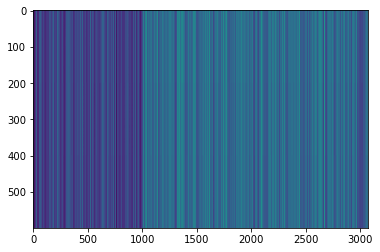

,AUC,pAUC
Source_0,0.171300,0.479474
Source_1,0.485200,0.526842
Source_2,0.484400,0.500000
Target_0,0.175900,0.473684
Target_1,0.436400,0.490526
Target_2,0.415900,0.502105
mean,0.361517,0.495439
h_mean,0.294926,0.494842


2021-04-26 16:36:28,051 - pytorch_modeler.py - INFO - epoch:1/300, train_losses:50.274200, val_AUC_hmean:0.294926, val_pAUC_hmean:0.494842, best_flag:True
2021-04-26 16:36:28,051 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.50it/s]
2021-04-26 16:36:28,498 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  7.13it/s]
2021-04-26 16:36:28,661 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.91it/s]
2021-04-26 16:36:28,830 - pytorch_modeler.py - INFO - epoch:2/300, train_losses:14.076757, val_AUC_hmean:0.319868, val_pAUC_hmean:0.492321, best_flag:False
2021-04-26 16:36:28,831 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.64it/s]
2021-04-26 16:36:29,264 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.35it/s]
2021-04-26 16:36:29,443 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.82it/s]


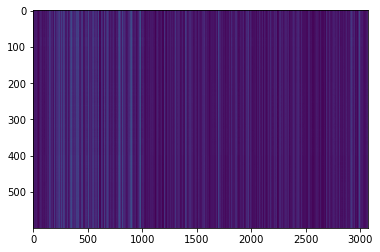

,AUC,pAUC
Source_0,0.393900,0.476842
Source_1,0.509300,0.532632
Source_2,0.484900,0.499474
Target_0,0.141700,0.473684
Target_1,0.441600,0.484737
Target_2,0.414700,0.506842
mean,0.397683,0.495702
h_mean,0.327913,0.494895


2021-04-26 16:36:30,516 - pytorch_modeler.py - INFO - epoch:3/300, train_losses:7.479720, val_AUC_hmean:0.327913, val_pAUC_hmean:0.494895, best_flag:True
2021-04-26 16:36:30,517 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.23it/s]
2021-04-26 16:36:30,992 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.78it/s]
2021-04-26 16:36:31,159 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.81it/s]


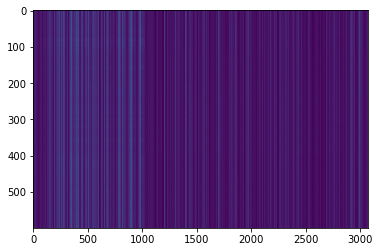

,AUC,pAUC
Source_0,0.408400,0.474211
Source_1,0.506200,0.543158
Source_2,0.487100,0.503158
Target_0,0.143600,0.473684
Target_1,0.444500,0.485263
Target_2,0.412700,0.517895
mean,0.400417,0.499561
h_mean,0.331242,0.498337


2021-04-26 16:36:32,228 - pytorch_modeler.py - INFO - epoch:4/300, train_losses:4.254073, val_AUC_hmean:0.331242, val_pAUC_hmean:0.498337, best_flag:True
2021-04-26 16:36:32,230 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.64it/s]
2021-04-26 16:36:32,664 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.61it/s]
2021-04-26 16:36:32,837 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.94it/s]
2021-04-26 16:36:33,004 - pytorch_modeler.py - INFO - epoch:5/300, train_losses:3.025015, val_AUC_hmean:0.329741, val_pAUC_hmean:0.496901, best_flag:False
2021-04-26 16:36:33,006 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.83it/s]
2021-04-26 16:36:33,421 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.45it/s]
2021-04-26 16:36:33,597 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.57it/s]
2021-04-26 16:36:33,773 - p

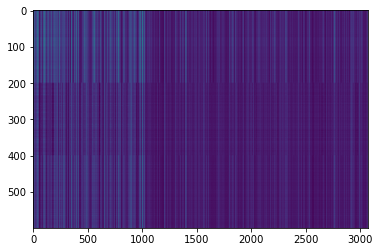

,AUC,pAUC
Source_0,0.332000,0.510526
Source_1,0.392200,0.478947
Source_2,0.570100,0.507368
Target_0,0.496200,0.561579
Target_1,0.456900,0.496316
Target_2,0.473900,0.505789
mean,0.453550,0.510088
h_mean,0.440206,0.508894


2021-04-26 16:36:39,640 - pytorch_modeler.py - INFO - epoch:12/300, train_losses:0.713051, val_AUC_hmean:0.440206, val_pAUC_hmean:0.508894, best_flag:True
2021-04-26 16:36:39,641 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.69it/s]
2021-04-26 16:36:40,070 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.69it/s]
2021-04-26 16:36:40,241 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.93it/s]


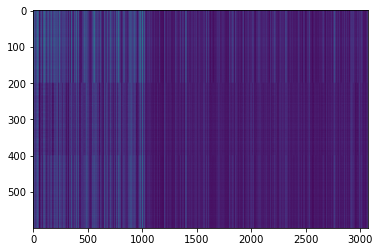

,AUC,pAUC
Source_0,0.353500,0.527895
Source_1,0.392200,0.474737
Source_2,0.505100,0.503684
Target_0,0.547600,0.570526
Target_1,0.436300,0.500000
Target_2,0.469900,0.517368
mean,0.450767,0.515702
h_mean,0.441026,0.514062


2021-04-26 16:36:41,318 - pytorch_modeler.py - INFO - epoch:13/300, train_losses:0.645902, val_AUC_hmean:0.441026, val_pAUC_hmean:0.514062, best_flag:True
2021-04-26 16:36:41,319 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.40it/s]
2021-04-26 16:36:41,776 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.40it/s]
2021-04-26 16:36:41,955 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.36it/s]


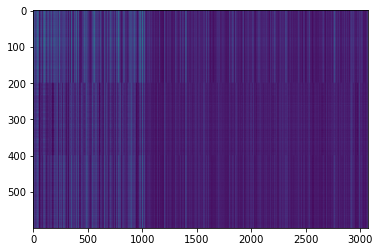

,AUC,pAUC
Source_0,0.382300,0.541579
Source_1,0.407200,0.476842
Source_2,0.468100,0.513158
Target_0,0.650800,0.617895
Target_1,0.451600,0.497895
Target_2,0.510200,0.525263
mean,0.478367,0.528772
h_mean,0.464440,0.525258


2021-04-26 16:36:43,131 - pytorch_modeler.py - INFO - epoch:14/300, train_losses:0.597037, val_AUC_hmean:0.464440, val_pAUC_hmean:0.525258, best_flag:True
2021-04-26 16:36:43,132 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.94it/s]
2021-04-26 16:36:43,538 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.59it/s]
2021-04-26 16:36:43,713 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.28it/s]


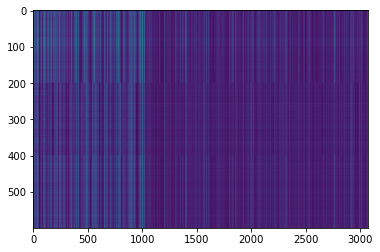

,AUC,pAUC
Source_0,0.407800,0.544737
Source_1,0.447100,0.473684
Source_2,0.451800,0.508947
Target_0,0.665700,0.617368
Target_1,0.469400,0.506842
Target_2,0.493500,0.527368
mean,0.489217,0.529825
h_mean,0.477666,0.526284


2021-04-26 16:36:44,853 - pytorch_modeler.py - INFO - epoch:15/300, train_losses:0.535528, val_AUC_hmean:0.477666, val_pAUC_hmean:0.526284, best_flag:True
2021-04-26 16:36:44,854 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.45it/s]
2021-04-26 16:36:45,305 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.66it/s]
2021-04-26 16:36:45,477 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.55it/s]
2021-04-26 16:36:45,653 - pytorch_modeler.py - INFO - epoch:16/300, train_losses:0.490244, val_AUC_hmean:0.496196, val_pAUC_hmean:0.525490, best_flag:False
2021-04-26 16:36:45,654 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.83it/s]
2021-04-26 16:36:46,071 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.36it/s]
2021-04-26 16:36:46,249 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.67it/s]


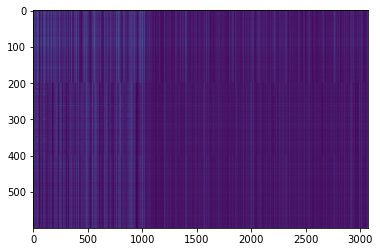

,AUC,pAUC
Source_0,0.396800,0.543684
Source_1,0.495900,0.490526
Source_2,0.446400,0.515263
Target_0,0.725200,0.643158
Target_1,0.488600,0.483158
Target_2,0.558400,0.520000
mean,0.518550,0.532632
h_mean,0.500281,0.527876


2021-04-26 16:36:47,308 - pytorch_modeler.py - INFO - epoch:17/300, train_losses:0.454598, val_AUC_hmean:0.500281, val_pAUC_hmean:0.527876, best_flag:True
2021-04-26 16:36:47,309 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.47it/s]
2021-04-26 16:36:47,758 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.43it/s]
2021-04-26 16:36:47,938 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.22it/s]
2021-04-26 16:36:48,125 - pytorch_modeler.py - INFO - epoch:18/300, train_losses:0.422785, val_AUC_hmean:0.514755, val_pAUC_hmean:0.519920, best_flag:False
2021-04-26 16:36:48,126 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.02it/s]
2021-04-26 16:36:48,627 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.12it/s]
2021-04-26 16:36:48,815 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.03it/s]
2021-04-26 16:36:49,007 -

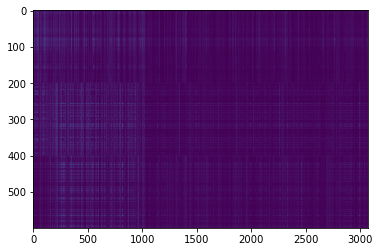

,AUC,pAUC
Source_0,0.381100,0.478947
Source_1,0.499200,0.512632
Source_2,0.510600,0.498947
Target_0,0.819600,0.738947
Target_1,0.512600,0.494211
Target_2,0.613600,0.519474
mean,0.556117,0.540526
h_mean,0.526947,0.528887


2021-04-26 16:36:58,162 - pytorch_modeler.py - INFO - epoch:29/300, train_losses:0.289907, val_AUC_hmean:0.526947, val_pAUC_hmean:0.528887, best_flag:True
2021-04-26 16:36:58,164 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.38it/s]
2021-04-26 16:36:58,623 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.23it/s]
2021-04-26 16:36:58,804 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


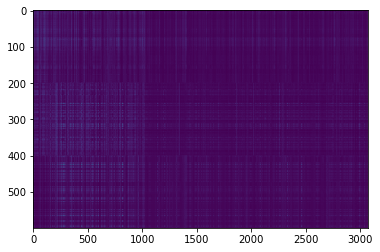

,AUC,pAUC
Source_0,0.362100,0.478947
Source_1,0.498800,0.508947
Source_2,0.509400,0.500000
Target_0,0.812400,0.731579
Target_1,0.505700,0.494211
Target_2,0.614800,0.540000
mean,0.550533,0.542281
h_mean,0.518829,0.531211


2021-04-26 16:37:00,038 - pytorch_modeler.py - INFO - epoch:30/300, train_losses:0.288577, val_AUC_hmean:0.518829, val_pAUC_hmean:0.531211, best_flag:True
2021-04-26 16:37:00,039 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.46it/s]
2021-04-26 16:37:00,490 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.94it/s]
2021-04-26 16:37:00,662 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.54it/s]
2021-04-26 16:37:00,870 - pytorch_modeler.py - INFO - epoch:31/300, train_losses:0.283304, val_AUC_hmean:0.518234, val_pAUC_hmean:0.529880, best_flag:False
2021-04-26 16:37:00,872 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.73it/s]
2021-04-26 16:37:01,298 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.60it/s]
2021-04-26 16:37:01,470 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.62it/s]
2021-04-26 16:37:01,645 -

100%|██████████| 1/1 [00:00<00:00,  6.62it/s]
2021-04-26 16:37:13,244 - pytorch_modeler.py - INFO - epoch:47/300, train_losses:0.244783, val_AUC_hmean:0.520533, val_pAUC_hmean:0.522750, best_flag:False
2021-04-26 16:37:13,245 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.53it/s]
2021-04-26 16:37:13,690 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.62it/s]
2021-04-26 16:37:13,862 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.82it/s]
2021-04-26 16:37:14,032 - pytorch_modeler.py - INFO - epoch:48/300, train_losses:0.245388, val_AUC_hmean:0.552134, val_pAUC_hmean:0.527152, best_flag:False
2021-04-26 16:37:14,033 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.92it/s]
2021-04-26 16:37:14,442 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.78it/s]
2021-04-26 16:37:14,612 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00

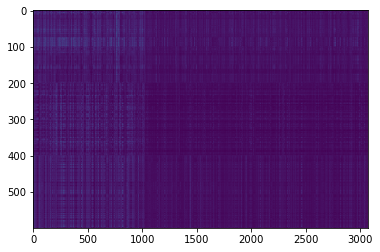

,AUC,pAUC
Source_0,0.586800,0.521053
Source_1,0.522800,0.505789
Source_2,0.556500,0.487368
Target_0,0.850300,0.713684
Target_1,0.489300,0.495263
Target_2,0.611500,0.523684
mean,0.602867,0.541140
h_mean,0.584283,0.532010


2021-04-26 16:37:19,724 - pytorch_modeler.py - INFO - epoch:54/300, train_losses:0.237509, val_AUC_hmean:0.584283, val_pAUC_hmean:0.532010, best_flag:True
2021-04-26 16:37:19,725 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.72it/s]
2021-04-26 16:37:20,151 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.69it/s]
2021-04-26 16:37:20,323 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.20it/s]
2021-04-26 16:37:20,525 - pytorch_modeler.py - INFO - epoch:55/300, train_losses:0.235677, val_AUC_hmean:0.557193, val_pAUC_hmean:0.526985, best_flag:False
2021-04-26 16:37:20,529 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.41it/s]
2021-04-26 16:37:20,985 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.35it/s]
2021-04-26 16:37:21,163 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.57it/s]
2021-04-26 16:37:21,339 -

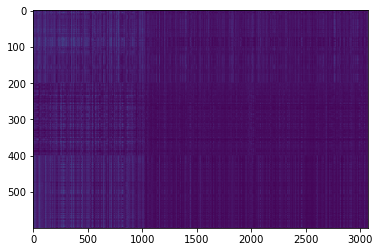

,AUC,pAUC
Source_0,0.598700,0.540000
Source_1,0.529200,0.506842
Source_2,0.595800,0.484737
Target_0,0.796900,0.693158
Target_1,0.487700,0.492632
Target_2,0.616500,0.529474
mean,0.604133,0.541140
h_mean,0.590220,0.533377


2021-04-26 16:37:30,893 - pytorch_modeler.py - INFO - epoch:67/300, train_losses:0.226868, val_AUC_hmean:0.590220, val_pAUC_hmean:0.533377, best_flag:True
2021-04-26 16:37:30,894 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.52it/s]
2021-04-26 16:37:31,338 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.04it/s]
2021-04-26 16:37:31,525 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.54it/s]
2021-04-26 16:37:31,733 - pytorch_modeler.py - INFO - epoch:68/300, train_losses:0.224872, val_AUC_hmean:0.579815, val_pAUC_hmean:0.528273, best_flag:False
2021-04-26 16:37:31,735 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.64it/s]
2021-04-26 16:37:32,168 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.76it/s]
2021-04-26 16:37:32,339 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.32it/s]
2021-04-26 16:37:32,522 -

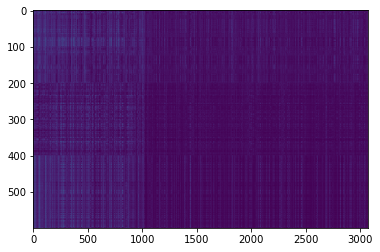

,AUC,pAUC
Source_0,0.666200,0.564737
Source_1,0.541000,0.510526
Source_2,0.588100,0.479474
Target_0,0.818800,0.692632
Target_1,0.478800,0.488947
Target_2,0.608400,0.530000
mean,0.616883,0.544386
h_mean,0.599797,0.536150


2021-04-26 16:37:43,893 - pytorch_modeler.py - INFO - epoch:82/300, train_losses:0.206466, val_AUC_hmean:0.599797, val_pAUC_hmean:0.536150, best_flag:True
2021-04-26 16:37:43,895 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.48it/s]
2021-04-26 16:37:44,343 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.43it/s]
2021-04-26 16:37:44,520 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.49it/s]
2021-04-26 16:37:44,705 - pytorch_modeler.py - INFO - epoch:83/300, train_losses:0.203097, val_AUC_hmean:0.592664, val_pAUC_hmean:0.535829, best_flag:False
2021-04-26 16:37:44,706 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.35it/s]
2021-04-26 16:37:45,169 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.71it/s]
2021-04-26 16:37:45,339 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.80it/s]


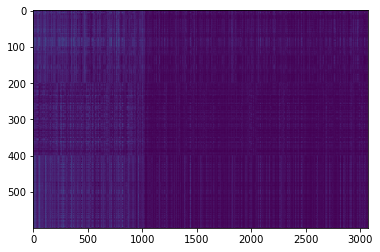

,AUC,pAUC
Source_0,0.698500,0.578421
Source_1,0.537500,0.511579
Source_2,0.575800,0.481053
Target_0,0.846800,0.708421
Target_1,0.471600,0.488421
Target_2,0.607900,0.528947
mean,0.623017,0.549474
h_mean,0.601493,0.539962


2021-04-26 16:37:46,496 - pytorch_modeler.py - INFO - epoch:84/300, train_losses:0.202036, val_AUC_hmean:0.601493, val_pAUC_hmean:0.539962, best_flag:True
2021-04-26 16:37:46,497 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.83it/s]
2021-04-26 16:37:46,914 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.28it/s]
2021-04-26 16:37:47,098 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


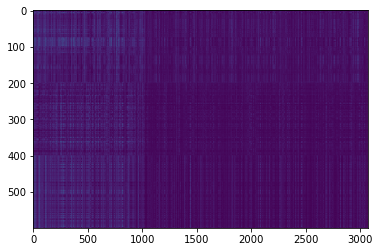

,AUC,pAUC
Source_0,0.677600,0.590000
Source_1,0.544900,0.509474
Source_2,0.612600,0.481579
Target_0,0.835100,0.711053
Target_1,0.480300,0.489474
Target_2,0.612400,0.532632
mean,0.627150,0.552368
h_mean,0.608779,0.542443


2021-04-26 16:37:48,253 - pytorch_modeler.py - INFO - epoch:85/300, train_losses:0.201273, val_AUC_hmean:0.608779, val_pAUC_hmean:0.542443, best_flag:True
2021-04-26 16:37:48,254 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.48it/s]
2021-04-26 16:37:48,703 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.75it/s]
2021-04-26 16:37:48,872 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.62it/s]
2021-04-26 16:37:49,047 - pytorch_modeler.py - INFO - epoch:86/300, train_losses:0.200774, val_AUC_hmean:0.599539, val_pAUC_hmean:0.537454, best_flag:False
2021-04-26 16:37:49,048 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.45it/s]
2021-04-26 16:37:49,499 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.57it/s]
2021-04-26 16:37:49,672 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.49it/s]
2021-04-26 16:37:49,851 -

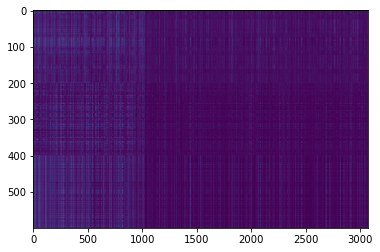

,AUC,pAUC
Source_0,0.764300,0.660000
Source_1,0.546400,0.510526
Source_2,0.573000,0.481053
Target_0,0.847800,0.702105
Target_1,0.490700,0.488421
Target_2,0.617200,0.531053
mean,0.639900,0.562193
h_mean,0.617195,0.550083


2021-04-26 16:37:58,217 - pytorch_modeler.py - INFO - epoch:96/300, train_losses:0.191089, val_AUC_hmean:0.617195, val_pAUC_hmean:0.550083, best_flag:True
2021-04-26 16:37:58,218 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.67it/s]
2021-04-26 16:37:58,766 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.30it/s]
2021-04-26 16:37:58,949 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.29it/s]
2021-04-26 16:37:59,134 - pytorch_modeler.py - INFO - epoch:97/300, train_losses:0.190156, val_AUC_hmean:0.606278, val_pAUC_hmean:0.540197, best_flag:False
2021-04-26 16:37:59,135 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.31it/s]
2021-04-26 16:37:59,741 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.92it/s]
2021-04-26 16:37:59,933 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.18it/s]
2021-04-26 16:38:00,121 -

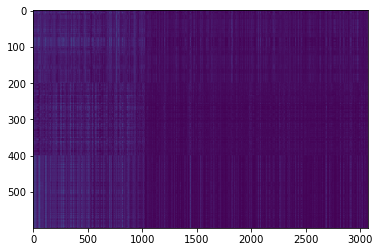

,AUC,pAUC
Source_0,0.802500,0.703158
Source_1,0.570800,0.511579
Source_2,0.610100,0.480000
Target_0,0.863200,0.711053
Target_1,0.491400,0.485789
Target_2,0.628000,0.540526
mean,0.661000,0.572018
h_mean,0.636743,0.556837


2021-04-26 16:38:21,772 - pytorch_modeler.py - INFO - epoch:120/300, train_losses:0.173397, val_AUC_hmean:0.636743, val_pAUC_hmean:0.556837, best_flag:True
2021-04-26 16:38:21,774 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.45it/s]
2021-04-26 16:38:22,355 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.80it/s]
2021-04-26 16:38:22,550 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.65it/s]
2021-04-26 16:38:22,725 - pytorch_modeler.py - INFO - epoch:121/300, train_losses:0.171825, val_AUC_hmean:0.612221, val_pAUC_hmean:0.540378, best_flag:False
2021-04-26 16:38:22,727 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.32it/s]
2021-04-26 16:38:23,332 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.16it/s]
2021-04-26 16:38:23,553 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.23it/s]
2021-04-26 16:38:23,742

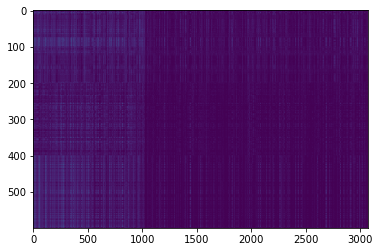

,AUC,pAUC
Source_0,0.850300,0.714737
Source_1,0.553400,0.514211
Source_2,0.595200,0.481053
Target_0,0.815400,0.688421
Target_1,0.493700,0.489474
Target_2,0.626000,0.541579
mean,0.655667,0.571579
h_mean,0.630747,0.557378


2021-04-26 16:38:37,915 - pytorch_modeler.py - INFO - epoch:135/300, train_losses:0.161756, val_AUC_hmean:0.630747, val_pAUC_hmean:0.557378, best_flag:True
2021-04-26 16:38:37,916 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.23it/s]
2021-04-26 16:38:38,537 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.61it/s]
2021-04-26 16:38:38,738 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.23it/s]
2021-04-26 16:38:38,925 - pytorch_modeler.py - INFO - epoch:136/300, train_losses:0.160615, val_AUC_hmean:0.637033, val_pAUC_hmean:0.551561, best_flag:False
2021-04-26 16:38:38,926 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.19it/s]
2021-04-26 16:38:39,555 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.50it/s]
2021-04-26 16:38:39,730 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.04it/s]
2021-04-26 16:38:39,923

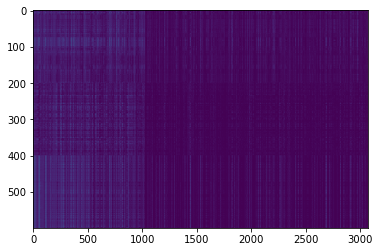

,AUC,pAUC
Source_0,0.865300,0.706842
Source_1,0.548100,0.512632
Source_2,0.564100,0.478947
Target_0,0.863400,0.720526
Target_1,0.482400,0.487895
Target_2,0.604400,0.538421
mean,0.654617,0.574211
h_mean,0.622497,0.558235


2021-04-26 16:38:53,607 - pytorch_modeler.py - INFO - epoch:150/300, train_losses:0.150908, val_AUC_hmean:0.622497, val_pAUC_hmean:0.558235, best_flag:True
2021-04-26 16:38:53,608 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.41it/s]
2021-04-26 16:38:54,198 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.71it/s]
2021-04-26 16:38:54,400 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.34it/s]


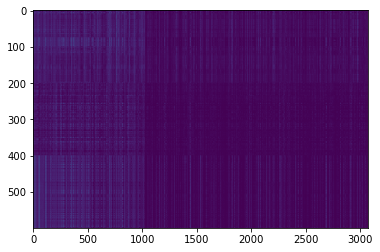

,AUC,pAUC
Source_0,0.881200,0.753158
Source_1,0.552700,0.504211
Source_2,0.625800,0.483684
Target_0,0.867500,0.716842
Target_1,0.492000,0.485263
Target_2,0.613400,0.542632
mean,0.672100,0.580965
h_mean,0.641191,0.561949


2021-04-26 16:38:55,512 - pytorch_modeler.py - INFO - epoch:151/300, train_losses:0.151071, val_AUC_hmean:0.641191, val_pAUC_hmean:0.561949, best_flag:True
2021-04-26 16:38:55,513 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.17it/s]
2021-04-26 16:38:56,145 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.38it/s]
2021-04-26 16:38:56,354 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.48it/s]
2021-04-26 16:38:56,533 - pytorch_modeler.py - INFO - epoch:152/300, train_losses:0.150787, val_AUC_hmean:0.634874, val_pAUC_hmean:0.557014, best_flag:False
2021-04-26 16:38:56,534 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.56it/s]
2021-04-26 16:38:57,098 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.07it/s]
2021-04-26 16:38:57,285 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.84it/s]
2021-04-26 16:38:57,483

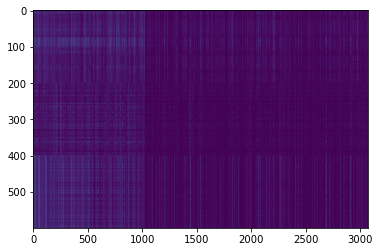

,AUC,pAUC
Source_0,0.870900,0.752105
Source_1,0.541900,0.511579
Source_2,0.576500,0.479474
Target_0,0.855900,0.716842
Target_1,0.482400,0.489474
Target_2,0.605000,0.539474
mean,0.655433,0.581491
h_mean,0.623544,0.562766


2021-04-26 16:39:13,525 - pytorch_modeler.py - INFO - epoch:169/300, train_losses:0.141806, val_AUC_hmean:0.623544, val_pAUC_hmean:0.562766, best_flag:True
2021-04-26 16:39:13,526 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.18it/s]
2021-04-26 16:39:14,158 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  3.12it/s]
2021-04-26 16:39:14,505 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  3.37it/s]
2021-04-26 16:39:14,825 - pytorch_modeler.py - INFO - epoch:170/300, train_losses:0.141330, val_AUC_hmean:0.628393, val_pAUC_hmean:0.551443, best_flag:False
2021-04-26 16:39:14,826 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.52it/s]
2021-04-26 16:39:15,398 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  3.21it/s]
2021-04-26 16:39:15,731 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  3.29it/s]
2021-04-26 16:39:16,058

100%|██████████| 2/2 [00:00<00:00,  4.63it/s]
2021-04-26 16:39:42,040 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.56it/s]
2021-04-26 16:39:42,213 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.49it/s]
2021-04-26 16:39:42,390 - pytorch_modeler.py - INFO - epoch:203/300, train_losses:0.124777, val_AUC_hmean:0.647399, val_pAUC_hmean:0.557233, best_flag:False
2021-04-26 16:39:42,391 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.49it/s]
2021-04-26 16:39:42,839 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.55it/s]
2021-04-26 16:39:43,015 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.56it/s]
2021-04-26 16:39:43,190 - pytorch_modeler.py - INFO - epoch:204/300, train_losses:0.124633, val_AUC_hmean:0.634983, val_pAUC_hmean:0.554607, best_flag:False
2021-04-26 16:39:43,192 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [

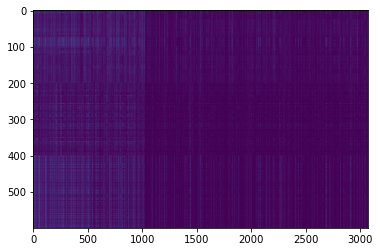

,AUC,pAUC
Source_0,0.883200,0.733684
Source_1,0.563900,0.518421
Source_2,0.612800,0.482105
Target_0,0.852400,0.715789
Target_1,0.501300,0.490000
Target_2,0.619400,0.543684
mean,0.672167,0.580614
h_mean,0.643784,0.563733


2021-04-26 16:39:54,401 - pytorch_modeler.py - INFO - epoch:217/300, train_losses:0.119618, val_AUC_hmean:0.643784, val_pAUC_hmean:0.563733, best_flag:True
2021-04-26 16:39:54,402 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.62it/s]
2021-04-26 16:39:54,837 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.48it/s]
2021-04-26 16:39:55,012 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.57it/s]
2021-04-26 16:39:55,188 - pytorch_modeler.py - INFO - epoch:218/300, train_losses:0.118943, val_AUC_hmean:0.638266, val_pAUC_hmean:0.557892, best_flag:False
2021-04-26 16:39:55,189 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.74it/s]
2021-04-26 16:39:55,614 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.18it/s]
2021-04-26 16:39:55,796 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.00it/s]
2021-04-26 16:39:55,988

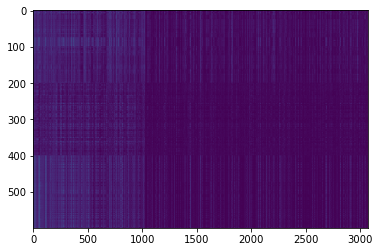

,AUC,pAUC
Source_0,0.942100,0.781579
Source_1,0.601600,0.516842
Source_2,0.648300,0.481579
Target_0,0.858400,0.707895
Target_1,0.500100,0.487368
Target_2,0.618600,0.546316
mean,0.694850,0.586930
h_mean,0.663181,0.566802


2021-04-26 16:40:20,619 - pytorch_modeler.py - INFO - epoch:249/300, train_losses:0.107125, val_AUC_hmean:0.663181, val_pAUC_hmean:0.566802, best_flag:True
2021-04-26 16:40:20,620 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.38it/s]
2021-04-26 16:40:21,079 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.51it/s]
2021-04-26 16:40:21,252 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.27it/s]
2021-04-26 16:40:21,435 - pytorch_modeler.py - INFO - epoch:250/300, train_losses:0.105452, val_AUC_hmean:0.649452, val_pAUC_hmean:0.554530, best_flag:False
2021-04-26 16:40:21,436 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.68it/s]
2021-04-26 16:40:21,865 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.56it/s]
2021-04-26 16:40:22,041 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.79it/s]
2021-04-26 16:40:22,237

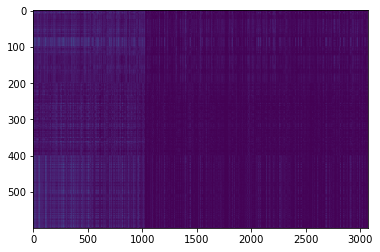

,AUC,pAUC
Source_0,0.897400,0.798421
Source_1,0.566500,0.514211
Source_2,0.599800,0.479474
Target_0,0.842800,0.720000
Target_1,0.519400,0.492105
Target_2,0.613500,0.546316
mean,0.673233,0.591754
h_mean,0.645954,0.569571


2021-04-26 16:40:44,011 - pytorch_modeler.py - INFO - epoch:277/300, train_losses:0.099300, val_AUC_hmean:0.645954, val_pAUC_hmean:0.569571, best_flag:True
2021-04-26 16:40:44,013 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.58it/s]
2021-04-26 16:40:44,451 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.23it/s]
2021-04-26 16:40:44,633 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.60it/s]
2021-04-26 16:40:44,807 - pytorch_modeler.py - INFO - epoch:278/300, train_losses:0.098315, val_AUC_hmean:0.649031, val_pAUC_hmean:0.552133, best_flag:False
2021-04-26 16:40:44,808 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.52it/s]
2021-04-26 16:40:45,253 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.33it/s]
2021-04-26 16:40:45,431 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.87it/s]
2021-04-26 16:40:45,632

,AUC,pAUC
Source_0,0.897400,0.798421
Source_1,0.566500,0.514211
Source_2,0.599800,0.479474
Target_0,0.842800,0.720000
Target_1,0.519400,0.492105
Target_2,0.613500,0.546316
mean,0.673233,0.591754
h_mean,0.645954,0.569571


2021-04-26 16:41:02,371 - 00_train.py - INFO - TARGET MACHINE_TYPE: pump
2021-04-26 16:41:02,371 - 00_train.py - INFO - MAKE DATA_LOADER
2021-04-26 16:41:02,402 - 00_train.py - INFO - TRAINING


elapsed time: 276.140577078 [sec]


2021-04-26 16:41:02,610 - pytorch_modeler.py - INFO - train
  0%|          | 0/2 [00:00<?, ?it/s]

use: cuda:0


100%|██████████| 2/2 [00:00<00:00,  4.58it/s]
2021-04-26 16:41:03,049 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.13it/s]
2021-04-26 16:41:03,233 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.28it/s]


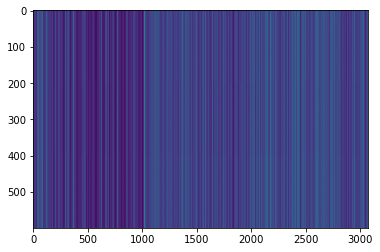

,AUC,pAUC
Source_0,0.393200,0.481053
Source_1,0.411200,0.482105
Source_2,0.502600,0.513158
Target_0,0.456600,0.522632
Target_1,0.512900,0.501579
Target_2,0.513900,0.527368
mean,0.465067,0.504649
h_mean,0.459753,0.503988


2021-04-26 16:41:04,292 - pytorch_modeler.py - INFO - epoch:1/300, train_losses:60.869143, val_AUC_hmean:0.459753, val_pAUC_hmean:0.503988, best_flag:True
2021-04-26 16:41:04,293 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.54it/s]
2021-04-26 16:41:04,736 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.55it/s]
2021-04-26 16:41:04,909 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.01it/s]
2021-04-26 16:41:05,109 - pytorch_modeler.py - INFO - epoch:2/300, train_losses:77.304045, val_AUC_hmean:0.468730, val_pAUC_hmean:0.499222, best_flag:False
2021-04-26 16:41:05,110 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.80it/s]
2021-04-26 16:41:05,529 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.56it/s]
2021-04-26 16:41:05,702 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


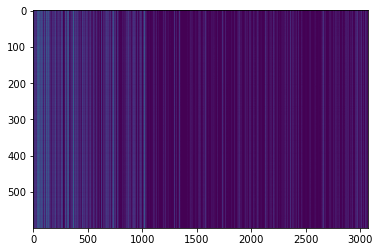

,AUC,pAUC
Source_0,0.365000,0.494211
Source_1,0.480300,0.535789
Source_2,0.561700,0.484737
Target_0,0.581800,0.535789
Target_1,0.489800,0.507895
Target_2,0.511800,0.482632
mean,0.498400,0.506842
h_mean,0.487155,0.505898


2021-04-26 16:41:06,791 - pytorch_modeler.py - INFO - epoch:3/300, train_losses:22.876905, val_AUC_hmean:0.487155, val_pAUC_hmean:0.505898, best_flag:True
2021-04-26 16:41:06,792 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.66it/s]
2021-04-26 16:41:07,224 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.61it/s]
2021-04-26 16:41:07,395 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.71it/s]
2021-04-26 16:41:07,568 - pytorch_modeler.py - INFO - epoch:4/300, train_losses:14.607456, val_AUC_hmean:0.498645, val_pAUC_hmean:0.505035, best_flag:False
2021-04-26 16:41:07,569 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.74it/s]
2021-04-26 16:41:07,993 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.65it/s]
2021-04-26 16:41:08,164 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.37it/s]
2021-04-26 16:41:08,345 -

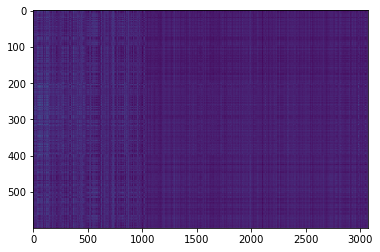

,AUC,pAUC
Source_0,0.363300,0.487368
Source_1,0.486700,0.505789
Source_2,0.540400,0.506842
Target_0,0.622100,0.528421
Target_1,0.487400,0.508421
Target_2,0.482000,0.510526
mean,0.496983,0.507895
h_mean,0.484202,0.507614


2021-04-26 16:41:20,392 - pytorch_modeler.py - INFO - epoch:19/300, train_losses:1.154878, val_AUC_hmean:0.484202, val_pAUC_hmean:0.507614, best_flag:True
2021-04-26 16:41:20,393 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.70it/s]
2021-04-26 16:41:20,822 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.56it/s]
2021-04-26 16:41:20,993 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.09it/s]
2021-04-26 16:41:21,182 - pytorch_modeler.py - INFO - epoch:20/300, train_losses:1.095601, val_AUC_hmean:0.486389, val_pAUC_hmean:0.505308, best_flag:False
2021-04-26 16:41:21,184 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.72it/s]
2021-04-26 16:41:21,611 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.99it/s]
2021-04-26 16:41:21,804 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.31it/s]
2021-04-26 16:41:21,987 -

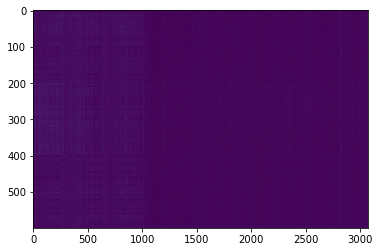

,AUC,pAUC
Source_0,0.561900,0.552632
Source_1,0.503400,0.514211
Source_2,0.539300,0.536842
Target_0,0.616700,0.512632
Target_1,0.452700,0.479474
Target_2,0.470800,0.491579
mean,0.524133,0.514561
h_mean,0.518360,0.513365


2021-04-26 16:41:27,607 - pytorch_modeler.py - INFO - epoch:27/300, train_losses:0.712226, val_AUC_hmean:0.518360, val_pAUC_hmean:0.513365, best_flag:True
2021-04-26 16:41:27,608 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.56it/s]
2021-04-26 16:41:28,049 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.49it/s]
2021-04-26 16:41:28,223 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.42it/s]


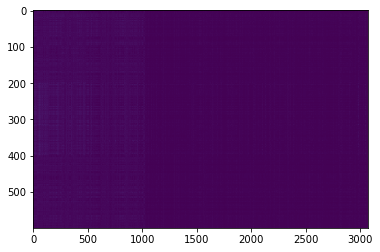

,AUC,pAUC
Source_0,0.582900,0.598421
Source_1,0.501500,0.520000
Source_2,0.538600,0.540000
Target_0,0.608400,0.524737
Target_1,0.463800,0.484737
Target_2,0.468000,0.486316
mean,0.527200,0.525702
h_mean,0.521614,0.523060


2021-04-26 16:41:29,331 - pytorch_modeler.py - INFO - epoch:28/300, train_losses:0.681223, val_AUC_hmean:0.521614, val_pAUC_hmean:0.523060, best_flag:True
2021-04-26 16:41:29,332 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.57it/s]
2021-04-26 16:41:29,772 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.45it/s]
2021-04-26 16:41:29,948 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


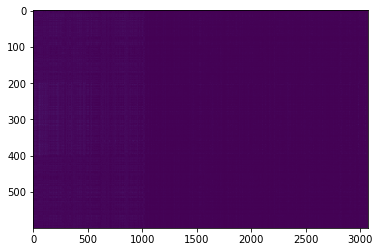

,AUC,pAUC
Source_0,0.583100,0.629474
Source_1,0.502800,0.520526
Source_2,0.538900,0.533684
Target_0,0.594600,0.521053
Target_1,0.491000,0.483684
Target_2,0.465900,0.490526
mean,0.529383,0.529825
h_mean,0.525196,0.525909


2021-04-26 16:41:31,060 - pytorch_modeler.py - INFO - epoch:29/300, train_losses:0.658833, val_AUC_hmean:0.525196, val_pAUC_hmean:0.525909, best_flag:True
2021-04-26 16:41:31,061 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.45it/s]
2021-04-26 16:41:31,513 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.64it/s]
2021-04-26 16:41:31,684 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.62it/s]
2021-04-26 16:41:31,857 - pytorch_modeler.py - INFO - epoch:30/300, train_losses:0.627380, val_AUC_hmean:0.520098, val_pAUC_hmean:0.525677, best_flag:False
2021-04-26 16:41:31,859 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.71it/s]
2021-04-26 16:41:32,286 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.55it/s]
2021-04-26 16:41:32,458 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.52it/s]
2021-04-26 16:41:32,634 -

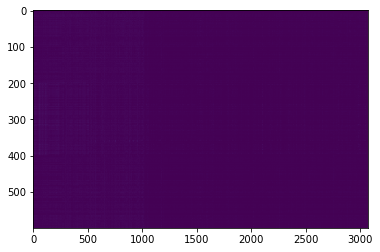

,AUC,pAUC
Source_0,0.605800,0.635263
Source_1,0.479400,0.522632
Source_2,0.584100,0.537368
Target_0,0.542100,0.504737
Target_1,0.484500,0.487368
Target_2,0.518100,0.494737
mean,0.535667,0.530351
h_mean,0.531563,0.526186


2021-04-26 16:41:39,928 - pytorch_modeler.py - INFO - epoch:39/300, train_losses:0.515955, val_AUC_hmean:0.531563, val_pAUC_hmean:0.526186, best_flag:True
2021-04-26 16:41:39,929 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.72it/s]
2021-04-26 16:41:40,355 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.51it/s]
2021-04-26 16:41:40,530 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.45it/s]


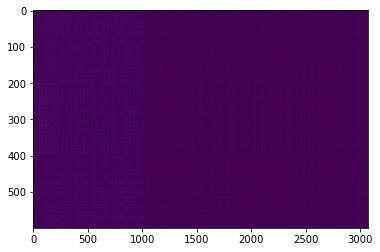

,AUC,pAUC
Source_0,0.622300,0.634737
Source_1,0.473600,0.520526
Source_2,0.603400,0.541053
Target_0,0.544600,0.504211
Target_1,0.479200,0.486842
Target_2,0.551300,0.496316
mean,0.545733,0.530614
h_mean,0.539927,0.526453


2021-04-26 16:41:41,622 - pytorch_modeler.py - INFO - epoch:40/300, train_losses:0.498480, val_AUC_hmean:0.539927, val_pAUC_hmean:0.526453, best_flag:True
2021-04-26 16:41:41,623 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.75it/s]
2021-04-26 16:41:42,047 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.49it/s]
2021-04-26 16:41:42,220 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.66it/s]


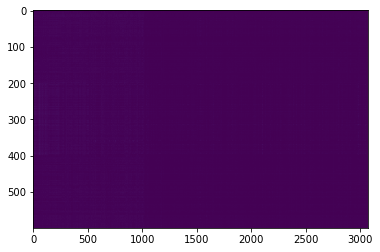

,AUC,pAUC
Source_0,0.622000,0.633684
Source_1,0.482700,0.515789
Source_2,0.597900,0.548421
Target_0,0.536300,0.502632
Target_1,0.471100,0.486316
Target_2,0.553400,0.497368
mean,0.543900,0.530702
h_mean,0.538298,0.526470


2021-04-26 16:41:43,316 - pytorch_modeler.py - INFO - epoch:41/300, train_losses:0.490513, val_AUC_hmean:0.538298, val_pAUC_hmean:0.526470, best_flag:True
2021-04-26 16:41:43,317 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.57it/s]
2021-04-26 16:41:43,756 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.29it/s]
2021-04-26 16:41:43,940 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.39it/s]
2021-04-26 16:41:44,118 - pytorch_modeler.py - INFO - epoch:42/300, train_losses:0.478061, val_AUC_hmean:0.547590, val_pAUC_hmean:0.525443, best_flag:False
2021-04-26 16:41:44,119 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.55it/s]
2021-04-26 16:41:44,561 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.56it/s]
2021-04-26 16:41:44,732 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.25it/s]
2021-04-26 16:41:44,914 -

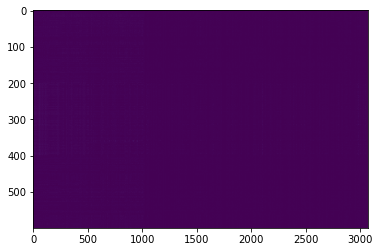

,AUC,pAUC
Source_0,0.632300,0.638421
Source_1,0.516500,0.507368
Source_2,0.602700,0.560000
Target_0,0.528400,0.500000
Target_1,0.491300,0.486316
Target_2,0.556200,0.497895
mean,0.554567,0.531667
h_mean,0.550324,0.526881


2021-04-26 16:41:47,468 - pytorch_modeler.py - INFO - epoch:45/300, train_losses:0.456517, val_AUC_hmean:0.550324, val_pAUC_hmean:0.526881, best_flag:True
2021-04-26 16:41:47,469 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.73it/s]
2021-04-26 16:41:47,894 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.25it/s]
2021-04-26 16:41:48,074 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.44it/s]


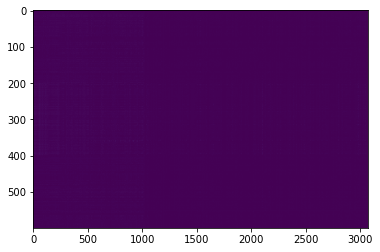

,AUC,pAUC
Source_0,0.636500,0.640000
Source_1,0.511100,0.508421
Source_2,0.594700,0.564737
Target_0,0.525600,0.500526
Target_1,0.479900,0.487368
Target_2,0.545700,0.494737
mean,0.548917,0.532632
h_mean,0.544068,0.527653


2021-04-26 16:41:49,191 - pytorch_modeler.py - INFO - epoch:46/300, train_losses:0.448462, val_AUC_hmean:0.544068, val_pAUC_hmean:0.527653, best_flag:True
2021-04-26 16:41:49,192 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.43it/s]
2021-04-26 16:41:49,645 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.46it/s]
2021-04-26 16:41:49,819 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.23it/s]


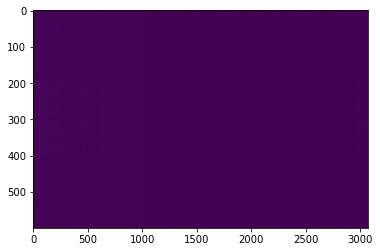

,AUC,pAUC
Source_0,0.643100,0.638947
Source_1,0.513900,0.508421
Source_2,0.595500,0.569474
Target_0,0.523400,0.500526
Target_1,0.471800,0.486316
Target_2,0.547100,0.497895
mean,0.549133,0.533596
h_mean,0.543573,0.528607


2021-04-26 16:41:50,914 - pytorch_modeler.py - INFO - epoch:47/300, train_losses:0.440641, val_AUC_hmean:0.543573, val_pAUC_hmean:0.528607, best_flag:True
2021-04-26 16:41:50,915 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.61it/s]
2021-04-26 16:41:51,350 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.43it/s]
2021-04-26 16:41:51,526 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.35it/s]
2021-04-26 16:41:51,707 - pytorch_modeler.py - INFO - epoch:48/300, train_losses:0.436312, val_AUC_hmean:0.542045, val_pAUC_hmean:0.527406, best_flag:False
2021-04-26 16:41:51,709 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.80it/s]
2021-04-26 16:41:52,127 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.84it/s]
2021-04-26 16:41:52,319 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.56it/s]
2021-04-26 16:41:52,496 -

100%|██████████| 1/1 [00:00<00:00,  5.90it/s]
2021-04-26 16:42:04,555 - pytorch_modeler.py - INFO - epoch:64/300, train_losses:0.357760, val_AUC_hmean:0.545900, val_pAUC_hmean:0.527376, best_flag:False
2021-04-26 16:42:04,557 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.66it/s]
2021-04-26 16:42:04,988 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.53it/s]
2021-04-26 16:42:05,189 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.36it/s]
2021-04-26 16:42:05,370 - pytorch_modeler.py - INFO - epoch:65/300, train_losses:0.348670, val_AUC_hmean:0.542967, val_pAUC_hmean:0.527729, best_flag:False
2021-04-26 16:42:05,372 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.67it/s]
2021-04-26 16:42:05,803 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.56it/s]
2021-04-26 16:42:05,975 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00

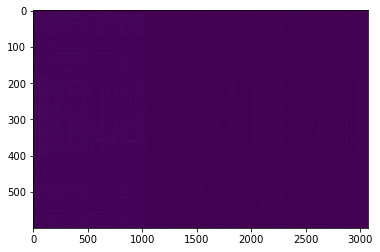

,AUC,pAUC
Source_0,0.637200,0.635789
Source_1,0.566000,0.514737
Source_2,0.611300,0.570000
Target_0,0.500300,0.504211
Target_1,0.463000,0.478421
Target_2,0.572800,0.500000
mean,0.558433,0.533860
h_mean,0.551651,0.528938


2021-04-26 16:42:16,788 - pytorch_modeler.py - INFO - epoch:78/300, train_losses:0.308813, val_AUC_hmean:0.551651, val_pAUC_hmean:0.528938, best_flag:True
2021-04-26 16:42:16,788 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.43it/s]
2021-04-26 16:42:17,373 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.24it/s]
2021-04-26 16:42:17,554 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.50it/s]
2021-04-26 16:42:17,731 - pytorch_modeler.py - INFO - epoch:79/300, train_losses:0.311705, val_AUC_hmean:0.550622, val_pAUC_hmean:0.528242, best_flag:False
2021-04-26 16:42:17,732 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.52it/s]
2021-04-26 16:42:18,302 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.01it/s]
2021-04-26 16:42:18,487 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.46it/s]


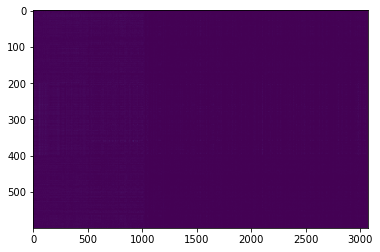

,AUC,pAUC
Source_0,0.641200,0.636842
Source_1,0.550800,0.512632
Source_2,0.611600,0.580000
Target_0,0.510000,0.503158
Target_1,0.462600,0.478421
Target_2,0.570900,0.498421
mean,0.557850,0.534912
h_mean,0.551254,0.529610


2021-04-26 16:42:19,589 - pytorch_modeler.py - INFO - epoch:80/300, train_losses:0.303376, val_AUC_hmean:0.551254, val_pAUC_hmean:0.529610, best_flag:True
2021-04-26 16:42:19,590 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.43it/s]
2021-04-26 16:42:20,175 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.09it/s]
2021-04-26 16:42:20,362 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.42it/s]
2021-04-26 16:42:20,541 - pytorch_modeler.py - INFO - epoch:81/300, train_losses:0.300132, val_AUC_hmean:0.546603, val_pAUC_hmean:0.528748, best_flag:False
2021-04-26 16:42:20,542 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.36it/s]
2021-04-26 16:42:21,139 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.07it/s]
2021-04-26 16:42:21,325 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.28it/s]
2021-04-26 16:42:21,514 -

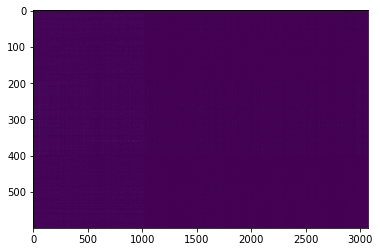

,AUC,pAUC
Source_0,0.649800,0.631579
Source_1,0.555200,0.521053
Source_2,0.607500,0.575789
Target_0,0.499000,0.502632
Target_1,0.457600,0.478421
Target_2,0.564300,0.498421
mean,0.555567,0.534649
h_mean,0.548065,0.529785


2021-04-26 16:42:35,576 - pytorch_modeler.py - INFO - epoch:96/300, train_losses:0.276438, val_AUC_hmean:0.548065, val_pAUC_hmean:0.529785, best_flag:True
2021-04-26 16:42:35,577 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.48it/s]
2021-04-26 16:42:36,155 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.14it/s]
2021-04-26 16:42:36,343 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.99it/s]
2021-04-26 16:42:36,533 - pytorch_modeler.py - INFO - epoch:97/300, train_losses:0.272020, val_AUC_hmean:0.552542, val_pAUC_hmean:0.528809, best_flag:False
2021-04-26 16:42:36,535 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.57it/s]
2021-04-26 16:42:37,097 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.46it/s]
2021-04-26 16:42:37,272 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.64it/s]
2021-04-26 16:42:37,452 -

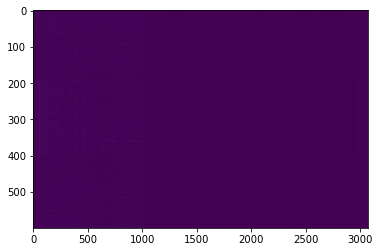

,AUC,pAUC
Source_0,0.651800,0.630526
Source_1,0.565700,0.522105
Source_2,0.622100,0.576842
Target_0,0.494700,0.503684
Target_1,0.454500,0.478421
Target_2,0.580200,0.501053
mean,0.561500,0.535439
h_mean,0.552762,0.530680


2021-04-26 16:42:49,747 - pytorch_modeler.py - INFO - epoch:110/300, train_losses:0.252312, val_AUC_hmean:0.552762, val_pAUC_hmean:0.530680, best_flag:True
2021-04-26 16:42:49,748 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.52it/s]
2021-04-26 16:42:50,319 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.42it/s]
2021-04-26 16:42:50,495 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.46it/s]
2021-04-26 16:42:50,673 - pytorch_modeler.py - INFO - epoch:111/300, train_losses:0.250584, val_AUC_hmean:0.548223, val_pAUC_hmean:0.528609, best_flag:False
2021-04-26 16:42:50,675 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.36it/s]
2021-04-26 16:42:51,272 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.19it/s]
2021-04-26 16:42:51,454 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.42it/s]
2021-04-26 16:42:51,633

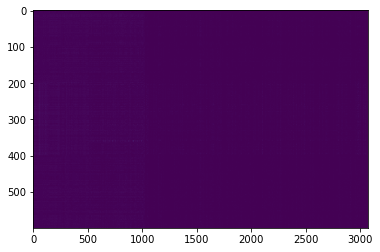

,AUC,pAUC
Source_0,0.645300,0.632105
Source_1,0.530800,0.526316
Source_2,0.634900,0.570526
Target_0,0.499600,0.504737
Target_1,0.450400,0.478421
Target_2,0.586500,0.500000
mean,0.557917,0.535351
h_mean,0.548669,0.530681


2021-04-26 16:42:56,320 - pytorch_modeler.py - INFO - epoch:116/300, train_losses:0.249422, val_AUC_hmean:0.548669, val_pAUC_hmean:0.530681, best_flag:True
2021-04-26 16:42:56,321 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.53it/s]
2021-04-26 16:42:56,890 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.63it/s]
2021-04-26 16:42:57,087 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.43it/s]
2021-04-26 16:42:57,265 - pytorch_modeler.py - INFO - epoch:117/300, train_losses:0.245408, val_AUC_hmean:0.548885, val_pAUC_hmean:0.529678, best_flag:False
2021-04-26 16:42:57,266 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.44it/s]
2021-04-26 16:42:57,850 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.10it/s]
2021-04-26 16:42:58,035 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.58it/s]
2021-04-26 16:42:58,209

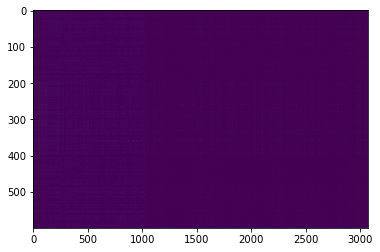

,AUC,pAUC
Source_0,0.643500,0.633684
Source_1,0.578200,0.521053
Source_2,0.616000,0.576316
Target_0,0.492500,0.503684
Target_1,0.458300,0.477895
Target_2,0.583600,0.501579
mean,0.562017,0.535702
h_mean,0.553872,0.530785


2021-04-26 16:43:03,007 - pytorch_modeler.py - INFO - epoch:122/300, train_losses:0.235813, val_AUC_hmean:0.553872, val_pAUC_hmean:0.530785, best_flag:True
2021-04-26 16:43:03,008 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.46it/s]
2021-04-26 16:43:03,587 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.50it/s]
2021-04-26 16:43:03,762 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.57it/s]
2021-04-26 16:43:03,972 - pytorch_modeler.py - INFO - epoch:123/300, train_losses:0.235379, val_AUC_hmean:0.549915, val_pAUC_hmean:0.529973, best_flag:False
2021-04-26 16:43:03,973 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.41it/s]
2021-04-26 16:43:04,563 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.49it/s]
2021-04-26 16:43:04,737 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.87it/s]
2021-04-26 16:43:04,938

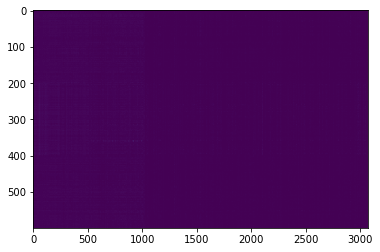

,AUC,pAUC
Source_0,0.630400,0.631579
Source_1,0.563200,0.524737
Source_2,0.619500,0.576842
Target_0,0.495200,0.503684
Target_1,0.448200,0.478421
Target_2,0.555200,0.500000
mean,0.551950,0.535877
h_mean,0.544082,0.531058


2021-04-26 16:43:10,596 - pytorch_modeler.py - INFO - epoch:129/300, train_losses:0.229716, val_AUC_hmean:0.544082, val_pAUC_hmean:0.531058, best_flag:True
2021-04-26 16:43:10,597 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.43it/s]
2021-04-26 16:43:11,183 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  2.96it/s]
2021-04-26 16:43:11,547 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  3.29it/s]


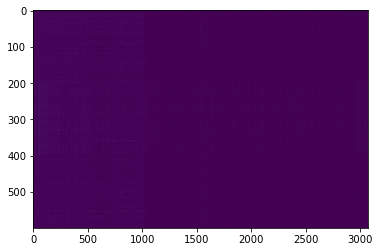

,AUC,pAUC
Source_0,0.649500,0.640000
Source_1,0.557900,0.519474
Source_2,0.618900,0.574211
Target_0,0.499800,0.504737
Target_1,0.444100,0.477895
Target_2,0.578700,0.501579
mean,0.558150,0.536316
h_mean,0.549028,0.531138


2021-04-26 16:43:12,829 - pytorch_modeler.py - INFO - epoch:130/300, train_losses:0.231357, val_AUC_hmean:0.549028, val_pAUC_hmean:0.531138, best_flag:True
2021-04-26 16:43:12,830 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.35it/s]
2021-04-26 16:43:13,291 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.49it/s]
2021-04-26 16:43:13,473 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.80it/s]
2021-04-26 16:43:13,676 - pytorch_modeler.py - INFO - epoch:131/300, train_losses:0.224177, val_AUC_hmean:0.554644, val_pAUC_hmean:0.530136, best_flag:False
2021-04-26 16:43:13,677 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.50it/s]
2021-04-26 16:43:14,124 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.41it/s]
2021-04-26 16:43:14,299 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.96it/s]
2021-04-26 16:43:14,496

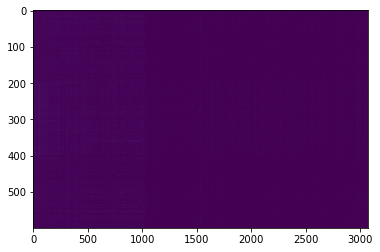

,AUC,pAUC
Source_0,0.655600,0.636316
Source_1,0.550300,0.528947
Source_2,0.622500,0.571053
Target_0,0.502400,0.505789
Target_1,0.445400,0.477895
Target_2,0.577900,0.502632
mean,0.559017,0.537105
h_mean,0.549704,0.532274


2021-04-26 16:43:16,187 - pytorch_modeler.py - INFO - epoch:133/300, train_losses:0.224318, val_AUC_hmean:0.549704, val_pAUC_hmean:0.532274, best_flag:True
2021-04-26 16:43:16,188 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.55it/s]
2021-04-26 16:43:16,630 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.15it/s]
2021-04-26 16:43:16,812 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.15it/s]
2021-04-26 16:43:16,998 - pytorch_modeler.py - INFO - epoch:134/300, train_losses:0.222124, val_AUC_hmean:0.547531, val_pAUC_hmean:0.531737, best_flag:False
2021-04-26 16:43:16,999 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.65it/s]
2021-04-26 16:43:17,432 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.96it/s]
2021-04-26 16:43:17,620 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.55it/s]
2021-04-26 16:43:17,795

100%|██████████| 2/2 [00:00<00:00,  4.62it/s]
2021-04-26 16:43:42,977 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.64it/s]
2021-04-26 16:43:43,154 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.63it/s]
2021-04-26 16:43:43,357 - pytorch_modeler.py - INFO - epoch:167/300, train_losses:0.206371, val_AUC_hmean:0.553454, val_pAUC_hmean:0.528597, best_flag:False
2021-04-26 16:43:43,358 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.66it/s]
2021-04-26 16:43:43,790 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.53it/s]
2021-04-26 16:43:43,966 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.84it/s]
2021-04-26 16:43:44,161 - pytorch_modeler.py - INFO - epoch:168/300, train_losses:0.205493, val_AUC_hmean:0.554878, val_pAUC_hmean:0.528890, best_flag:False
2021-04-26 16:43:44,162 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [

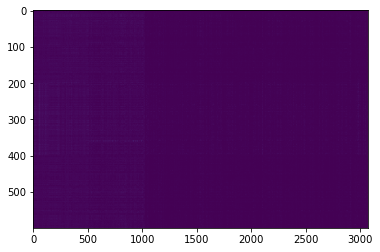

,AUC,pAUC
Source_0,0.639900,0.638421
Source_1,0.552700,0.524737
Source_2,0.628800,0.570526
Target_0,0.498200,0.507368
Target_1,0.447900,0.478421
Target_2,0.582700,0.505789
mean,0.558367,0.537544
h_mean,0.549532,0.532712


2021-04-26 16:43:45,821 - pytorch_modeler.py - INFO - epoch:169/300, train_losses:0.199474, val_AUC_hmean:0.549532, val_pAUC_hmean:0.532712, best_flag:True
2021-04-26 16:43:45,822 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.44it/s]
2021-04-26 16:43:46,276 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.36it/s]
2021-04-26 16:43:46,454 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.30it/s]
2021-04-26 16:43:46,641 - pytorch_modeler.py - INFO - epoch:170/300, train_losses:0.199922, val_AUC_hmean:0.552548, val_pAUC_hmean:0.529521, best_flag:False
2021-04-26 16:43:46,642 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.53it/s]
2021-04-26 16:43:47,086 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.37it/s]
2021-04-26 16:43:47,264 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.52it/s]
2021-04-26 16:43:47,441

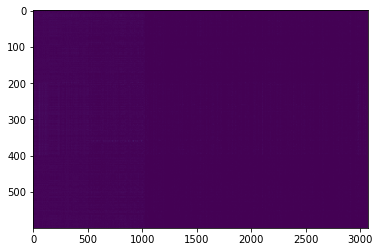

,AUC,pAUC
Source_0,0.648200,0.634737
Source_1,0.575300,0.527368
Source_2,0.639400,0.583684
Target_0,0.504400,0.503684
Target_1,0.440900,0.477895
Target_2,0.568700,0.504211
mean,0.562817,0.538596
h_mean,0.552794,0.533518


2021-04-26 16:44:03,741 - pytorch_modeler.py - INFO - epoch:190/300, train_losses:0.182346, val_AUC_hmean:0.552794, val_pAUC_hmean:0.533518, best_flag:True
2021-04-26 16:44:03,742 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.80it/s]
2021-04-26 16:44:04,162 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.66it/s]
2021-04-26 16:44:04,332 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.46it/s]
2021-04-26 16:44:04,509 - pytorch_modeler.py - INFO - epoch:191/300, train_losses:0.185262, val_AUC_hmean:0.553552, val_pAUC_hmean:0.528706, best_flag:False
2021-04-26 16:44:04,510 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.63it/s]
2021-04-26 16:44:04,945 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.02it/s]
2021-04-26 16:44:05,132 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.60it/s]
2021-04-26 16:44:05,312

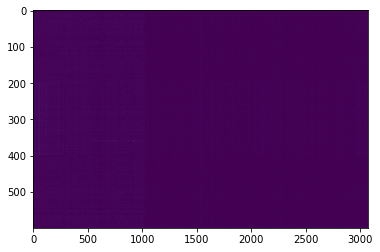

,AUC,pAUC
Source_0,0.63250,0.635263
Source_1,0.57480,0.532632
Source_2,0.63430,0.587368
Target_0,0.50850,0.503684
Target_1,0.42680,0.478421
Target_2,0.56540,0.502105
mean,0.55705,0.539912
h_mean,0.54667,0.534696


2021-04-26 16:44:07,005 - pytorch_modeler.py - INFO - epoch:193/300, train_losses:0.182128, val_AUC_hmean:0.546670, val_pAUC_hmean:0.534696, best_flag:True
2021-04-26 16:44:07,006 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.40it/s]
2021-04-26 16:44:07,462 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.16it/s]
2021-04-26 16:44:07,646 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.66it/s]
2021-04-26 16:44:07,846 - pytorch_modeler.py - INFO - epoch:194/300, train_losses:0.181306, val_AUC_hmean:0.550435, val_pAUC_hmean:0.530841, best_flag:False
2021-04-26 16:44:07,848 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.77it/s]
2021-04-26 16:44:08,269 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.55it/s]
2021-04-26 16:44:08,448 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.18it/s]
2021-04-26 16:44:08,634

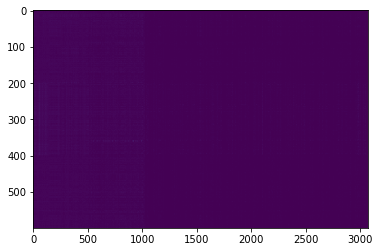

,AUC,pAUC
Source_0,0.649500,0.639474
Source_1,0.571500,0.527895
Source_2,0.638300,0.598421
Target_0,0.501700,0.504737
Target_1,0.431100,0.477895
Target_2,0.556000,0.500526
mean,0.558017,0.541491
h_mean,0.547070,0.535676


2021-04-26 16:44:18,180 - pytorch_modeler.py - INFO - epoch:206/300, train_losses:0.168233, val_AUC_hmean:0.547070, val_pAUC_hmean:0.535676, best_flag:True
2021-04-26 16:44:18,181 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.32it/s]
2021-04-26 16:44:18,646 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.85it/s]
2021-04-26 16:44:18,837 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.65it/s]
2021-04-26 16:44:19,010 - pytorch_modeler.py - INFO - epoch:207/300, train_losses:0.170047, val_AUC_hmean:0.547973, val_pAUC_hmean:0.530017, best_flag:False
2021-04-26 16:44:19,011 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.73it/s]
2021-04-26 16:44:19,436 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.03it/s]
2021-04-26 16:44:19,628 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.51it/s]
2021-04-26 16:44:19,804

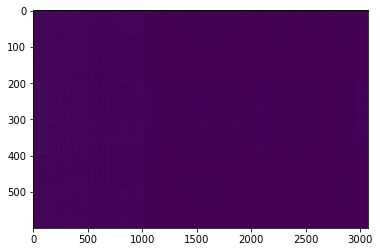

,AUC,pAUC
Source_0,0.643400,0.638421
Source_1,0.569200,0.532105
Source_2,0.635300,0.591053
Target_0,0.502800,0.505263
Target_1,0.440500,0.477895
Target_2,0.557700,0.504737
mean,0.558150,0.541579
h_mean,0.548584,0.536169


2021-04-26 16:44:24,697 - pytorch_modeler.py - INFO - epoch:213/300, train_losses:0.162321, val_AUC_hmean:0.548584, val_pAUC_hmean:0.536169, best_flag:True
2021-04-26 16:44:24,698 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.53it/s]
2021-04-26 16:44:25,142 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.66it/s]
2021-04-26 16:44:25,312 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.62it/s]
2021-04-26 16:44:25,493 - pytorch_modeler.py - INFO - epoch:214/300, train_losses:0.164639, val_AUC_hmean:0.548713, val_pAUC_hmean:0.534514, best_flag:False
2021-04-26 16:44:25,494 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.76it/s]
2021-04-26 16:44:25,917 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.68it/s]
2021-04-26 16:44:26,088 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.65it/s]
2021-04-26 16:44:26,261

100%|██████████| 2/2 [00:00<00:00,  4.30it/s]
2021-04-26 16:44:51,749 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.72it/s]
2021-04-26 16:44:51,922 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.38it/s]
2021-04-26 16:44:52,103 - pytorch_modeler.py - INFO - epoch:247/300, train_losses:0.152252, val_AUC_hmean:0.560658, val_pAUC_hmean:0.531717, best_flag:False
2021-04-26 16:44:52,104 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.77it/s]
2021-04-26 16:44:52,526 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.60it/s]
2021-04-26 16:44:52,699 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.36it/s]
2021-04-26 16:44:52,886 - pytorch_modeler.py - INFO - epoch:248/300, train_losses:0.150448, val_AUC_hmean:0.559673, val_pAUC_hmean:0.534814, best_flag:False
2021-04-26 16:44:52,887 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [

2021-04-26 16:45:04,978 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.51it/s]
2021-04-26 16:45:05,423 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.69it/s]
2021-04-26 16:45:05,594 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.54it/s]
2021-04-26 16:45:05,770 - pytorch_modeler.py - INFO - epoch:264/300, train_losses:0.144757, val_AUC_hmean:0.551946, val_pAUC_hmean:0.534758, best_flag:False
2021-04-26 16:45:05,771 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.95it/s]
2021-04-26 16:45:06,177 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.82it/s]
2021-04-26 16:45:06,344 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.56it/s]
2021-04-26 16:45:06,519 - pytorch_modeler.py - INFO - epoch:265/300, train_losses:0.141490, val_AUC_hmean:0.550401, val_pAUC_hmean:0.532273, best_flag:False
2021-04-26 16:45:06,52

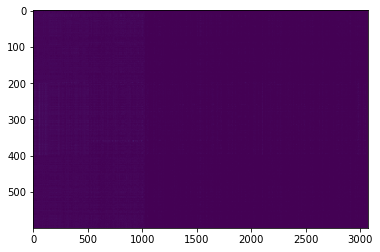

,AUC,pAUC
Source_0,0.662900,0.640000
Source_1,0.563700,0.524211
Source_2,0.646800,0.605789
Target_0,0.486300,0.502105
Target_1,0.425000,0.480000
Target_2,0.558500,0.501579
mean,0.557200,0.542281
h_mean,0.544051,0.536216


2021-04-26 16:45:13,632 - pytorch_modeler.py - INFO - epoch:273/300, train_losses:0.138232, val_AUC_hmean:0.544051, val_pAUC_hmean:0.536216, best_flag:True
2021-04-26 16:45:13,633 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.91it/s]
2021-04-26 16:45:14,043 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.22it/s]
2021-04-26 16:45:14,224 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.79it/s]
2021-04-26 16:45:14,395 - pytorch_modeler.py - INFO - epoch:274/300, train_losses:0.141198, val_AUC_hmean:0.554205, val_pAUC_hmean:0.534093, best_flag:False
2021-04-26 16:45:14,397 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.94it/s]
2021-04-26 16:45:14,803 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.77it/s]
2021-04-26 16:45:14,971 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.83it/s]
2021-04-26 16:45:15,140

,AUC,pAUC
Source_0,0.662900,0.640000
Source_1,0.563700,0.524211
Source_2,0.646800,0.605789
Target_0,0.486300,0.502105
Target_1,0.425000,0.480000
Target_2,0.558500,0.501579
mean,0.557200,0.542281
h_mean,0.544051,0.536216


2021-04-26 16:45:34,600 - 00_train.py - INFO - TARGET MACHINE_TYPE: fan
2021-04-26 16:45:34,601 - 00_train.py - INFO - MAKE DATA_LOADER


elapsed time: 272.228245497 [sec]


2021-04-26 16:45:35,112 - 00_train.py - INFO - TRAINING
2021-04-26 16:45:35,330 - pytorch_modeler.py - INFO - train
  0%|          | 0/2 [00:00<?, ?it/s]

use: cuda:0


100%|██████████| 2/2 [00:00<00:00,  4.40it/s]
2021-04-26 16:45:35,787 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.00it/s]
2021-04-26 16:45:35,973 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.21it/s]


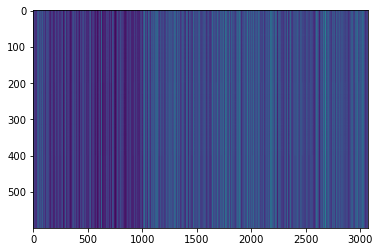

,AUC,pAUC
Source_0,0.489400,0.481053
Source_1,0.510500,0.535263
Source_2,0.470200,0.509474
Target_0,0.443500,0.501053
Target_1,0.481400,0.515789
Target_2,0.427200,0.520526
mean,0.470367,0.510526
h_mean,0.468683,0.509964


2021-04-26 16:45:37,070 - pytorch_modeler.py - INFO - epoch:1/300, train_losses:53.209511, val_AUC_hmean:0.468683, val_pAUC_hmean:0.509964, best_flag:True
2021-04-26 16:45:37,071 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.28it/s]
2021-04-26 16:45:37,542 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.40it/s]
2021-04-26 16:45:37,717 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.39it/s]
2021-04-26 16:45:37,896 - pytorch_modeler.py - INFO - epoch:2/300, train_losses:15.809955, val_AUC_hmean:0.457202, val_pAUC_hmean:0.494418, best_flag:False
2021-04-26 16:45:37,897 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.77it/s]
2021-04-26 16:45:38,319 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.21it/s]
2021-04-26 16:45:38,506 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.34it/s]
2021-04-26 16:45:38,690 -

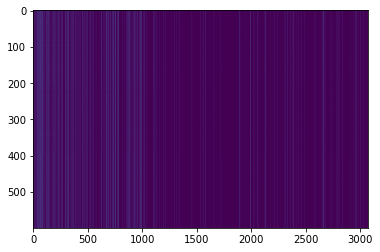

,AUC,pAUC
Source_0,0.565200,0.546316
Source_1,0.497600,0.508947
Source_2,0.449200,0.482105
Target_0,0.577100,0.593158
Target_1,0.450200,0.501579
Target_2,0.460800,0.505263
mean,0.500017,0.522895
h_mean,0.494670,0.520459


2021-04-26 16:45:40,428 - pytorch_modeler.py - INFO - epoch:4/300, train_losses:4.592047, val_AUC_hmean:0.494670, val_pAUC_hmean:0.520459, best_flag:True
2021-04-26 16:45:40,429 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.08it/s]
2021-04-26 16:45:40,921 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.49it/s]
2021-04-26 16:45:41,125 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.44it/s]
2021-04-26 16:45:41,338 - pytorch_modeler.py - INFO - epoch:5/300, train_losses:2.953019, val_AUC_hmean:0.505515, val_pAUC_hmean:0.501320, best_flag:False
2021-04-26 16:45:41,340 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.22it/s]
2021-04-26 16:45:41,819 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.05it/s]
2021-04-26 16:45:42,007 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.75it/s]
2021-04-26 16:45:42,178 - p

100%|██████████| 1/1 [00:00<00:00,  6.85it/s]
2021-04-26 16:45:54,263 - pytorch_modeler.py - INFO - epoch:21/300, train_losses:0.405152, val_AUC_hmean:0.554272, val_pAUC_hmean:0.513597, best_flag:False
2021-04-26 16:45:54,264 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.12it/s]
2021-04-26 16:45:54,751 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.69it/s]
2021-04-26 16:45:54,946 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.46it/s]
2021-04-26 16:45:55,154 - pytorch_modeler.py - INFO - epoch:22/300, train_losses:0.356632, val_AUC_hmean:0.554381, val_pAUC_hmean:0.514964, best_flag:False
2021-04-26 16:45:55,155 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.56it/s]
2021-04-26 16:45:55,597 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.64it/s]
2021-04-26 16:45:55,766 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00

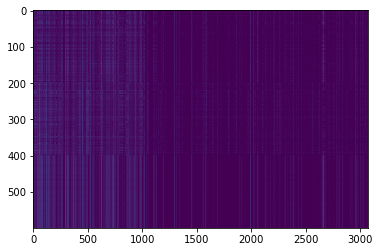

,AUC,pAUC
Source_0,0.587400,0.537895
Source_1,0.540300,0.517895
Source_2,0.499500,0.496842
Target_0,0.652600,0.536842
Target_1,0.568500,0.513158
Target_2,0.562400,0.532105
mean,0.568450,0.522456
h_mean,0.564723,0.522034


2021-04-26 16:46:00,738 - pytorch_modeler.py - INFO - epoch:28/300, train_losses:0.336921, val_AUC_hmean:0.564723, val_pAUC_hmean:0.522034, best_flag:True
2021-04-26 16:46:00,739 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.46it/s]
2021-04-26 16:46:01,189 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.69it/s]
2021-04-26 16:46:01,358 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.53it/s]


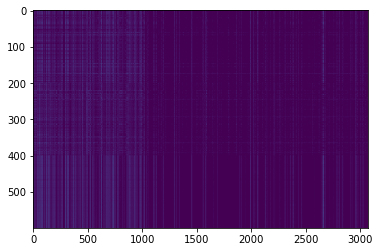

,AUC,pAUC
Source_0,0.591500,0.536316
Source_1,0.538300,0.519474
Source_2,0.506700,0.497895
Target_0,0.655700,0.538421
Target_1,0.565800,0.515789
Target_2,0.559800,0.532632
mean,0.569633,0.523421
h_mean,0.565999,0.523032


2021-04-26 16:46:02,376 - pytorch_modeler.py - INFO - epoch:29/300, train_losses:0.348288, val_AUC_hmean:0.565999, val_pAUC_hmean:0.523032, best_flag:True
2021-04-26 16:46:02,377 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.54it/s]
2021-04-26 16:46:02,820 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.72it/s]
2021-04-26 16:46:02,986 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.85it/s]


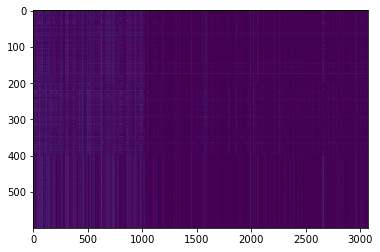

,AUC,pAUC
Source_0,0.593400,0.537368
Source_1,0.537500,0.515789
Source_2,0.498100,0.498947
Target_0,0.657500,0.535789
Target_1,0.565000,0.522632
Target_2,0.558900,0.532632
mean,0.568400,0.523860
h_mean,0.564262,0.523506


2021-04-26 16:46:03,990 - pytorch_modeler.py - INFO - epoch:30/300, train_losses:0.314661, val_AUC_hmean:0.564262, val_pAUC_hmean:0.523506, best_flag:True
2021-04-26 16:46:03,991 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.70it/s]
2021-04-26 16:46:04,419 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.50it/s]
2021-04-26 16:46:04,593 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.66it/s]
2021-04-26 16:46:04,767 - pytorch_modeler.py - INFO - epoch:31/300, train_losses:0.312057, val_AUC_hmean:0.567660, val_pAUC_hmean:0.521237, best_flag:False
2021-04-26 16:46:04,768 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.95it/s]
2021-04-26 16:46:05,174 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.14it/s]
2021-04-26 16:46:05,357 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.29it/s]
2021-04-26 16:46:05,538 -

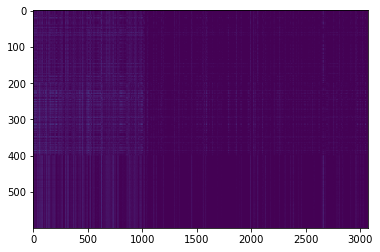

,AUC,pAUC
Source_0,0.609600,0.552632
Source_1,0.528700,0.507895
Source_2,0.495400,0.496842
Target_0,0.661300,0.540526
Target_1,0.557300,0.516842
Target_2,0.560600,0.534211
mean,0.568817,0.524825
h_mean,0.563869,0.524112


2021-04-26 16:46:07,126 - pytorch_modeler.py - INFO - epoch:33/300, train_losses:0.302719, val_AUC_hmean:0.563869, val_pAUC_hmean:0.524112, best_flag:True
2021-04-26 16:46:07,127 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.75it/s]
2021-04-26 16:46:07,550 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.71it/s]
2021-04-26 16:46:07,718 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.83it/s]
2021-04-26 16:46:07,886 - pytorch_modeler.py - INFO - epoch:34/300, train_losses:0.297675, val_AUC_hmean:0.562200, val_pAUC_hmean:0.521374, best_flag:False
2021-04-26 16:46:07,887 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.91it/s]
2021-04-26 16:46:08,297 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.80it/s]
2021-04-26 16:46:08,464 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.68it/s]
2021-04-26 16:46:08,637 -

100%|██████████| 1/1 [00:00<00:00,  6.40it/s]
2021-04-26 16:46:20,380 - pytorch_modeler.py - INFO - epoch:50/300, train_losses:0.283691, val_AUC_hmean:0.569218, val_pAUC_hmean:0.519591, best_flag:False
2021-04-26 16:46:20,381 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.83it/s]
2021-04-26 16:46:20,799 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.40it/s]
2021-04-26 16:46:20,976 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.65it/s]
2021-04-26 16:46:21,151 - pytorch_modeler.py - INFO - epoch:51/300, train_losses:0.276812, val_AUC_hmean:0.572311, val_pAUC_hmean:0.521856, best_flag:False
2021-04-26 16:46:21,152 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.81it/s]
2021-04-26 16:46:21,570 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.21it/s]
2021-04-26 16:46:21,751 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00

100%|██████████| 2/2 [00:00<00:00,  4.60it/s]
2021-04-26 16:46:46,717 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.21it/s]
2021-04-26 16:46:46,900 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.30it/s]
2021-04-26 16:46:47,081 - pytorch_modeler.py - INFO - epoch:84/300, train_losses:0.214301, val_AUC_hmean:0.573731, val_pAUC_hmean:0.518695, best_flag:False
2021-04-26 16:46:47,082 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.79it/s]
2021-04-26 16:46:47,503 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.78it/s]
2021-04-26 16:46:47,695 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.10it/s]
2021-04-26 16:46:47,882 - pytorch_modeler.py - INFO - epoch:85/300, train_losses:0.214334, val_AUC_hmean:0.578084, val_pAUC_hmean:0.518129, best_flag:False
2021-04-26 16:46:47,883 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00

2021-04-26 16:46:59,737 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.81it/s]
2021-04-26 16:47:00,155 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.70it/s]
2021-04-26 16:47:00,325 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.14it/s]
2021-04-26 16:47:00,510 - pytorch_modeler.py - INFO - epoch:101/300, train_losses:0.190406, val_AUC_hmean:0.573485, val_pAUC_hmean:0.519877, best_flag:False
2021-04-26 16:47:00,510 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.86it/s]
2021-04-26 16:47:00,925 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.75it/s]
2021-04-26 16:47:01,094 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.56it/s]
2021-04-26 16:47:01,267 - pytorch_modeler.py - INFO - epoch:102/300, train_losses:0.187595, val_AUC_hmean:0.570015, val_pAUC_hmean:0.518478, best_flag:False
2021-04-26 16:47:01,26

2021-04-26 16:47:13,075 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.81it/s]
2021-04-26 16:47:13,493 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.44it/s]
2021-04-26 16:47:13,667 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.68it/s]
2021-04-26 16:47:13,839 - pytorch_modeler.py - INFO - epoch:118/300, train_losses:0.171307, val_AUC_hmean:0.581247, val_pAUC_hmean:0.520200, best_flag:False
2021-04-26 16:47:13,840 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.64it/s]
2021-04-26 16:47:14,274 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.07it/s]
2021-04-26 16:47:14,459 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.86it/s]
2021-04-26 16:47:14,654 - pytorch_modeler.py - INFO - epoch:119/300, train_losses:0.172410, val_AUC_hmean:0.574700, val_pAUC_hmean:0.520745, best_flag:False
2021-04-26 16:47:14,65

2021-04-26 16:47:26,311 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.75it/s]
2021-04-26 16:47:26,735 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.21it/s]
2021-04-26 16:47:26,917 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.52it/s]
2021-04-26 16:47:27,094 - pytorch_modeler.py - INFO - epoch:135/300, train_losses:0.156584, val_AUC_hmean:0.577880, val_pAUC_hmean:0.520692, best_flag:False
2021-04-26 16:47:27,096 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.63it/s]
2021-04-26 16:47:27,530 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.22it/s]
2021-04-26 16:47:27,710 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.14it/s]
2021-04-26 16:47:27,898 - pytorch_modeler.py - INFO - epoch:136/300, train_losses:0.155090, val_AUC_hmean:0.571752, val_pAUC_hmean:0.521451, best_flag:False
2021-04-26 16:47:27,90

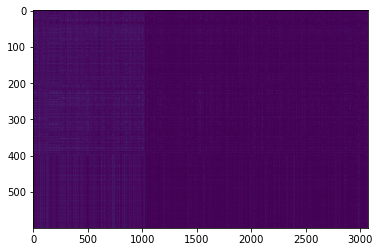

,AUC,pAUC
Source_0,0.663000,0.551579
Source_1,0.532600,0.502105
Source_2,0.562100,0.506316
Target_0,0.707700,0.563684
Target_1,0.525300,0.494737
Target_2,0.518900,0.536842
mean,0.584933,0.525877
h_mean,0.576437,0.524581


2021-04-26 16:47:35,237 - pytorch_modeler.py - INFO - epoch:144/300, train_losses:0.153792, val_AUC_hmean:0.576437, val_pAUC_hmean:0.524581, best_flag:True
2021-04-26 16:47:35,238 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.41it/s]
2021-04-26 16:47:35,694 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.95it/s]
2021-04-26 16:47:35,884 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.07it/s]
2021-04-26 16:47:36,077 - pytorch_modeler.py - INFO - epoch:145/300, train_losses:0.154993, val_AUC_hmean:0.579631, val_pAUC_hmean:0.521361, best_flag:False
2021-04-26 16:47:36,078 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.52it/s]
2021-04-26 16:47:36,524 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.38it/s]
2021-04-26 16:47:36,704 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.43it/s]


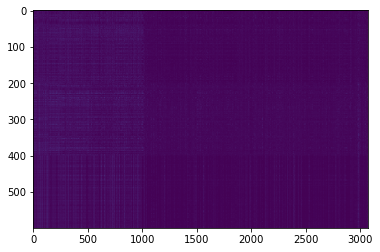

,AUC,pAUC
Source_0,0.669900,0.556316
Source_1,0.521200,0.508947
Source_2,0.568100,0.507368
Target_0,0.695400,0.558947
Target_1,0.533300,0.493158
Target_2,0.546500,0.535263
mean,0.589067,0.526667
h_mean,0.581698,0.525468


2021-04-26 16:47:37,779 - pytorch_modeler.py - INFO - epoch:146/300, train_losses:0.148326, val_AUC_hmean:0.581698, val_pAUC_hmean:0.525468, best_flag:True
2021-04-26 16:47:37,780 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.49it/s]
2021-04-26 16:47:38,356 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.85it/s]
2021-04-26 16:47:38,522 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.01it/s]
2021-04-26 16:47:38,719 - pytorch_modeler.py - INFO - epoch:147/300, train_losses:0.148465, val_AUC_hmean:0.590332, val_pAUC_hmean:0.523730, best_flag:False
2021-04-26 16:47:38,720 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.70it/s]
2021-04-26 16:47:39,263 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.12it/s]
2021-04-26 16:47:39,446 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.24it/s]
2021-04-26 16:47:39,632

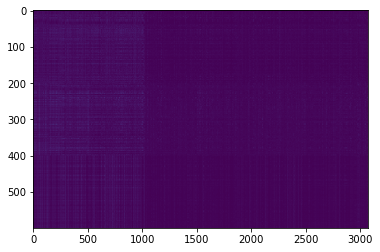

,AUC,pAUC
Source_0,0.693400,0.550526
Source_1,0.508300,0.503158
Source_2,0.584500,0.513158
Target_0,0.697900,0.571579
Target_1,0.528900,0.495789
Target_2,0.534800,0.533684
mean,0.591300,0.527982
h_mean,0.581744,0.526644


2021-04-26 16:47:41,488 - pytorch_modeler.py - INFO - epoch:149/300, train_losses:0.146885, val_AUC_hmean:0.581744, val_pAUC_hmean:0.526644, best_flag:True
2021-04-26 16:47:41,489 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.49it/s]
2021-04-26 16:47:42,064 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.95it/s]
2021-04-26 16:47:42,252 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.22it/s]
2021-04-26 16:47:42,437 - pytorch_modeler.py - INFO - epoch:150/300, train_losses:0.141930, val_AUC_hmean:0.582292, val_pAUC_hmean:0.524464, best_flag:False
2021-04-26 16:47:42,438 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.33it/s]
2021-04-26 16:47:43,042 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.51it/s]
2021-04-26 16:47:43,215 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.65it/s]
2021-04-26 16:47:43,389

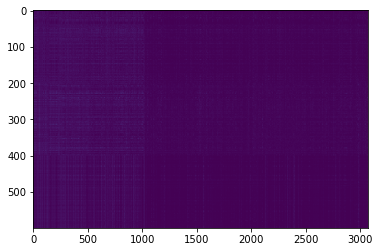

,AUC,pAUC
Source_0,0.660100,0.554211
Source_1,0.550800,0.505789
Source_2,0.569200,0.510526
Target_0,0.692500,0.568421
Target_1,0.523800,0.498421
Target_2,0.520700,0.535263
mean,0.586183,0.528772
h_mean,0.579096,0.527515


2021-04-26 16:47:59,499 - pytorch_modeler.py - INFO - epoch:168/300, train_losses:0.131065, val_AUC_hmean:0.579096, val_pAUC_hmean:0.527515, best_flag:True
2021-04-26 16:47:59,500 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.73it/s]
2021-04-26 16:48:00,039 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.74it/s]
2021-04-26 16:48:00,207 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.80it/s]
2021-04-26 16:48:00,376 - pytorch_modeler.py - INFO - epoch:169/300, train_losses:0.130477, val_AUC_hmean:0.576699, val_pAUC_hmean:0.525888, best_flag:False
2021-04-26 16:48:00,377 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.70it/s]
2021-04-26 16:48:00,920 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.68it/s]
2021-04-26 16:48:01,089 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.69it/s]
2021-04-26 16:48:01,261

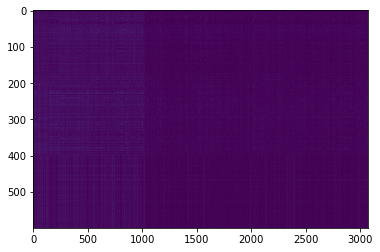

,AUC,pAUC
Source_0,0.673100,0.555263
Source_1,0.540700,0.506316
Source_2,0.552100,0.508421
Target_0,0.691500,0.569474
Target_1,0.512900,0.498947
Target_2,0.525100,0.536316
mean,0.582567,0.529123
h_mean,0.574349,0.527812


2021-04-26 16:48:03,016 - pytorch_modeler.py - INFO - epoch:171/300, train_losses:0.129173, val_AUC_hmean:0.574349, val_pAUC_hmean:0.527812, best_flag:True
2021-04-26 16:48:03,017 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.62it/s]
2021-04-26 16:48:03,572 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.76it/s]
2021-04-26 16:48:03,739 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.70it/s]
2021-04-26 16:48:03,910 - pytorch_modeler.py - INFO - epoch:172/300, train_losses:0.128504, val_AUC_hmean:0.577324, val_pAUC_hmean:0.524813, best_flag:False
2021-04-26 16:48:03,912 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.74it/s]
2021-04-26 16:48:04,449 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.72it/s]
2021-04-26 16:48:04,616 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.54it/s]
2021-04-26 16:48:04,790

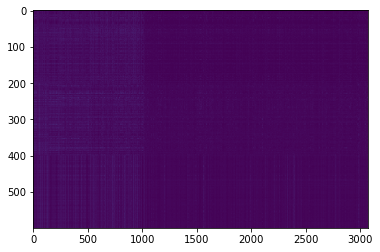

,AUC,pAUC
Source_0,0.673200,0.564737
Source_1,0.523900,0.505789
Source_2,0.589900,0.510526
Target_0,0.709300,0.567895
Target_1,0.516300,0.498947
Target_2,0.532100,0.534737
mean,0.590783,0.530439
h_mean,0.581652,0.529017


2021-04-26 16:48:10,996 - pytorch_modeler.py - INFO - epoch:179/300, train_losses:0.124487, val_AUC_hmean:0.581652, val_pAUC_hmean:0.529017, best_flag:True
2021-04-26 16:48:10,997 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.72it/s]
2021-04-26 16:48:11,537 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.63it/s]
2021-04-26 16:48:11,708 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.73it/s]
2021-04-26 16:48:11,881 - pytorch_modeler.py - INFO - epoch:180/300, train_losses:0.127807, val_AUC_hmean:0.579252, val_pAUC_hmean:0.527853, best_flag:False
2021-04-26 16:48:11,882 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.65it/s]
2021-04-26 16:48:12,431 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.55it/s]
2021-04-26 16:48:12,603 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.51it/s]
2021-04-26 16:48:12,779

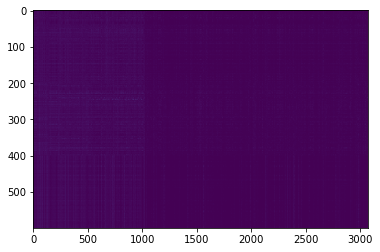

,AUC,pAUC
Source_0,0.651100,0.555263
Source_1,0.534800,0.508421
Source_2,0.566300,0.516842
Target_0,0.684200,0.570000
Target_1,0.523600,0.502105
Target_2,0.514000,0.536316
mean,0.579000,0.531491
h_mean,0.572055,0.530353


2021-04-26 16:48:41,859 - pytorch_modeler.py - INFO - epoch:211/300, train_losses:0.103791, val_AUC_hmean:0.572055, val_pAUC_hmean:0.530353, best_flag:True
2021-04-26 16:48:41,860 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.15it/s]
2021-04-26 16:48:42,497 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  3.31it/s]
2021-04-26 16:48:42,821 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  3.44it/s]
2021-04-26 16:48:43,133 - pytorch_modeler.py - INFO - epoch:212/300, train_losses:0.101328, val_AUC_hmean:0.567234, val_pAUC_hmean:0.526560, best_flag:False
2021-04-26 16:48:43,134 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.48it/s]
2021-04-26 16:48:43,711 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  3.33it/s]
2021-04-26 16:48:44,031 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  3.48it/s]
2021-04-26 16:48:44,341

100%|██████████| 2/2 [00:00<00:00,  4.34it/s]
2021-04-26 16:49:10,596 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.35it/s]
2021-04-26 16:49:10,774 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.82it/s]
2021-04-26 16:49:10,969 - pytorch_modeler.py - INFO - epoch:245/300, train_losses:0.157821, val_AUC_hmean:0.558067, val_pAUC_hmean:0.512390, best_flag:False
2021-04-26 16:49:10,970 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.78it/s]
2021-04-26 16:49:11,391 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.49it/s]
2021-04-26 16:49:11,563 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.76it/s]
2021-04-26 16:49:11,760 - pytorch_modeler.py - INFO - epoch:246/300, train_losses:0.167569, val_AUC_hmean:0.570868, val_pAUC_hmean:0.515846, best_flag:False
2021-04-26 16:49:11,762 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [

2021-04-26 16:49:23,885 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.74it/s]
2021-04-26 16:49:24,309 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.70it/s]
2021-04-26 16:49:24,476 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.61it/s]
2021-04-26 16:49:24,651 - pytorch_modeler.py - INFO - epoch:262/300, train_losses:0.109464, val_AUC_hmean:0.563811, val_pAUC_hmean:0.525912, best_flag:False
2021-04-26 16:49:24,652 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.86it/s]
2021-04-26 16:49:25,065 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.78it/s]
2021-04-26 16:49:25,235 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.77it/s]
2021-04-26 16:49:25,403 - pytorch_modeler.py - INFO - epoch:263/300, train_losses:0.112810, val_AUC_hmean:0.563510, val_pAUC_hmean:0.528433, best_flag:False
2021-04-26 16:49:25,40

2021-04-26 16:49:37,433 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.24it/s]
2021-04-26 16:49:37,908 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.98it/s]
2021-04-26 16:49:38,097 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.06it/s]
2021-04-26 16:49:38,294 - pytorch_modeler.py - INFO - epoch:279/300, train_losses:0.093732, val_AUC_hmean:0.573592, val_pAUC_hmean:0.525695, best_flag:False
2021-04-26 16:49:38,295 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.20it/s]
2021-04-26 16:49:38,773 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.75it/s]
2021-04-26 16:49:38,967 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.60it/s]


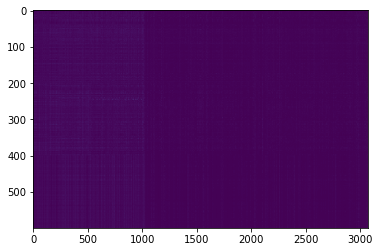

,AUC,pAUC
Source_0,0.679200,0.587368
Source_1,0.545000,0.508421
Source_2,0.563000,0.506316
Target_0,0.696600,0.585263
Target_1,0.522400,0.496842
Target_2,0.501100,0.531579
mean,0.584550,0.535965
h_mean,0.575331,0.533477


2021-04-26 16:49:40,001 - pytorch_modeler.py - INFO - epoch:280/300, train_losses:0.090320, val_AUC_hmean:0.575331, val_pAUC_hmean:0.533477, best_flag:True
2021-04-26 16:49:40,002 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.41it/s]
2021-04-26 16:49:40,458 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.95it/s]
2021-04-26 16:49:40,646 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.20it/s]
2021-04-26 16:49:40,839 - pytorch_modeler.py - INFO - epoch:281/300, train_losses:0.092611, val_AUC_hmean:0.568987, val_pAUC_hmean:0.532830, best_flag:False
2021-04-26 16:49:40,840 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.08it/s]
2021-04-26 16:49:41,333 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.68it/s]
2021-04-26 16:49:41,533 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.72it/s]
2021-04-26 16:49:41,738

,AUC,pAUC
Source_0,0.679200,0.587368
Source_1,0.545000,0.508421
Source_2,0.563000,0.506316
Target_0,0.696600,0.585263
Target_1,0.522400,0.496842
Target_2,0.501100,0.531579
mean,0.584550,0.535965
h_mean,0.575331,0.533477


2021-04-26 16:49:57,314 - 00_train.py - INFO - TARGET MACHINE_TYPE: slider
2021-04-26 16:49:57,315 - 00_train.py - INFO - MAKE DATA_LOADER


elapsed time: 262.713257790 [sec]


2021-04-26 16:49:57,853 - 00_train.py - INFO - TRAINING
2021-04-26 16:49:58,046 - pytorch_modeler.py - INFO - train
  0%|          | 0/2 [00:00<?, ?it/s]

use: cuda:0


100%|██████████| 2/2 [00:00<00:00,  4.79it/s]
2021-04-26 16:49:58,466 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.67it/s]
2021-04-26 16:49:58,636 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.67it/s]


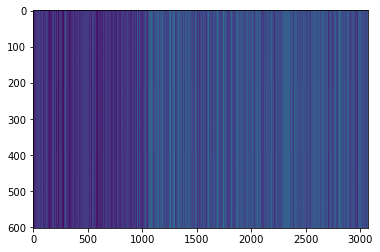

,AUC,pAUC
Source_0,0.390300,0.475789
Source_1,0.377600,0.478421
Source_2,0.328342,0.481190
Target_0,0.434100,0.487368
Target_1,0.428265,0.483459
Target_2,0.486063,0.521743
mean,0.407445,0.487995
h_mean,0.401284,0.487524


2021-04-26 16:49:59,608 - pytorch_modeler.py - INFO - epoch:1/300, train_losses:54.132458, val_AUC_hmean:0.401284, val_pAUC_hmean:0.487524, best_flag:True
2021-04-26 16:49:59,609 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.44it/s]
2021-04-26 16:50:00,061 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.12it/s]
2021-04-26 16:50:00,247 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.17it/s]


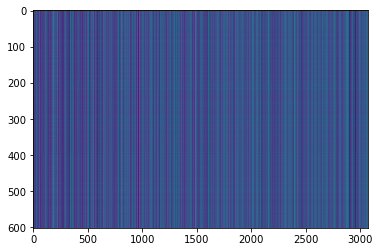

,AUC,pAUC
Source_0,0.439000,0.495789
Source_1,0.391900,0.476842
Source_2,0.384581,0.491510
Target_0,0.425500,0.480526
Target_1,0.419898,0.514823
Target_2,0.468378,0.520023
mean,0.421543,0.496585
h_mean,0.419682,0.496068


2021-04-26 16:50:01,325 - pytorch_modeler.py - INFO - epoch:2/300, train_losses:15.693471, val_AUC_hmean:0.419682, val_pAUC_hmean:0.496068, best_flag:True
2021-04-26 16:50:01,326 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.80it/s]
2021-04-26 16:50:01,744 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.23it/s]
2021-04-26 16:50:01,927 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.70it/s]


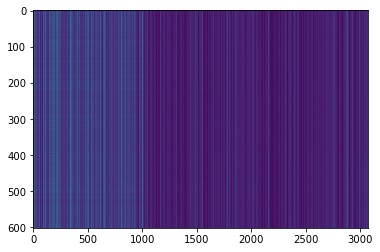

,AUC,pAUC
Source_0,0.448900,0.500000
Source_1,0.391800,0.476316
Source_2,0.383066,0.492448
Target_0,0.428800,0.479474
Target_1,0.426327,0.515789
Target_2,0.465494,0.525183
mean,0.424064,0.498202
h_mean,0.422046,0.497570


2021-04-26 16:50:03,093 - pytorch_modeler.py - INFO - epoch:3/300, train_losses:7.715681, val_AUC_hmean:0.422046, val_pAUC_hmean:0.497570, best_flag:True
2021-04-26 16:50:03,094 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.27it/s]
2021-04-26 16:50:03,565 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.24it/s]
2021-04-26 16:50:03,748 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


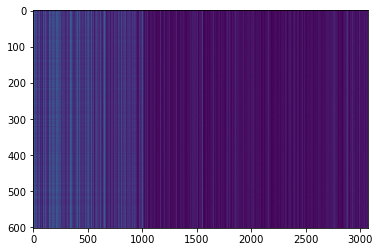

,AUC,pAUC
Source_0,0.454800,0.501579
Source_1,0.394500,0.476316
Source_2,0.379857,0.492448
Target_0,0.433800,0.480000
Target_1,0.431122,0.517401
Target_2,0.463956,0.525689
mean,0.426339,0.498905
h_mean,0.424139,0.498249


2021-04-26 16:50:04,865 - pytorch_modeler.py - INFO - epoch:4/300, train_losses:5.208333, val_AUC_hmean:0.424139, val_pAUC_hmean:0.498249, best_flag:True
2021-04-26 16:50:04,866 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.49it/s]
2021-04-26 16:50:05,315 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.28it/s]
2021-04-26 16:50:05,497 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.35it/s]
2021-04-26 16:50:05,678 - pytorch_modeler.py - INFO - epoch:5/300, train_losses:3.271670, val_AUC_hmean:0.432175, val_pAUC_hmean:0.496662, best_flag:False
2021-04-26 16:50:05,679 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.34it/s]
2021-04-26 16:50:06,143 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.14it/s]
2021-04-26 16:50:06,332 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


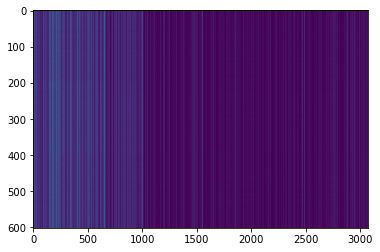

,AUC,pAUC
Source_0,0.458600,0.511579
Source_1,0.409400,0.478947
Source_2,0.399198,0.499015
Target_0,0.435700,0.480526
Target_1,0.432653,0.514608
Target_2,0.470588,0.523058
mean,0.434357,0.501289
h_mean,0.432911,0.500722


2021-04-26 16:50:07,465 - pytorch_modeler.py - INFO - epoch:6/300, train_losses:2.410077, val_AUC_hmean:0.432911, val_pAUC_hmean:0.500722, best_flag:True
2021-04-26 16:50:07,466 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.87it/s]
2021-04-26 16:50:07,984 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.10it/s]
2021-04-26 16:50:08,170 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.21it/s]


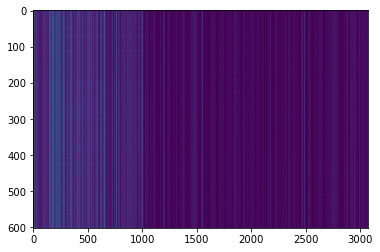

,AUC,pAUC
Source_0,0.458100,0.510000
Source_1,0.412400,0.480000
Source_2,0.412834,0.506520
Target_0,0.434700,0.483684
Target_1,0.426122,0.511923
Target_2,0.474913,0.517999
mean,0.436512,0.501688
h_mean,0.435323,0.501263


2021-04-26 16:50:09,342 - pytorch_modeler.py - INFO - epoch:7/300, train_losses:1.833511, val_AUC_hmean:0.435323, val_pAUC_hmean:0.501263, best_flag:True
2021-04-26 16:50:09,343 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.26it/s]
2021-04-26 16:50:09,814 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.53it/s]
2021-04-26 16:50:10,022 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.83it/s]
2021-04-26 16:50:10,220 - pytorch_modeler.py - INFO - epoch:8/300, train_losses:1.529117, val_AUC_hmean:0.438037, val_pAUC_hmean:0.501232, best_flag:False
2021-04-26 16:50:10,221 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.16it/s]
2021-04-26 16:50:10,704 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.58it/s]
2021-04-26 16:50:10,881 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.18it/s]
2021-04-26 16:50:11,068 - p

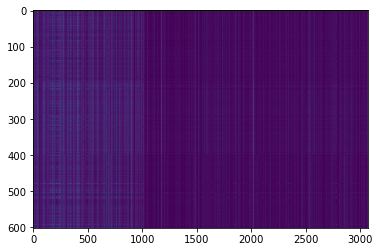

,AUC,pAUC
Source_0,0.567400,0.480526
Source_1,0.595600,0.543158
Source_2,0.577629,0.491040
Target_0,0.534300,0.509474
Target_1,0.542755,0.500644
Target_2,0.594675,0.503430
mean,0.568727,0.504712
h_mean,0.567737,0.503980


2021-04-26 16:50:22,517 - pytorch_modeler.py - INFO - epoch:22/300, train_losses:0.408888, val_AUC_hmean:0.567737, val_pAUC_hmean:0.503980, best_flag:True
2021-04-26 16:50:22,518 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.24it/s]
2021-04-26 16:50:22,992 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.67it/s]
2021-04-26 16:50:23,190 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.07it/s]
2021-04-26 16:50:23,381 - pytorch_modeler.py - INFO - epoch:23/300, train_losses:0.397074, val_AUC_hmean:0.556598, val_pAUC_hmean:0.503005, best_flag:False
2021-04-26 16:50:23,383 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.43it/s]
2021-04-26 16:50:23,836 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.58it/s]
2021-04-26 16:50:24,009 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.12it/s]


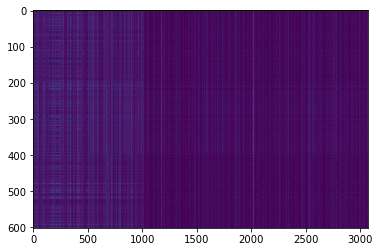

,AUC,pAUC
Source_0,0.561400,0.488421
Source_1,0.623900,0.564737
Source_2,0.585294,0.506051
Target_0,0.551700,0.515263
Target_1,0.555612,0.510097
Target_2,0.602461,0.504644
mean,0.580061,0.514869
h_mean,0.578878,0.513831


2021-04-26 16:50:25,079 - pytorch_modeler.py - INFO - epoch:24/300, train_losses:0.383254, val_AUC_hmean:0.578878, val_pAUC_hmean:0.513831, best_flag:True
2021-04-26 16:50:25,080 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.79it/s]
2021-04-26 16:50:25,500 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.99it/s]
2021-04-26 16:50:25,687 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.35it/s]
2021-04-26 16:50:25,871 - pytorch_modeler.py - INFO - epoch:25/300, train_losses:0.377779, val_AUC_hmean:0.573668, val_pAUC_hmean:0.510824, best_flag:False
2021-04-26 16:50:25,872 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.36it/s]
2021-04-26 16:50:26,334 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.90it/s]
2021-04-26 16:50:26,526 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


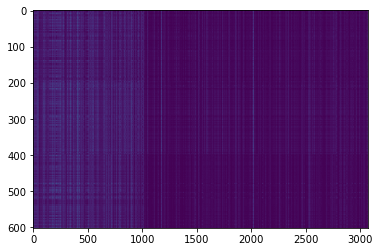

,AUC,pAUC
Source_0,0.565000,0.500526
Source_1,0.614100,0.585789
Source_2,0.610160,0.514964
Target_0,0.547300,0.512632
Target_1,0.544286,0.509882
Target_2,0.616974,0.503329
mean,0.582970,0.521187
h_mean,0.581257,0.519678


2021-04-26 16:50:27,796 - pytorch_modeler.py - INFO - epoch:26/300, train_losses:0.372892, val_AUC_hmean:0.581257, val_pAUC_hmean:0.519678, best_flag:True
2021-04-26 16:50:27,797 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.36it/s]
2021-04-26 16:50:28,258 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.87it/s]
2021-04-26 16:50:28,454 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.55it/s]
2021-04-26 16:50:28,663 - pytorch_modeler.py - INFO - epoch:27/300, train_losses:0.364909, val_AUC_hmean:0.576266, val_pAUC_hmean:0.514236, best_flag:False
2021-04-26 16:50:28,665 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.18it/s]
2021-04-26 16:50:29,145 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.92it/s]
2021-04-26 16:50:29,335 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.19it/s]


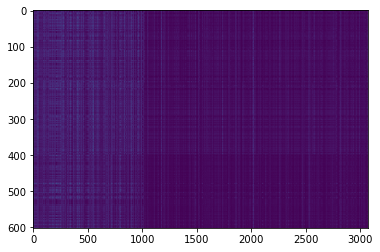

,AUC,pAUC
Source_0,0.589500,0.506842
Source_1,0.638100,0.578421
Source_2,0.603832,0.530913
Target_0,0.557700,0.528421
Target_1,0.560714,0.533298
Target_2,0.616974,0.504340
mean,0.594470,0.530373
h_mean,0.593066,0.529299


2021-04-26 16:50:30,536 - pytorch_modeler.py - INFO - epoch:28/300, train_losses:0.356106, val_AUC_hmean:0.593066, val_pAUC_hmean:0.529299, best_flag:True
2021-04-26 16:50:30,537 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.36it/s]
2021-04-26 16:50:30,999 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.20it/s]
2021-04-26 16:50:31,187 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.52it/s]
2021-04-26 16:50:31,394 - pytorch_modeler.py - INFO - epoch:29/300, train_losses:0.346258, val_AUC_hmean:0.583428, val_pAUC_hmean:0.522910, best_flag:False
2021-04-26 16:50:31,395 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.62it/s]
2021-04-26 16:50:31,831 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.80it/s]
2021-04-26 16:50:32,026 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.46it/s]
2021-04-26 16:50:32,206 -

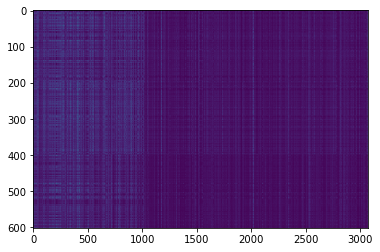

,AUC,pAUC
Source_0,0.601000,0.520526
Source_1,0.626300,0.588421
Source_2,0.629947,0.550145
Target_0,0.556400,0.520000
Target_1,0.550408,0.532438
Target_2,0.641196,0.507173
mean,0.600875,0.536451
h_mean,0.598701,0.535177


2021-04-26 16:50:34,094 - pytorch_modeler.py - INFO - epoch:31/300, train_losses:0.334345, val_AUC_hmean:0.598701, val_pAUC_hmean:0.535177, best_flag:True
2021-04-26 16:50:34,095 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.48it/s]
2021-04-26 16:50:34,544 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.56it/s]
2021-04-26 16:50:34,751 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.80it/s]
2021-04-26 16:50:34,950 - pytorch_modeler.py - INFO - epoch:32/300, train_losses:0.330986, val_AUC_hmean:0.594749, val_pAUC_hmean:0.533107, best_flag:False
2021-04-26 16:50:34,951 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.08it/s]
2021-04-26 16:50:35,444 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.54it/s]
2021-04-26 16:50:35,646 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.22it/s]
2021-04-26 16:50:35,835 -

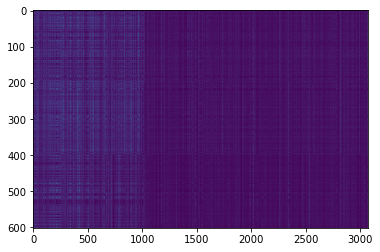

,AUC,pAUC
Source_0,0.604400,0.514211
Source_1,0.635400,0.588947
Source_2,0.646257,0.556244
Target_0,0.553800,0.536842
Target_1,0.558571,0.538883
Target_2,0.653691,0.508286
mean,0.608687,0.540569
h_mean,0.605970,0.539264


2021-04-26 16:50:37,652 - pytorch_modeler.py - INFO - epoch:34/300, train_losses:0.321036, val_AUC_hmean:0.605970, val_pAUC_hmean:0.539264, best_flag:True
2021-04-26 16:50:37,653 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.14it/s]
2021-04-26 16:50:38,139 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.29it/s]
2021-04-26 16:50:38,325 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.38it/s]
2021-04-26 16:50:38,508 - pytorch_modeler.py - INFO - epoch:35/300, train_losses:0.317118, val_AUC_hmean:0.605465, val_pAUC_hmean:0.538040, best_flag:False
2021-04-26 16:50:38,509 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.58it/s]
2021-04-26 16:50:38,948 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.88it/s]
2021-04-26 16:50:39,140 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


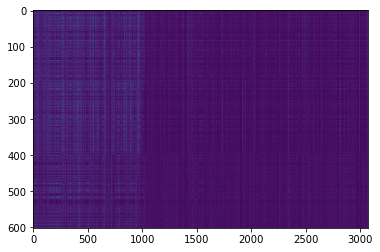

,AUC,pAUC
Source_0,0.580300,0.514211
Source_1,0.651400,0.582632
Source_2,0.657219,0.571723
Target_0,0.554900,0.551053
Target_1,0.569898,0.514286
Target_2,0.653210,0.515571
mean,0.611155,0.541579
h_mean,0.608045,0.540106


2021-04-26 16:50:40,316 - pytorch_modeler.py - INFO - epoch:36/300, train_losses:0.312808, val_AUC_hmean:0.608045, val_pAUC_hmean:0.540106, best_flag:True
2021-04-26 16:50:40,317 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.52it/s]
2021-04-26 16:50:40,761 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.51it/s]
2021-04-26 16:50:40,936 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.21it/s]
2021-04-26 16:50:41,120 - pytorch_modeler.py - INFO - epoch:37/300, train_losses:0.311682, val_AUC_hmean:0.590985, val_pAUC_hmean:0.532844, best_flag:False
2021-04-26 16:50:41,122 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.63it/s]
2021-04-26 16:50:41,556 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.53it/s]
2021-04-26 16:50:41,729 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.32it/s]
2021-04-26 16:50:41,910 -

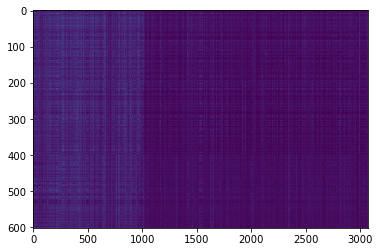

,AUC,pAUC
Source_0,0.584500,0.512105
Source_1,0.651000,0.565263
Source_2,0.679412,0.599400
Target_0,0.559900,0.549474
Target_1,0.565714,0.520193
Target_2,0.650135,0.518809
mean,0.615110,0.544207
h_mean,0.611579,0.542499


2021-04-26 16:50:43,684 - pytorch_modeler.py - INFO - epoch:39/300, train_losses:0.313184, val_AUC_hmean:0.611579, val_pAUC_hmean:0.542499, best_flag:True
2021-04-26 16:50:43,687 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.51it/s]
2021-04-26 16:50:44,260 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.78it/s]
2021-04-26 16:50:44,457 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.06it/s]
2021-04-26 16:50:44,650 - pytorch_modeler.py - INFO - epoch:40/300, train_losses:0.306307, val_AUC_hmean:0.614244, val_pAUC_hmean:0.540949, best_flag:False
2021-04-26 16:50:44,652 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.42it/s]
2021-04-26 16:50:45,239 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.02it/s]
2021-04-26 16:50:45,425 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


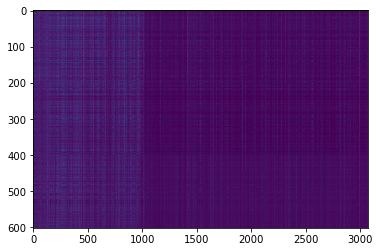

,AUC,pAUC
Source_0,0.639700,0.518947
Source_1,0.684500,0.576316
Source_2,0.674688,0.605498
Target_0,0.568000,0.551579
Target_1,0.582653,0.523953
Target_2,0.637255,0.515773
mean,0.631133,0.548678
h_mean,0.628114,0.546744


2021-04-26 16:50:46,594 - pytorch_modeler.py - INFO - epoch:41/300, train_losses:0.299315, val_AUC_hmean:0.628114, val_pAUC_hmean:0.546744, best_flag:True
2021-04-26 16:50:46,596 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.40it/s]
2021-04-26 16:50:47,186 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.45it/s]
2021-04-26 16:50:47,362 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.25it/s]


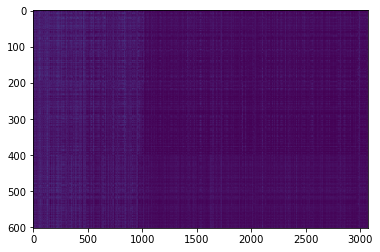

,AUC,pAUC
Source_0,0.661200,0.543158
Source_1,0.707500,0.578947
Source_2,0.659002,0.605029
Target_0,0.592000,0.548421
Target_1,0.564286,0.532438
Target_2,0.630623,0.511726
mean,0.635768,0.553287
h_mean,0.632221,0.551627


2021-04-26 16:50:48,525 - pytorch_modeler.py - INFO - epoch:42/300, train_losses:0.293142, val_AUC_hmean:0.632221, val_pAUC_hmean:0.551627, best_flag:True
2021-04-26 16:50:48,526 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.37it/s]
2021-04-26 16:50:49,121 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.54it/s]
2021-04-26 16:50:49,296 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.51it/s]


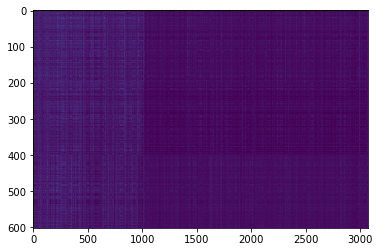

,AUC,pAUC
Source_0,0.663400,0.540000
Source_1,0.685800,0.585789
Source_2,0.687344,0.623323
Target_0,0.580900,0.551053
Target_1,0.569898,0.533512
Target_2,0.630719,0.509905
mean,0.636343,0.557264
h_mean,0.632773,0.554863


2021-04-26 16:50:50,411 - pytorch_modeler.py - INFO - epoch:43/300, train_losses:0.302643, val_AUC_hmean:0.632773, val_pAUC_hmean:0.554863, best_flag:True
2021-04-26 16:50:50,412 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.12it/s]
2021-04-26 16:50:51,054 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.85it/s]
2021-04-26 16:50:51,247 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.32it/s]
2021-04-26 16:50:51,433 - pytorch_modeler.py - INFO - epoch:44/300, train_losses:0.294386, val_AUC_hmean:0.636832, val_pAUC_hmean:0.554153, best_flag:False
2021-04-26 16:50:51,435 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.47it/s]
2021-04-26 16:50:52,014 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.90it/s]
2021-04-26 16:50:52,205 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.49it/s]
2021-04-26 16:50:52,390 -

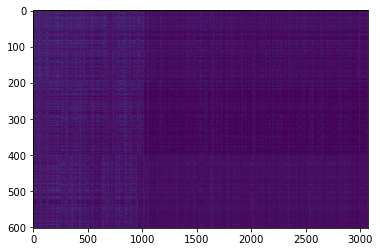

,AUC,pAUC
Source_0,0.704400,0.546842
Source_1,0.714600,0.584211
Source_2,0.724955,0.637865
Target_0,0.586000,0.544211
Target_1,0.579184,0.533727
Target_2,0.632161,0.523058
mean,0.656883,0.561652
h_mean,0.651228,0.559123


2021-04-26 16:50:55,315 - pytorch_modeler.py - INFO - epoch:47/300, train_losses:0.281343, val_AUC_hmean:0.651228, val_pAUC_hmean:0.559123, best_flag:True
2021-04-26 16:50:55,316 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.30it/s]
2021-04-26 16:50:55,924 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.87it/s]
2021-04-26 16:50:56,117 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.33it/s]
2021-04-26 16:50:56,300 - pytorch_modeler.py - INFO - epoch:48/300, train_losses:0.275091, val_AUC_hmean:0.641306, val_pAUC_hmean:0.558738, best_flag:False
2021-04-26 16:50:56,302 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.33it/s]
2021-04-26 16:50:56,905 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.03it/s]
2021-04-26 16:50:57,094 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


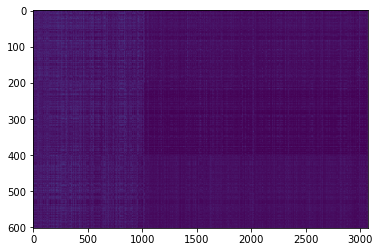

,AUC,pAUC
Source_0,0.662900,0.554737
Source_1,0.703600,0.588421
Source_2,0.712656,0.640210
Target_0,0.591900,0.544211
Target_1,0.589388,0.538238
Target_2,0.621684,0.527206
mean,0.647021,0.565504
h_mean,0.643247,0.563045


2021-04-26 16:50:58,338 - pytorch_modeler.py - INFO - epoch:49/300, train_losses:0.276604, val_AUC_hmean:0.643247, val_pAUC_hmean:0.563045, best_flag:True
2021-04-26 16:50:58,339 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.08it/s]
2021-04-26 16:50:58,990 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.43it/s]
2021-04-26 16:50:59,202 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


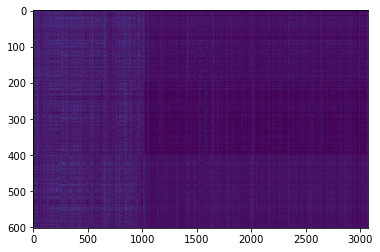

,AUC,pAUC
Source_0,0.680100,0.547368
Source_1,0.682300,0.589474
Source_2,0.732264,0.646777
Target_0,0.573700,0.542105
Target_1,0.585510,0.543609
Target_2,0.626490,0.529634
mean,0.646727,0.566495
h_mean,0.641793,0.563815


2021-04-26 16:51:00,402 - pytorch_modeler.py - INFO - epoch:50/300, train_losses:0.276699, val_AUC_hmean:0.641793, val_pAUC_hmean:0.563815, best_flag:True
2021-04-26 16:51:00,403 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.29it/s]
2021-04-26 16:51:01,013 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  3.09it/s]
2021-04-26 16:51:01,357 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  3.28it/s]
2021-04-26 16:51:01,692 - pytorch_modeler.py - INFO - epoch:51/300, train_losses:0.272480, val_AUC_hmean:0.632940, val_pAUC_hmean:0.562107, best_flag:False
2021-04-26 16:51:01,693 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.06it/s]
2021-04-26 16:51:02,349 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  3.17it/s]
2021-04-26 16:51:02,691 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  3.24it/s]
2021-04-26 16:51:03,023 -

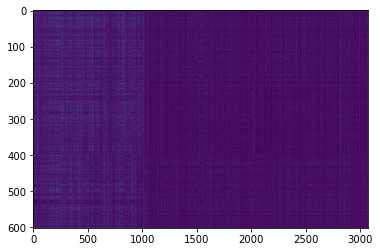

,AUC,pAUC
Source_0,0.711200,0.555263
Source_1,0.744600,0.591053
Source_2,0.748217,0.643494
Target_0,0.575300,0.535789
Target_1,0.562959,0.548872
Target_2,0.595925,0.530140
mean,0.656367,0.567435
h_mean,0.646677,0.564893


2021-04-26 16:51:05,328 - pytorch_modeler.py - INFO - epoch:53/300, train_losses:0.268212, val_AUC_hmean:0.646677, val_pAUC_hmean:0.564893, best_flag:True
2021-04-26 16:51:05,329 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.63it/s]
2021-04-26 16:51:05,763 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.91it/s]
2021-04-26 16:51:05,954 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


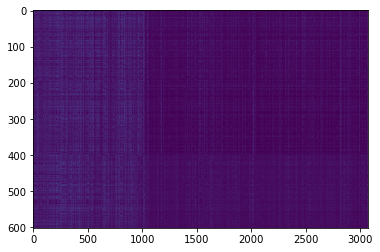

,AUC,pAUC
Source_0,0.701600,0.557895
Source_1,0.719800,0.590000
Source_2,0.745098,0.648654
Target_0,0.572800,0.536842
Target_1,0.582755,0.550269
Target_2,0.603518,0.532366
mean,0.654262,0.569338
h_mean,0.646869,0.566708


2021-04-26 16:51:07,090 - pytorch_modeler.py - INFO - epoch:54/300, train_losses:0.270950, val_AUC_hmean:0.646869, val_pAUC_hmean:0.566708, best_flag:True
2021-04-26 16:51:07,091 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.45it/s]
2021-04-26 16:51:07,542 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.30it/s]
2021-04-26 16:51:07,722 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


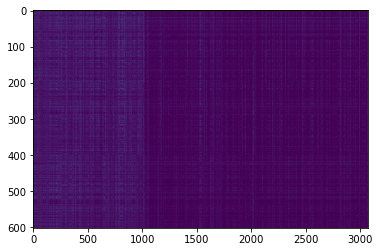

,AUC,pAUC
Source_0,0.714400,0.562105
Source_1,0.722700,0.592105
Source_2,0.731194,0.651468
Target_0,0.582800,0.543158
Target_1,0.592041,0.554995
Target_2,0.605152,0.530039
mean,0.658048,0.572312
h_mean,0.651571,0.569667


2021-04-26 16:51:08,844 - pytorch_modeler.py - INFO - epoch:55/300, train_losses:0.261889, val_AUC_hmean:0.651571, val_pAUC_hmean:0.569667, best_flag:True
2021-04-26 16:51:08,845 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.00it/s]
2021-04-26 16:51:09,348 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  4.87it/s]
2021-04-26 16:51:09,580 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.42it/s]
2021-04-26 16:51:09,789 - pytorch_modeler.py - INFO - epoch:56/300, train_losses:0.264100, val_AUC_hmean:0.647946, val_pAUC_hmean:0.569370, best_flag:False
2021-04-26 16:51:09,790 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.44it/s]
2021-04-26 16:51:10,243 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.10it/s]
2021-04-26 16:51:10,429 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.69it/s]
2021-04-26 16:51:10,606 -

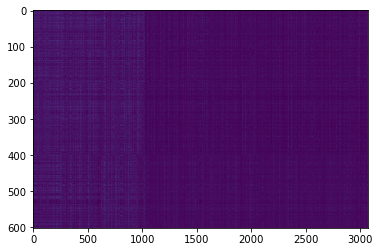

,AUC,pAUC
Source_0,0.705700,0.566842
Source_1,0.724300,0.602105
Source_2,0.734492,0.645839
Target_0,0.565700,0.540526
Target_1,0.558367,0.562299
Target_2,0.605536,0.536110
mean,0.649016,0.575620
h_mean,0.640393,0.573223


2021-04-26 16:51:15,324 - pytorch_modeler.py - INFO - epoch:62/300, train_losses:0.247903, val_AUC_hmean:0.640393, val_pAUC_hmean:0.573223, best_flag:True
2021-04-26 16:51:15,325 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.72it/s]
2021-04-26 16:51:15,751 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.78it/s]
2021-04-26 16:51:15,918 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.85it/s]
2021-04-26 16:51:16,088 - pytorch_modeler.py - INFO - epoch:63/300, train_losses:0.252822, val_AUC_hmean:0.642686, val_pAUC_hmean:0.569315, best_flag:False
2021-04-26 16:51:16,089 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.86it/s]
2021-04-26 16:51:16,502 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.77it/s]
2021-04-26 16:51:16,696 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.42it/s]
2021-04-26 16:51:16,877 -

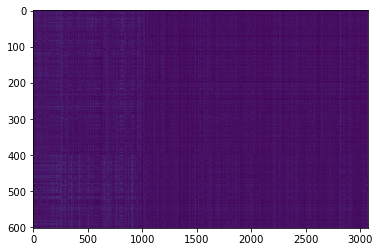

,AUC,pAUC
Source_0,0.686100,0.576842
Source_1,0.697900,0.601579
Source_2,0.726916,0.657097
Target_0,0.589600,0.546842
Target_1,0.587347,0.568958
Target_2,0.591215,0.536615
mean,0.646513,0.581322
h_mean,0.641291,0.578730


2021-04-26 16:51:20,416 - pytorch_modeler.py - INFO - epoch:67/300, train_losses:0.243949, val_AUC_hmean:0.641291, val_pAUC_hmean:0.578730, best_flag:True
2021-04-26 16:51:20,417 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.07it/s]
2021-04-26 16:51:20,911 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.22it/s]
2021-04-26 16:51:21,092 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.72it/s]
2021-04-26 16:51:21,293 - pytorch_modeler.py - INFO - epoch:68/300, train_losses:0.241103, val_AUC_hmean:0.638841, val_pAUC_hmean:0.574442, best_flag:False
2021-04-26 16:51:21,294 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.35it/s]
2021-04-26 16:51:21,757 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.50it/s]
2021-04-26 16:51:21,932 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.37it/s]
2021-04-26 16:51:22,123 -

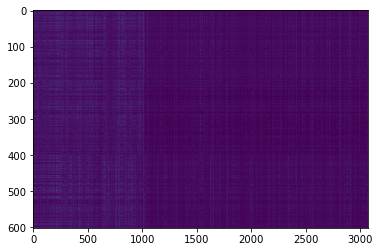

,AUC,pAUC
Source_0,0.727300,0.574737
Source_1,0.730800,0.609474
Source_2,0.740553,0.662257
Target_0,0.586300,0.538947
Target_1,0.589082,0.562299
Target_2,0.614091,0.545822
mean,0.664687,0.582256
h_mean,0.657516,0.579338


2021-04-26 16:51:27,145 - pytorch_modeler.py - INFO - epoch:74/300, train_losses:0.226984, val_AUC_hmean:0.657516, val_pAUC_hmean:0.579338, best_flag:True
2021-04-26 16:51:27,146 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.17it/s]
2021-04-26 16:51:27,628 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.83it/s]
2021-04-26 16:51:27,821 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.05it/s]
2021-04-26 16:51:28,015 - pytorch_modeler.py - INFO - epoch:75/300, train_losses:0.222644, val_AUC_hmean:0.653661, val_pAUC_hmean:0.579319, best_flag:False
2021-04-26 16:51:28,016 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.69it/s]
2021-04-26 16:51:28,446 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.45it/s]
2021-04-26 16:51:28,621 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.49it/s]


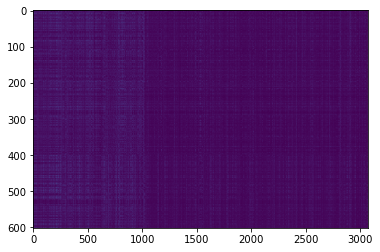

,AUC,pAUC
Source_0,0.748300,0.588947
Source_1,0.738300,0.606316
Source_2,0.757487,0.673046
Target_0,0.576900,0.540526
Target_1,0.583776,0.559721
Target_2,0.594387,0.545317
mean,0.666525,0.585646
h_mean,0.656471,0.582327


2021-04-26 16:51:29,724 - pytorch_modeler.py - INFO - epoch:76/300, train_losses:0.223829, val_AUC_hmean:0.656471, val_pAUC_hmean:0.582327, best_flag:True
2021-04-26 16:51:29,725 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.52it/s]
2021-04-26 16:51:30,170 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.30it/s]
2021-04-26 16:51:30,349 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.51it/s]
2021-04-26 16:51:30,525 - pytorch_modeler.py - INFO - epoch:77/300, train_losses:0.219941, val_AUC_hmean:0.658865, val_pAUC_hmean:0.577555, best_flag:False
2021-04-26 16:51:30,527 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.70it/s]
2021-04-26 16:51:30,954 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.54it/s]
2021-04-26 16:51:31,127 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.50it/s]
2021-04-26 16:51:31,303 -

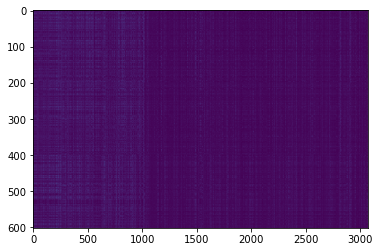

,AUC,pAUC
Source_0,0.764900,0.597895
Source_1,0.768900,0.605263
Source_2,0.746613,0.667417
Target_0,0.580000,0.541053
Target_1,0.594388,0.555854
Target_2,0.579585,0.546935
mean,0.672398,0.585736
h_mean,0.660850,0.582599


2021-04-26 16:51:32,993 - pytorch_modeler.py - INFO - epoch:79/300, train_losses:0.222368, val_AUC_hmean:0.660850, val_pAUC_hmean:0.582599, best_flag:True
2021-04-26 16:51:32,994 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.38it/s]
2021-04-26 16:51:33,453 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.64it/s]
2021-04-26 16:51:33,622 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.53it/s]
2021-04-26 16:51:33,799 - pytorch_modeler.py - INFO - epoch:80/300, train_losses:0.218141, val_AUC_hmean:0.647192, val_pAUC_hmean:0.575203, best_flag:False
2021-04-26 16:51:33,800 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.50it/s]
2021-04-26 16:51:34,246 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.26it/s]
2021-04-26 16:51:34,426 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.56it/s]
2021-04-26 16:51:34,630 -

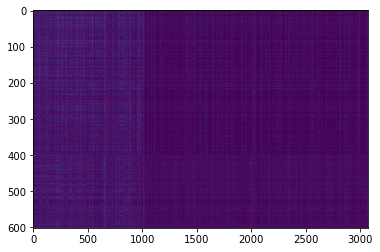

,AUC,pAUC
Source_0,0.692400,0.570526
Source_1,0.738300,0.624737
Source_2,0.746078,0.681959
Target_0,0.600600,0.546316
Target_1,0.578265,0.561010
Target_2,0.609477,0.541775
mean,0.660853,0.587720
h_mean,0.654014,0.583741


2021-04-26 16:51:38,102 - pytorch_modeler.py - INFO - epoch:84/300, train_losses:0.215741, val_AUC_hmean:0.654014, val_pAUC_hmean:0.583741, best_flag:True
2021-04-26 16:51:38,104 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.29it/s]
2021-04-26 16:51:38,573 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.97it/s]
2021-04-26 16:51:38,765 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.09it/s]
2021-04-26 16:51:38,953 - pytorch_modeler.py - INFO - epoch:85/300, train_losses:0.210296, val_AUC_hmean:0.654804, val_pAUC_hmean:0.582656, best_flag:False
2021-04-26 16:51:38,954 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.31it/s]
2021-04-26 16:51:39,420 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.48it/s]
2021-04-26 16:51:39,598 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.10it/s]
2021-04-26 16:51:39,786 -

100%|██████████| 1/1 [00:00<00:00,  6.25it/s]
2021-04-26 16:51:52,004 - pytorch_modeler.py - INFO - epoch:101/300, train_losses:0.193490, val_AUC_hmean:0.651081, val_pAUC_hmean:0.575549, best_flag:False
2021-04-26 16:51:52,006 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.73it/s]
2021-04-26 16:51:52,431 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.59it/s]
2021-04-26 16:51:52,630 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.52it/s]
2021-04-26 16:51:52,805 - pytorch_modeler.py - INFO - epoch:102/300, train_losses:0.192666, val_AUC_hmean:0.665725, val_pAUC_hmean:0.579572, best_flag:False
2021-04-26 16:51:52,807 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.52it/s]
2021-04-26 16:51:53,251 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.39it/s]
2021-04-26 16:51:53,427 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [

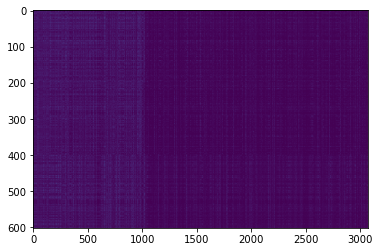

,AUC,pAUC
Source_0,0.686300,0.556842
Source_1,0.767700,0.637895
Source_2,0.747594,0.676799
Target_0,0.589200,0.542105
Target_1,0.589592,0.575618
Target_2,0.613706,0.545418
mean,0.665682,0.589113
h_mean,0.657891,0.584999


2021-04-26 16:51:57,101 - pytorch_modeler.py - INFO - epoch:106/300, train_losses:0.190874, val_AUC_hmean:0.657891, val_pAUC_hmean:0.584999, best_flag:True
2021-04-26 16:51:57,102 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.44it/s]
2021-04-26 16:51:57,555 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.51it/s]
2021-04-26 16:51:57,728 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.25it/s]
2021-04-26 16:51:57,915 - pytorch_modeler.py - INFO - epoch:107/300, train_losses:0.186965, val_AUC_hmean:0.645006, val_pAUC_hmean:0.576953, best_flag:False
2021-04-26 16:51:57,916 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.54it/s]
2021-04-26 16:51:58,359 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.32it/s]
2021-04-26 16:51:58,542 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.21it/s]
2021-04-26 16:51:58,735

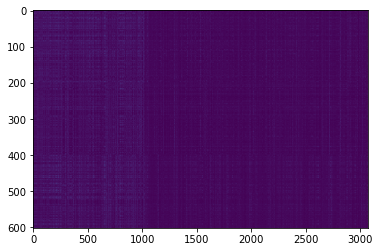

,AUC,pAUC
Source_0,0.743900,0.571579
Source_1,0.778500,0.630000
Source_2,0.742870,0.682897
Target_0,0.570900,0.547895
Target_1,0.575918,0.556284
Target_2,0.596597,0.548959
mean,0.668114,0.589602
h_mean,0.656522,0.585615


2021-04-26 16:52:23,310 - pytorch_modeler.py - INFO - epoch:137/300, train_losses:0.159740, val_AUC_hmean:0.656522, val_pAUC_hmean:0.585615, best_flag:True
2021-04-26 16:52:23,311 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.23it/s]
2021-04-26 16:52:23,787 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.87it/s]
2021-04-26 16:52:23,978 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.73it/s]
2021-04-26 16:52:24,178 - pytorch_modeler.py - INFO - epoch:138/300, train_losses:0.156509, val_AUC_hmean:0.650807, val_pAUC_hmean:0.580116, best_flag:False
2021-04-26 16:52:24,180 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.66it/s]
2021-04-26 16:52:24,611 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.97it/s]
2021-04-26 16:52:24,799 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.48it/s]
2021-04-26 16:52:24,981

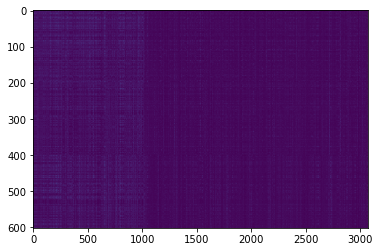

,AUC,pAUC
Source_0,0.727100,0.571053
Source_1,0.797000,0.632105
Source_2,0.762834,0.690872
Target_0,0.582000,0.543158
Target_1,0.567551,0.561010
Target_2,0.602557,0.552500
mean,0.673174,0.591783
h_mean,0.660742,0.587420


2021-04-26 16:52:26,847 - pytorch_modeler.py - INFO - epoch:140/300, train_losses:0.155468, val_AUC_hmean:0.660742, val_pAUC_hmean:0.587420, best_flag:True
2021-04-26 16:52:26,848 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.45it/s]
2021-04-26 16:52:27,300 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.76it/s]
2021-04-26 16:52:27,499 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.59it/s]
2021-04-26 16:52:27,675 - pytorch_modeler.py - INFO - epoch:141/300, train_losses:0.152847, val_AUC_hmean:0.656084, val_pAUC_hmean:0.585308, best_flag:False
2021-04-26 16:52:27,677 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.41it/s]
2021-04-26 16:52:28,132 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.19it/s]
2021-04-26 16:52:28,314 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.24it/s]


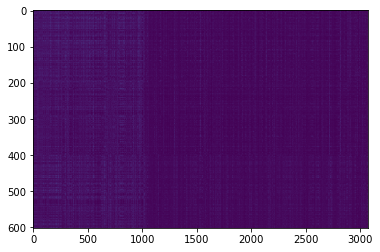

,AUC,pAUC
Source_0,0.746300,0.583158
Source_1,0.800000,0.646842
Source_2,0.741800,0.687588
Target_0,0.596500,0.551579
Target_1,0.567041,0.561117
Target_2,0.582853,0.548352
mean,0.672416,0.596439
h_mean,0.659797,0.592071


2021-04-26 16:52:29,447 - pytorch_modeler.py - INFO - epoch:142/300, train_losses:0.150338, val_AUC_hmean:0.659797, val_pAUC_hmean:0.592071, best_flag:True
2021-04-26 16:52:29,448 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.39it/s]
2021-04-26 16:52:29,905 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.16it/s]
2021-04-26 16:52:30,089 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.50it/s]
2021-04-26 16:52:30,265 - pytorch_modeler.py - INFO - epoch:143/300, train_losses:0.151924, val_AUC_hmean:0.657108, val_pAUC_hmean:0.585800, best_flag:False
2021-04-26 16:52:30,267 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.69it/s]
2021-04-26 16:52:30,696 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.21it/s]
2021-04-26 16:52:30,877 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.25it/s]
2021-04-26 16:52:31,062

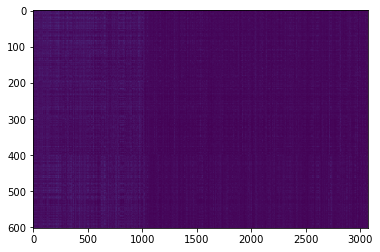

,AUC,pAUC
Source_0,0.756900,0.595789
Source_1,0.830500,0.645789
Source_2,0.764439,0.692279
Target_0,0.592900,0.547895
Target_1,0.569082,0.562084
Target_2,0.593618,0.548352
mean,0.684573,0.598698
h_mean,0.669505,0.594098


2021-04-26 16:52:55,759 - pytorch_modeler.py - INFO - epoch:173/300, train_losses:0.130625, val_AUC_hmean:0.669505, val_pAUC_hmean:0.594098, best_flag:True
2021-04-26 16:52:55,760 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.26it/s]
2021-04-26 16:52:56,232 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.73it/s]
2021-04-26 16:52:56,432 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.84it/s]
2021-04-26 16:52:56,637 - pytorch_modeler.py - INFO - epoch:174/300, train_losses:0.130435, val_AUC_hmean:0.664706, val_pAUC_hmean:0.583069, best_flag:False
2021-04-26 16:52:56,639 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.18it/s]
2021-04-26 16:52:57,120 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  5.03it/s]
2021-04-26 16:52:57,345 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.48it/s]
2021-04-26 16:52:57,527

100%|██████████| 2/2 [00:00<00:00,  4.57it/s]
2021-04-26 16:53:22,945 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.44it/s]
2021-04-26 16:53:23,120 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.50it/s]
2021-04-26 16:53:23,297 - pytorch_modeler.py - INFO - epoch:207/300, train_losses:0.111623, val_AUC_hmean:0.663192, val_pAUC_hmean:0.583893, best_flag:False
2021-04-26 16:53:23,298 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.68it/s]
2021-04-26 16:53:23,727 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.28it/s]
2021-04-26 16:53:23,908 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.27it/s]
2021-04-26 16:53:24,099 - pytorch_modeler.py - INFO - epoch:208/300, train_losses:0.114799, val_AUC_hmean:0.648977, val_pAUC_hmean:0.585058, best_flag:False
2021-04-26 16:53:24,101 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [

2021-04-26 16:53:36,556 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.18it/s]
2021-04-26 16:53:37,036 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.38it/s]
2021-04-26 16:53:37,213 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.30it/s]
2021-04-26 16:53:37,394 - pytorch_modeler.py - INFO - epoch:224/300, train_losses:0.103378, val_AUC_hmean:0.674526, val_pAUC_hmean:0.589016, best_flag:False
2021-04-26 16:53:37,396 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.53it/s]
2021-04-26 16:53:37,839 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.22it/s]
2021-04-26 16:53:38,020 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.43it/s]
2021-04-26 16:53:38,199 - pytorch_modeler.py - INFO - epoch:225/300, train_losses:0.103465, val_AUC_hmean:0.658408, val_pAUC_hmean:0.587821, best_flag:False
2021-04-26 16:53:38,20

2021-04-26 16:53:50,508 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.53it/s]
2021-04-26 16:53:50,951 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.35it/s]
2021-04-26 16:53:51,129 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.32it/s]
2021-04-26 16:53:51,316 - pytorch_modeler.py - INFO - epoch:241/300, train_losses:0.094863, val_AUC_hmean:0.660464, val_pAUC_hmean:0.589149, best_flag:False
2021-04-26 16:53:51,317 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.45it/s]
2021-04-26 16:53:51,769 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.60it/s]
2021-04-26 16:53:51,942 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  5.78it/s]
2021-04-26 16:53:52,142 - pytorch_modeler.py - INFO - epoch:242/300, train_losses:0.092773, val_AUC_hmean:0.656618, val_pAUC_hmean:0.589339, best_flag:False
2021-04-26 16:53:52,14

2021-04-26 16:54:04,460 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.75it/s]
2021-04-26 16:54:04,883 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.62it/s]
2021-04-26 16:54:05,055 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.64it/s]
2021-04-26 16:54:05,229 - pytorch_modeler.py - INFO - epoch:258/300, train_losses:0.089917, val_AUC_hmean:0.668139, val_pAUC_hmean:0.590189, best_flag:False
2021-04-26 16:54:05,230 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.95it/s]
2021-04-26 16:54:05,637 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.53it/s]
2021-04-26 16:54:05,809 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.31it/s]
2021-04-26 16:54:05,993 - pytorch_modeler.py - INFO - epoch:259/300, train_losses:0.089507, val_AUC_hmean:0.666877, val_pAUC_hmean:0.587528, best_flag:False
2021-04-26 16:54:05,99

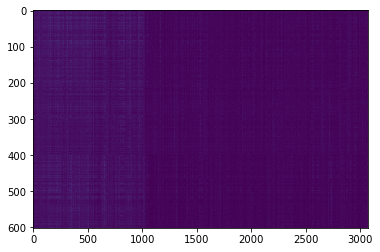

,AUC,pAUC
Source_0,0.723300,0.571579
Source_1,0.816000,0.656842
Source_2,0.771212,0.691810
Target_0,0.582700,0.550000
Target_1,0.578980,0.573147
Target_2,0.597366,0.554928
mean,0.678260,0.599718
h_mean,0.665038,0.595095


2021-04-26 16:54:15,486 - pytorch_modeler.py - INFO - epoch:270/300, train_losses:0.087940, val_AUC_hmean:0.665038, val_pAUC_hmean:0.595095, best_flag:True
2021-04-26 16:54:15,487 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.86it/s]
2021-04-26 16:54:15,900 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.83it/s]
2021-04-26 16:54:16,068 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.77it/s]
2021-04-26 16:54:16,238 - pytorch_modeler.py - INFO - epoch:271/300, train_losses:0.084574, val_AUC_hmean:0.661231, val_pAUC_hmean:0.590722, best_flag:False
2021-04-26 16:54:16,239 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  4.82it/s]
2021-04-26 16:54:16,657 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.53it/s]
2021-04-26 16:54:16,830 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.33it/s]
2021-04-26 16:54:17,010

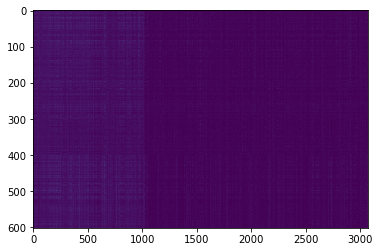

,AUC,pAUC
Source_0,0.743300,0.582105
Source_1,0.824800,0.656316
Source_2,0.785651,0.690402
Target_0,0.578700,0.542105
Target_1,0.561020,0.573577
Target_2,0.587851,0.555636
mean,0.680220,0.600024
h_mean,0.663556,0.595366


2021-04-26 16:54:38,169 - pytorch_modeler.py - INFO - epoch:297/300, train_losses:0.073439, val_AUC_hmean:0.663556, val_pAUC_hmean:0.595366, best_flag:True
2021-04-26 16:54:38,170 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.67it/s]
2021-04-26 16:54:38,717 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.47it/s]
2021-04-26 16:54:38,894 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.20it/s]
2021-04-26 16:54:39,082 - pytorch_modeler.py - INFO - epoch:298/300, train_losses:0.073626, val_AUC_hmean:0.665569, val_pAUC_hmean:0.592979, best_flag:False
2021-04-26 16:54:39,083 - pytorch_modeler.py - INFO - train
100%|██████████| 2/2 [00:00<00:00,  3.55it/s]
2021-04-26 16:54:39,649 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 1/1 [00:00<00:00,  6.58it/s]
2021-04-26 16:54:39,825 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 1/1 [00:00<00:00,  6.13it/s]
2021-04-26 16:54:40,013

,AUC,pAUC
Source_0,0.743300,0.582105
Source_1,0.824800,0.656316
Source_2,0.785651,0.690402
Target_0,0.578700,0.542105
Target_1,0.561020,0.573577
Target_2,0.587851,0.555636
mean,0.680220,0.600024
h_mean,0.663556,0.595366


elapsed time: 283.597630978 [sec]


In [10]:
for machine_type in machine_types:
    run(machine_type)